In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from sklearn.cluster import KMeans
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
import matplotlib.cm as cm
import mapclassify as mcl
from matplotlib.colors import Normalize
import geopandas as gdp
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima_model import ARMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [3]:
crimes_df = pd.read_csv("crimeplot.csv")

In [3]:
crimes_main_df = crimes_df.copy()

In [4]:
crimes_df["TOTAL_THEFT"] = crimes_df["THEFT"] + crimes_df["OTHER THEFT"] + crimes_df["AUTO THEFT"]

In [5]:
crimes_df.columns

Index(['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'TOTAL_THEFT'],
      dtype='object')

In [6]:
fp = "D:\\Igismap\\Indian_States.shp"
map_India = gdp.read_file(fp)

In [7]:
map_India['st_nm'] = map_India['st_nm'].replace(['Andaman & Nicobar Island', "Andhra Pradesh", 'Arunanchal Pradesh', 'Assam', 'Bihar', 'Chandigarh', 'Chhattisgarh', 'Dadara & Nagar Havelli', 'Daman & Diu', 'NCT of Delhi', 'Goa', 'Gujarat', 'Haryana', 'Himachal Pradesh', 'Jammu & Kashmir', 'Jharkhand', 'Karnataka', 'Kerala', 'Lakshadweep', 'Madhya Pradesh', 'Maharashtra', 'Manipur',
       'Meghalaya', 'Mizoram', 'Nagaland', 'Odisha', 'Puducherry', 'Punjab', 'Rajasthan', 'Sikkim', 'Tamil Nadu', 'Tripura', 'Uttar Pradesh', 'Uttarakhand', 'West Bengal'], 
                                                ["A & N ISLANDS", "ANDHRA PRADESH", 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR', 'CHANDIGARH', 'CHHATTISGARH', 'D & N HAVELI', 'DAMAN & DIU', 'DELHI UT', 'GOA', 'GUJARAT', 'HARYANA', 'HIMACHAL PRADESH', 'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA', 'LAKSHADWEEP', 'MADHYA PRADESH', 'MAHARASHTRA', 'MANIPUR',
       'MEGHALAYA', 'MIZORAM', 'NAGALAND','ODISHA', 'PUDUCHERRY', 'PUNJAB', 'RAJASTHAN', 'SIKKIM', 'TAMIL NADU', 'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND',  'WEST BENGAL'])
  

In [8]:
crimes_df.head(5)

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,TOTAL_THEFT
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,1131,16,149,34,175,0,181,1518,4154,398
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,1543,7,118,24,154,0,270,754,4125,732
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,2088,14,112,83,186,0,404,1262,5818,1446
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,795,17,126,38,57,0,233,1181,3140,346
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,1244,12,109,58,247,0,431,2313,6507,2042


In [9]:
crimes_df.columns

Index(['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'TOTAL_THEFT'],
      dtype='object')

In [10]:
crimes_df = crimes_df.rename(columns={'STATE/UT': 'STATE'})

In [11]:
crimes_df = crimes_df.rename(columns={'TOTAL IPC CRIMES': 'TOTAL'})

In [12]:
crimes_df['STATE'] = crimes_df['STATE'].replace(['A&N Islands', "Andhra Pradesh", 'Arunachal Pradesh', 'Assam', 'Bihar', 'Chandigarh', 'Chhattisgarh', 'D&N Haveli', 'Daman & Diu', 'Delhi UT', 'Goa', 'Gujarat', 'Haryana', 'Himachal Pradesh', 'Jammu & Kashmir', 'Jharkhand', 'Karnataka', 'Kerala', 'Lakshadweep', 'Madhya Pradesh', 'Maharashtra', 'Manipur',
       'Meghalaya', 'Mizoram', 'Nagaland', 'Odisha', 'Puducherry', 'Punjab', 'Rajasthan', 'Sikkim', 'Tamil Nadu', 'Tripura', 'Uttar Pradesh', 'Uttarakhand', 'West Bengal'], 
                                                ["A & N ISLANDS", "ANDHRA PRADESH", 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR', 'CHANDIGARH', 'CHHATTISGARH', 'D & N HAVELI', 'DAMAN & DIU', 'DELHI UT', 'GOA', 'GUJARAT', 'HARYANA', 'HIMACHAL PRADESH', 'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA', 'LAKSHADWEEP', 'MADHYA PRADESH', 'MAHARASHTRA', 'MANIPUR',
       'MEGHALAYA', 'MIZORAM', 'NAGALAND','ODISHA', 'PUDUCHERRY', 'PUNJAB', 'RAJASTHAN', 'SIKKIM', 'TAMIL NADU', 'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND',  'WEST BENGAL'])
 

In [13]:
crimes_df['DISTRICT'] = crimes_df['DISTRICT'].replace(["ZZ TOTAL"], ["TOTAL"])

In [14]:
crimes_df['DISTRICT'] = crimes_df['DISTRICT'].replace(["SOUTH-EAST", "SOUTH-WEST", "NORTH-EAST", "NORTH-WEST",
                                                     "IGI AIRPORT", "GRP(RLY)", "STF", 'DELHI UT TOTAL'], ["SOUTH EAST", "SOUTH WEST", "NORTH EAST", "NORTH WEST",
                                                     "I.G.I. AIRPORT", "G.R.P.(RLY)", "S.T.F.", 'TOTAL'])

In [15]:
crimes_df['DISTRICT'] = crimes_df['DISTRICT'].replace(["HOWRAH CITY"], ["HOWRAH"])

In [16]:
crimes_df['DISTRICT'] = crimes_df['DISTRICT'].replace(["HOWRAH G.R.P."], ["HOWRAH"])

In [17]:
crimes_df['DISTRICT'] = crimes_df['DISTRICT'].replace(['G.R.P. AJMER', 'G.R.P. JODHPUR'],['G.R.P.AJMER', 'G.R.P.JODHPUR'])

In [18]:
crimes_df.rename(columns={'HURT/GREVIOUS HURT': 'HURT', 'KIDNAPPING & ABDUCTION': 'KIDNAPPING', 'CAUSING DEATH BY NEGLIGENCE':'DEATH_BY_NEGLIGENCE', 
                          'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY':'ASSAULT_WOMEN_MODESTY','CRUELTY BY HUSBAND OR HIS RELATIVES': 'CRUELTY_BY_HUSBAND', 
                         'CRIMINAL BREACH OF TRUST':'CRIMINAL_BREACH_OF_TRUST'}, inplace=True)

In [19]:
crimes_df['STATE'].unique()

array(['ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR',
       'CHHATTISGARH', 'GOA', 'GUJARAT', 'HARYANA', 'HIMACHAL PRADESH',
       'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA',
       'MADHYA PRADESH', 'MAHARASHTRA', 'MANIPUR', 'MEGHALAYA', 'MIZORAM',
       'NAGALAND', 'ODISHA', 'PUNJAB', 'RAJASTHAN', 'SIKKIM',
       'TAMIL NADU', 'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND',
       'WEST BENGAL', 'A & N ISLANDS', 'CHANDIGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI UT', 'LAKSHADWEEP', 'PUDUCHERRY'],
      dtype=object)

In [20]:
crimes_df.shape

(9840, 34)

In [21]:
crimes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9840 entries, 0 to 9839
Data columns (total 34 columns):
STATE                                          9840 non-null object
DISTRICT                                       9840 non-null object
YEAR                                           9840 non-null int64
MURDER                                         9840 non-null int64
ATTEMPT TO MURDER                              9840 non-null int64
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER      9840 non-null int64
RAPE                                           9840 non-null int64
CUSTODIAL RAPE                                 9840 non-null int64
OTHER RAPE                                     9840 non-null int64
KIDNAPPING                                     9840 non-null int64
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS    9840 non-null int64
KIDNAPPING AND ABDUCTION OF OTHERS             9840 non-null int64
DACOITY                                        9840 non-null int64
PREPARATION AND ASSE

In [22]:
crimes_state = crimes_df.groupby("STATE").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum ,'OTHER IPC CRIMES':sum, 'TOTAL':sum}).reset_index()
       

In [23]:
merged_Ind = map_India.set_index('st_nm').join(crimes_state.set_index('STATE'))
merged_Ind.head()

,geometry,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,TOTAL
st_nm,,,,,,,,,,,,,
A & N ISLANDS,"MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2...",4644.0,2320.0,216.0,260.0,1868.0,332.0,96.0,556.0,280.0,518.0,9532.0,19428.0
ARUNACHAL PRADESH,"POLYGON ((96.16261 29.38078, 96.16860 29.37432...",22768.0,11310.0,1998.0,392.0,5952.0,1820.0,1748.0,1184.0,752.0,1754.0,16260.0,60856.0
ASSAM,"MULTIPOLYGON (((89.74323 26.30362, 89.74290 26...",383960.0,154708.0,65480.0,96048.0,78086.0,33572.0,66538.0,29898.0,74784.0,32058.0,428058.0,1369900.0
BIHAR,"MULTIPOLYGON (((84.50720 24.26323, 84.50355 24...",699180.0,449882.0,85580.0,60426.0,88956.0,89372.0,97348.0,70344.0,234054.0,15814.0,1197894.0,3027496.0
CHANDIGARH,"POLYGON ((76.84147 30.75996, 76.83599 30.73623...",79972.0,1750.0,1802.0,1798.0,6410.0,530.0,208.0,5170.0,1618.0,914.0,25502.0,89768.0


In [24]:
merged_Ind.isna().sum()

geometry                 0
TOTAL_THEFT              1
HURT                     1
KIDNAPPING               1
CRUELTY_BY_HUSBAND       1
BURGLARY                 1
MURDER                   1
DEATH_BY_NEGLIGENCE      1
CHEATING                 1
RIOTS                    1
ASSAULT_WOMEN_MODESTY    1
OTHER IPC CRIMES         1
TOTAL                    1
dtype: int64

In [25]:
crimes_distribution = crimes_df[crimes_df.DISTRICT=='TOTAL']


In [26]:
crimes_distribution = crimes_distribution.groupby(["YEAR"]).agg({'MURDER':sum, 'ATTEMPT TO MURDER':sum,
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER':sum, 'RAPE':sum, 'CUSTODIAL RAPE':sum,
       'OTHER RAPE':sum, 'KIDNAPPING':sum,
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS':sum,
       'KIDNAPPING AND ABDUCTION OF OTHERS':sum, 'DACOITY':sum,
       'PREPARATION AND ASSEMBLY FOR DACOITY':sum, 'ROBBERY':sum, 'BURGLARY':sum,
        'RIOTS':sum, 'CRIMINAL_BREACH_OF_TRUST':sum,
       'CHEATING':sum, 'COUNTERFIETING':sum, 'ARSON':sum, 'HURT':sum,
       'DOWRY DEATHS':sum, 'ASSAULT_WOMEN_MODESTY':sum,
       'INSULT TO MODESTY OF WOMEN':sum, 'CRUELTY_BY_HUSBAND':sum,
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES':sum,
       'DEATH_BY_NEGLIGENCE':sum, 'OTHER IPC CRIMES':sum, "TOTAL_THEFT":sum}).reset_index()
       

In [27]:
crimes_distribution = crimes_distribution.append(crimes_distribution.sum().rename('total'))
crimes_distribution['YEAR'].replace(26091, 'Total', inplace=True)
crimes_distribution = crimes_distribution[crimes_distribution['YEAR'] == 'Total']
crimes_sum = crimes_distribution.T.reset_index()


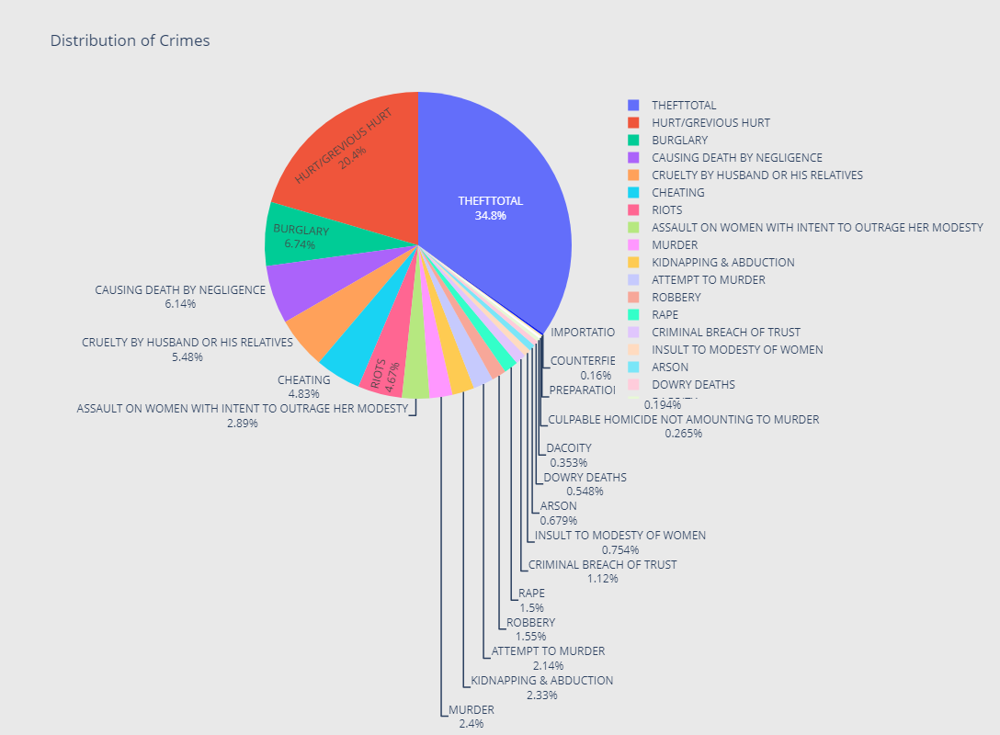

In [28]:

labels = ['MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY',
       'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', "THEFTTOTAL"]

values = [435744, 387394, 47994, 272844, 422318, 63948, 35100, 280194, 1221740,847053,
         203648, 874927, 29067, 123061, 3706545, 99285, 523894, 136643, 994067, 923, 1113381, 6310244]
fig = go.Figure(data=[go.Pie(labels=labels, values=values ,textinfo='label+percent',
                              )])
fig.update_layout(
    uniformtext_minsize= 20,
    title_text="Distribution of Crimes",
    paper_bgcolor='rgb(233,233,233)',
    autosize=False,
    width=1150,
    height=800)
fig.show()

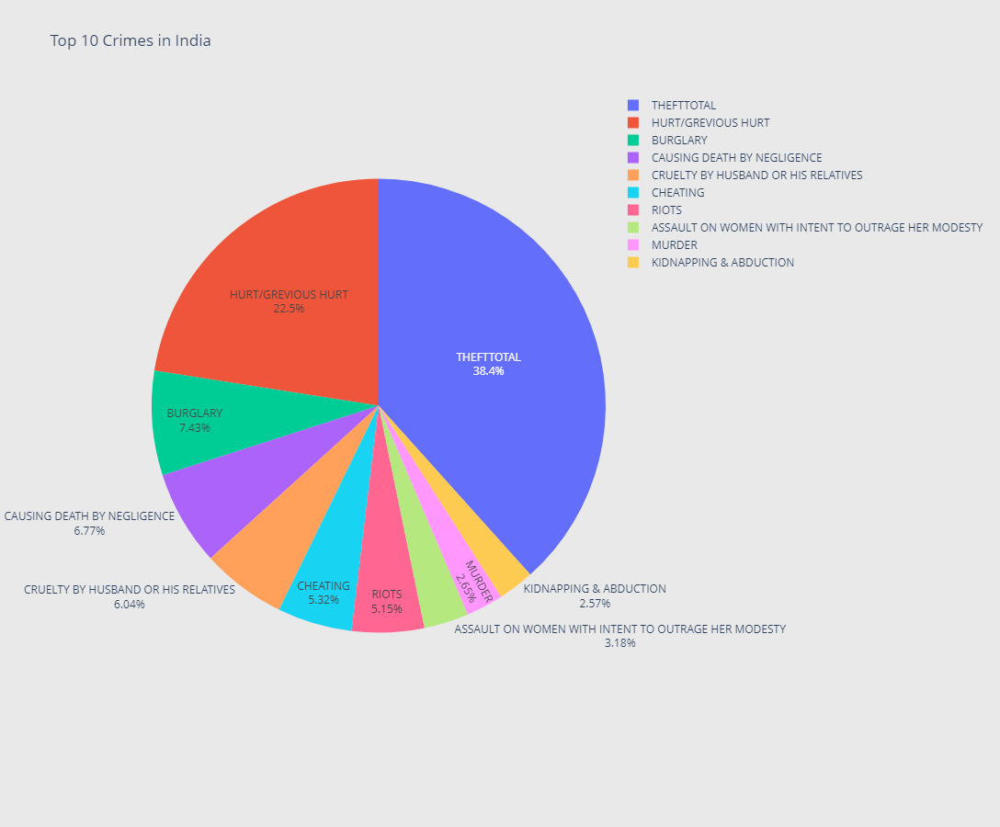

In [29]:

labels = ['MURDER', 'KIDNAPPING & ABDUCTION', 'BURGLARY',
        'RIOTS',
        'CHEATING', 'HURT/GREVIOUS HURT',
        'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
        'CRUELTY BY HUSBAND OR HIS RELATIVES',
        'CAUSING DEATH BY NEGLIGENCE', "THEFTTOTAL"]

values = [435744, 422318, 1221740,847053,
          874927, 3706545, 523894, 994067, 1113381, 6310244]
fig = go.Figure(data=[go.Pie(labels=labels, values=values ,textinfo='label+percent',
                              )])
fig.update_layout(
    uniformtext_minsize= 20,
    title_text="Top 10 Crimes in India",
    paper_bgcolor='rgb(233,233,233)',
    autosize=False,
    width=1000,
    height=900)
fig.show()

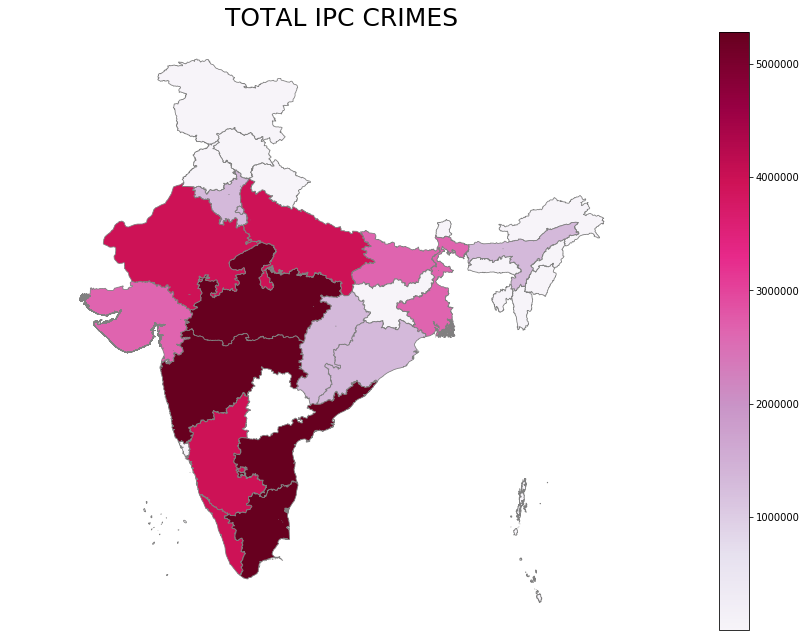

In [30]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('TOTAL IPC CRIMES', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='TOTAL', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['TOTAL'].min(), vmax= merged_Ind["TOTAL"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

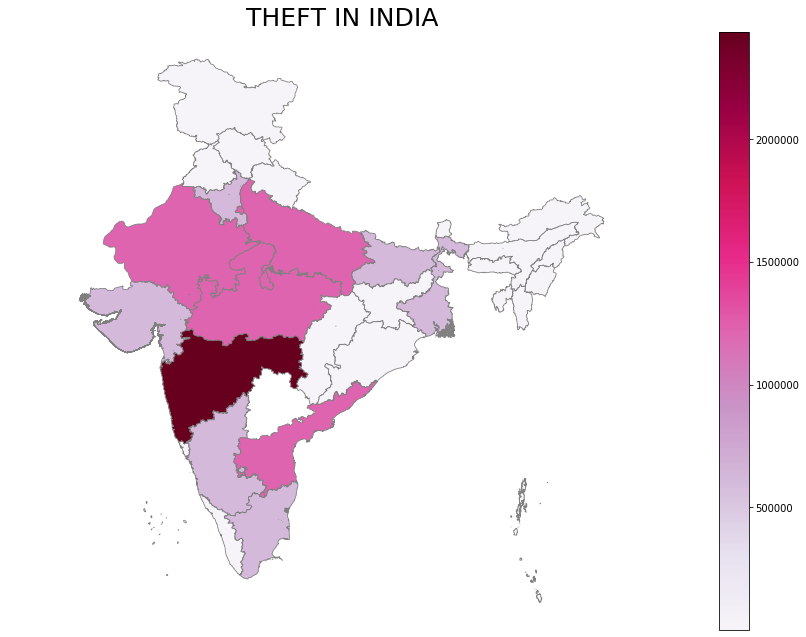

In [31]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('THEFT IN INDIA', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='TOTAL_THEFT', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['TOTAL_THEFT'].min(), vmax= merged_Ind["TOTAL_THEFT"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

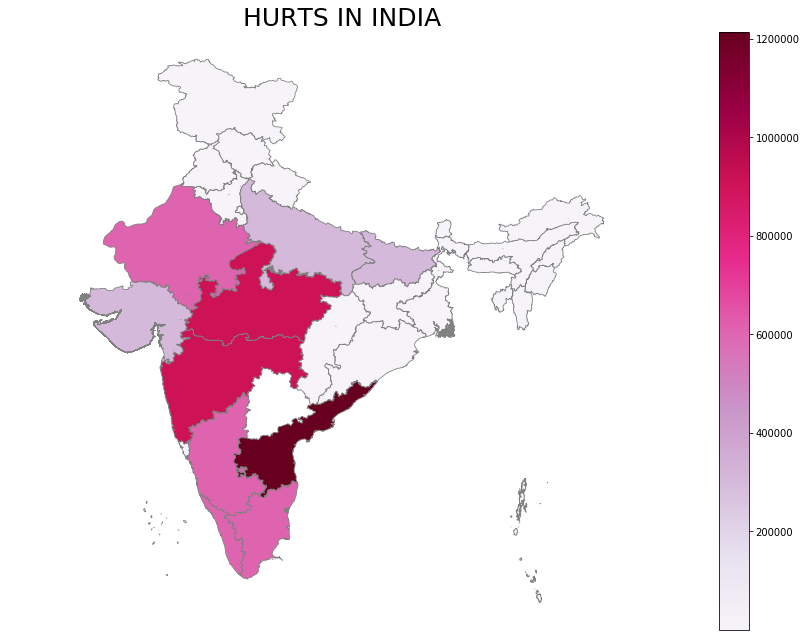

In [32]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('HURTS IN INDIA', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='HURT', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['HURT'].min(), vmax= merged_Ind["HURT"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

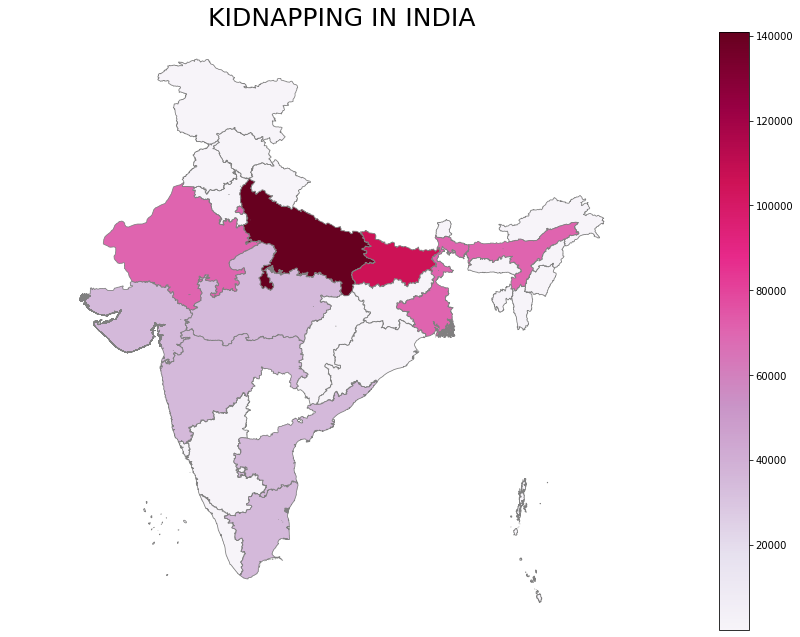

In [33]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('KIDNAPPING IN INDIA', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='KIDNAPPING', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['KIDNAPPING'].min(), vmax= merged_Ind["KIDNAPPING"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

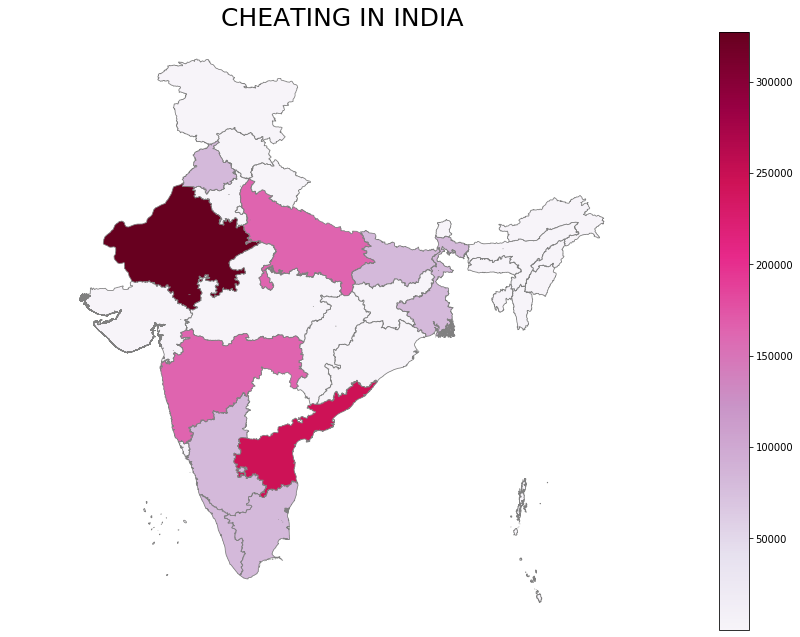

In [34]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('CHEATING IN INDIA', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='CHEATING', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['CHEATING'].min(), vmax= merged_Ind["CHEATING"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

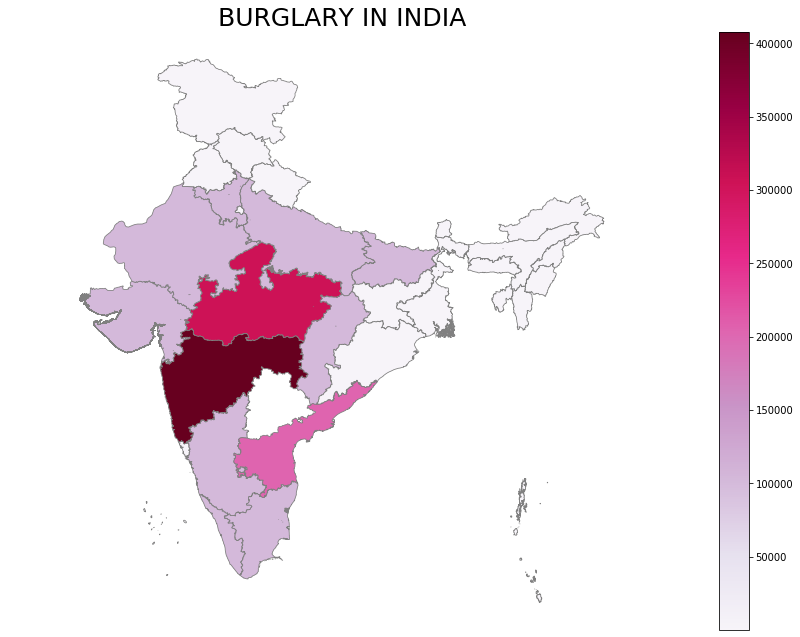

In [35]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('BURGLARY IN INDIA', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='BURGLARY', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['BURGLARY'].min(), vmax= merged_Ind["BURGLARY"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

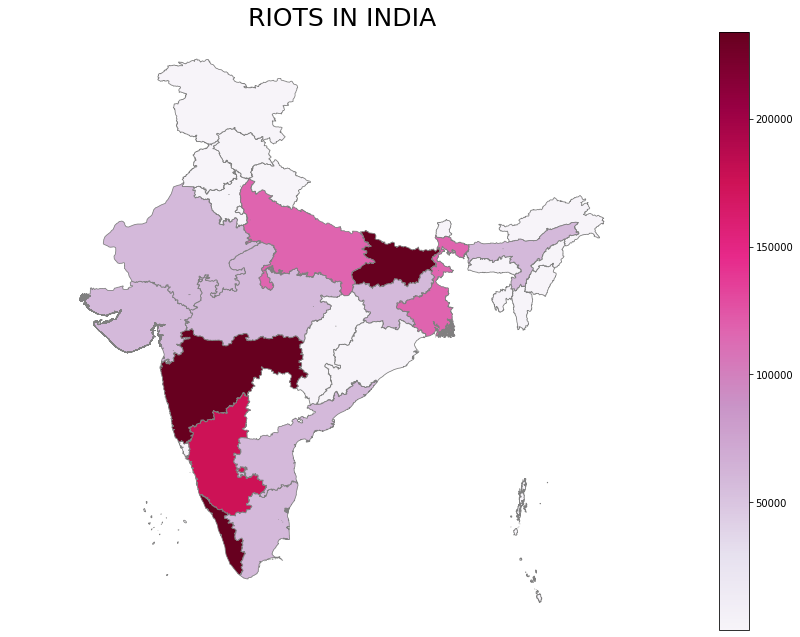

In [36]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('RIOTS IN INDIA', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='RIOTS', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['RIOTS'].min(), vmax= merged_Ind["RIOTS"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

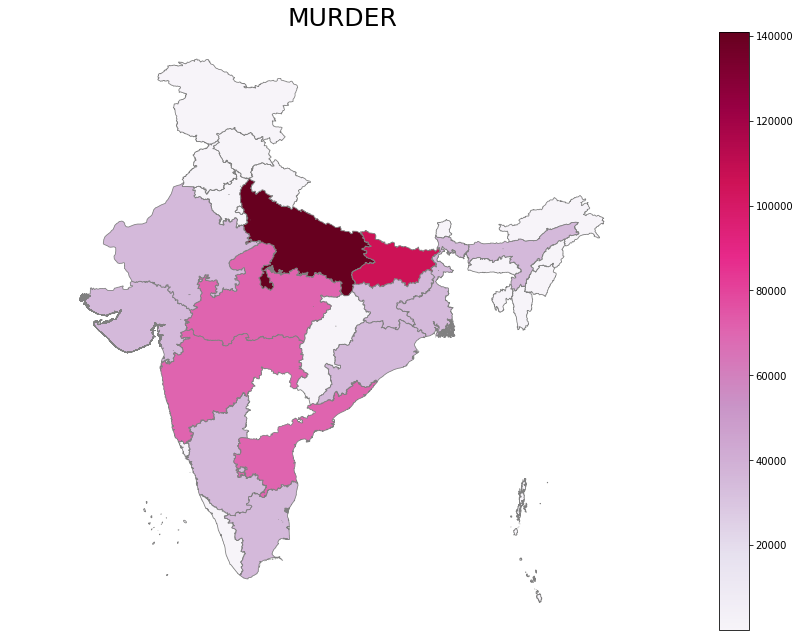

In [37]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('MURDER', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='MURDER', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['MURDER'].min(), vmax= merged_Ind["MURDER"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

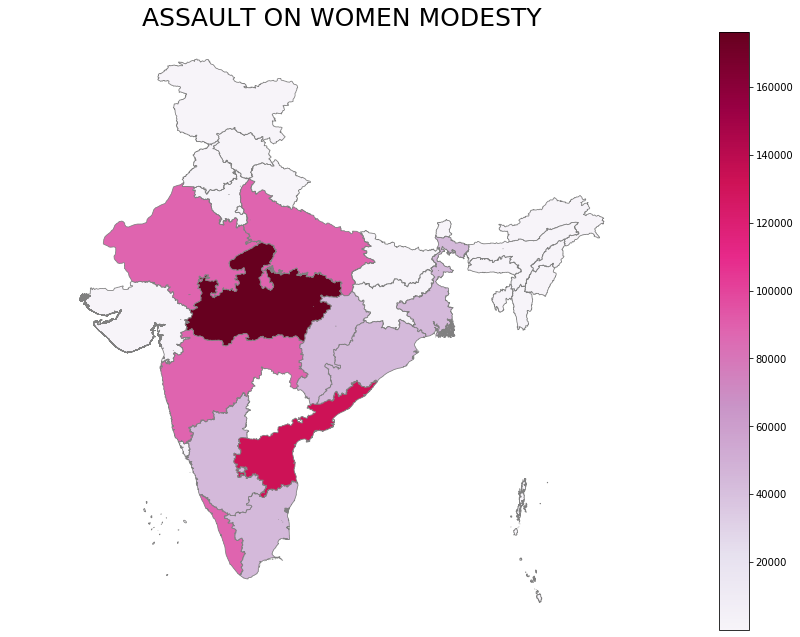

In [38]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('ASSAULT ON WOMEN MODESTY', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='ASSAULT_WOMEN_MODESTY', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['ASSAULT_WOMEN_MODESTY'].min(), vmax= merged_Ind["ASSAULT_WOMEN_MODESTY"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

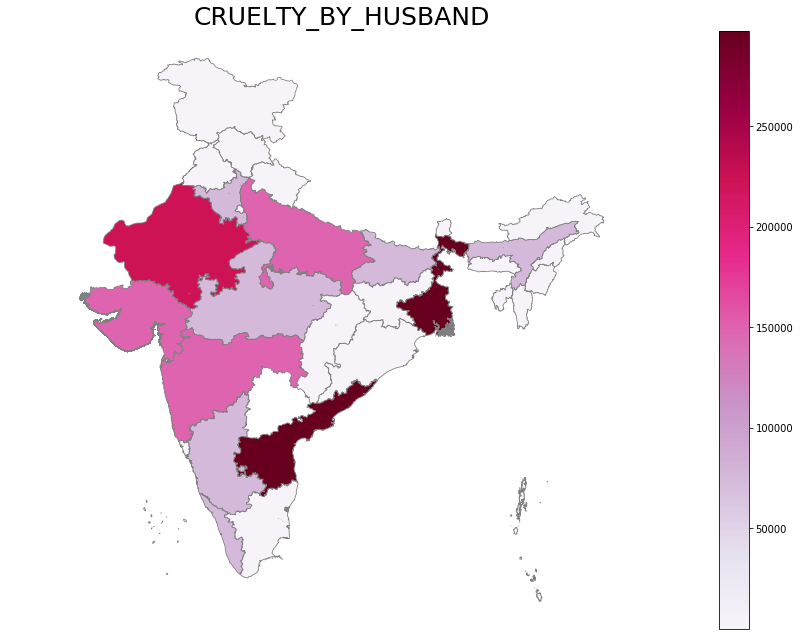

In [39]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('CRUELTY_BY_HUSBAND', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='CRUELTY_BY_HUSBAND', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['CRUELTY_BY_HUSBAND'].min(), vmax= merged_Ind["CRUELTY_BY_HUSBAND"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

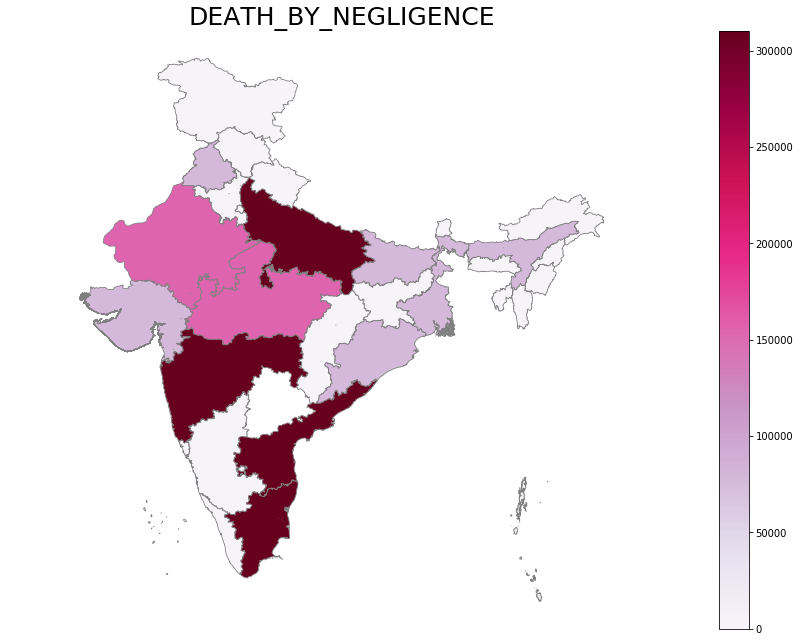

In [40]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('DEATH_BY_NEGLIGENCE', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='DEATH_BY_NEGLIGENCE', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['DEATH_BY_NEGLIGENCE'].min(), vmax= merged_Ind["DEATH_BY_NEGLIGENCE"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

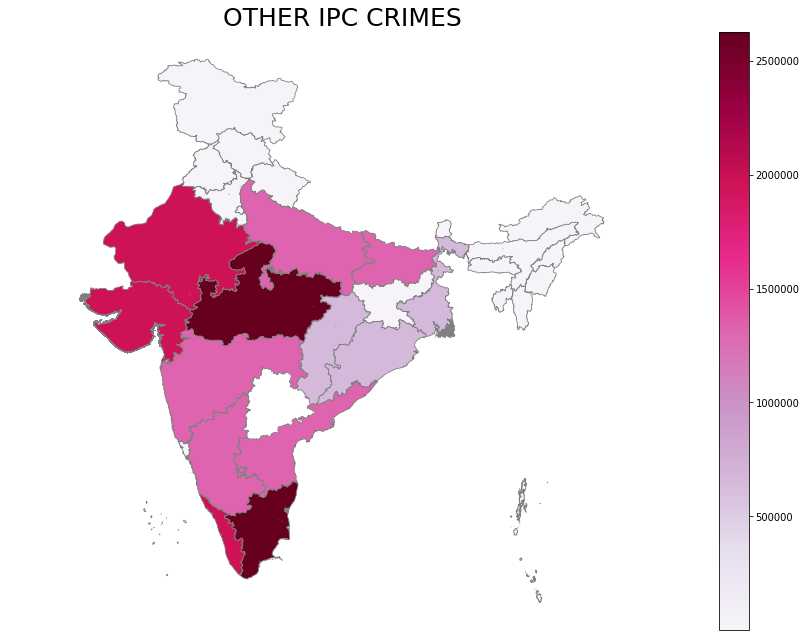

In [41]:
fig, ax = plt.subplots(1, figsize=(15, 11))
ax.axis('off')
ax.set_title('OTHER IPC CRIMES', fontdict={'fontsize': '25', 'fontweight' : '3'})

# plot the figure
merged_Ind.dropna().plot(column='OTHER IPC CRIMES', cmap='PuRd', figsize=fig, scheme='equal_interval',linewidth=0.8, ax=ax, edgecolor='grey')
norm = Normalize(vmin=merged_Ind['OTHER IPC CRIMES'].min(), vmax= merged_Ind["OTHER IPC CRIMES"].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='PuRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap)
ax.set_axis_off()
plt.axis('equal')
plt.show()

In [42]:
crimes_total = crimes_df.groupby(['STATE', "YEAR"]).agg({"TOTAL": sum }).reset_index()

In [43]:
crimes_total.head(5)

,STATE,YEAR,TOTAL
0,A & N ISLANDS,2001,1316
1,A & N ISLANDS,2002,1216
2,A & N ISLANDS,2003,1288
3,A & N ISLANDS,2004,1496
4,A & N ISLANDS,2005,1364


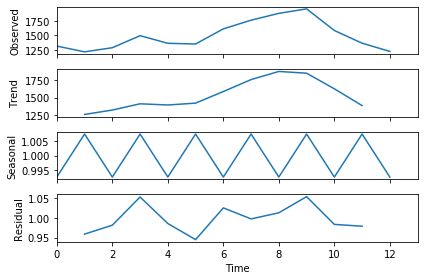

In [44]:
#Crimes Trend in Andaman 
crime_AN_df = crimes_total[crimes_total.STATE=="A & N ISLANDS" ]
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_AN_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

In [45]:
crime_AN_forecast = crime_AN_df.copy()
crime_AN_forecast.drop('STATE', axis = 1, inplace = True)

In [46]:
crime_AN_forecast

,YEAR,TOTAL
0,2001,1316
1,2002,1216
2,2003,1288
3,2004,1496
4,2005,1364
5,2006,1352
6,2007,1614
7,2008,1764
8,2009,1882
9,2010,1960


In [47]:
from statsmodels.tsa.stattools import adfuller

In [48]:
def adfull(ts):
    result = adfuller(ts, autolag=None)
    result_out = pd.Series(result[0:4], index=["Test Stats",
                                              'P-value',
                                              'lags_used',
                                              'Number of observation'])
    print(result_out)
    

In [49]:
adfull(crime_AN_forecast.TOTAL)

Test Stats              -1.230879
P-value                  0.660173
lags_used                4.000000
Number of observation    8.000000
dtype: float64


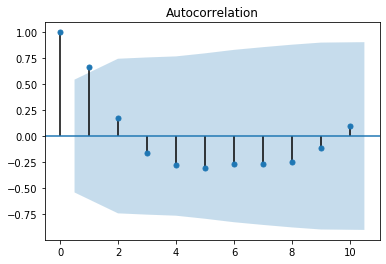

In [50]:
acf_plot = plot_acf(crime_AN_forecast.TOTAL, lags = 10)

C:\Users\Sharang\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1358: RuntimeWarning:

invalid value encountered in sqrt



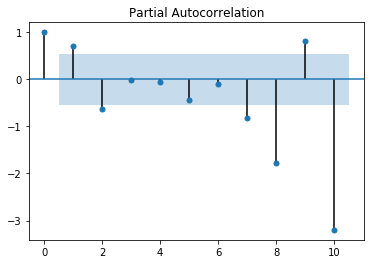

In [51]:
pcf_1 = plot_pacf(crime_AN_forecast.TOTAL, lags = 10)

In [52]:
an_arim = ARIMA(crime_AN_forecast.TOTAL[:10].astype(np.float64).as_matrix(), order=(1,0,0))
an_model = an_arim.fit()
an_model.summary2()


C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 135.6467
Dependent Variable: y                Log-Likelihood:      -64.369 
Date:               2020-08-03 09:35 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 140.704 
No. Iterations:     36.0000          HQIC:                133.743 
AIC:                134.7389                                      
-------------------------------------------------------------------
            Coef.    Std.Err.    t     P>|t|     [0.025     0.975] 
-------------------------------------------------------------------
const     1590.2084  228.5343  6.9583  0.0001  1142.2894  2038.1274
ar.L1.y      0.8718    0.1412  6.1738  0.0003     0.5950     1.1485
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.1471             0.0000           1.1471             0.0000
==================================================================

"""

In [53]:
def get_mape(actual, predicted):
    y_actual = np.array(actual)
    y_pred = np.array(predicted)
    return np.round(np.mean(np.abs((actual - predicted)/actual)) * 100, 2)

In [54]:
forecast_an = an_model.predict(10,12)
forecast_an

array([1912.57582424, 1871.23359412, 1835.19332638])

In [55]:
forecast_an_df, stderr, ci = an_model.forecast(steps=7)
forecast_an_df

array([1912.57582424, 1871.23359412, 1835.19332638, 1803.77506727,
       1776.38606413, 1752.50958232, 1731.69515613])

In [56]:
get_mape(crime_AN_forecast.TOTAL[10:13],forecast_an)

35.84

In [57]:
i=13
for j in range(len(forecast_an_df)):
    crime_AN_forecast.loc[i] = crime_AN_forecast.YEAR[i-1]+1
    crime_AN_forecast.TOTAL[i] = forecast_an_df[j]
    i = i+1

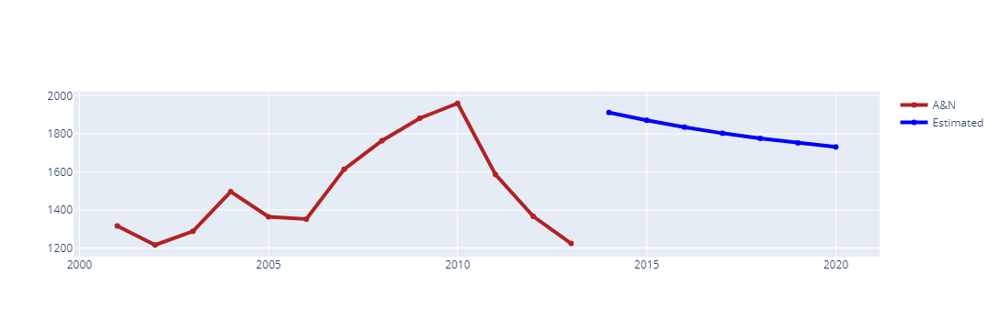

In [58]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= crime_AN_df["YEAR"], y= crime_AN_df['TOTAL'],
                    name = "A&N",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crime_AN_forecast["YEAR"][13:], y= crime_AN_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

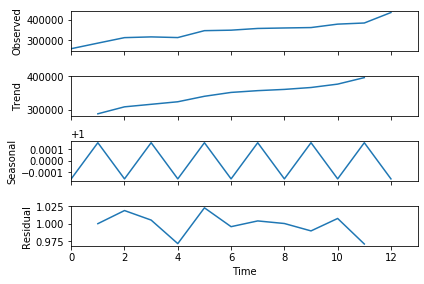

In [59]:
#trend in Andhra Pradesh
crime_AP_df = crimes_total[crimes_total.STATE=='ANDHRA PRADESH']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_AP_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

In [60]:
crimes_AP_forecast = crime_AP_df.copy()
crimes_AP_forecast.drop(['STATE'], axis = 1, inplace = True)

In [61]:
crimes_AP_forecast = crimes_AP_forecast.reset_index(drop = True)

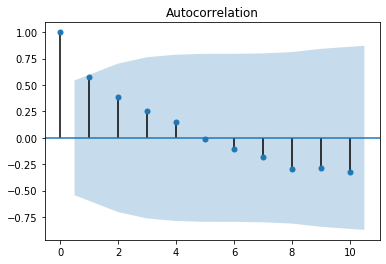

In [62]:
acf_plot = plot_acf(crimes_AP_forecast.TOTAL, lags = 10)

In [63]:
ap_arim = ARIMA(crimes_AP_forecast.TOTAL[:10].astype(np.float64).as_matrix(), order=(1,0,0))
ap_model = ap_arim.fit()
ap_model.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
====================================================================
Model:               ARMA             BIC:                 232.1280 
Dependent Variable:  y                Log-Likelihood:      -112.61  
Date:                2020-08-03 09:35 Scale:               1.0000   
No. Observations:    10               Method:              css-mle  
Df Model:            2                Sample:              0        
Df Residuals:        8                                     0        
Converged:           1.0000           S.D. of innovations: 17088.280
No. Iterations:      26.0000          HQIC:                230.224  
AIC:                 231.2203                                       
--------------------------------------------------------------------
           Coef.     Std.Err.    t    P>|t|     [0.025      0.975]  
--------------------------------------------------------------------
const   315525.0840 38688.1065 8.1556 0.0000 239697.7886 391352.3795
ar.L1.y      0.9237     0.1001 9.2236 0.0000      0.7274      1.1200
-----------------------------------------------------------------------------
                 Real           Imaginary          Modulus          Frequency
-----------------------------------------------------------------------------
AR.1            1.0826             0.0000           1.0826             0.0000
====================================================================

"""

In [64]:
forecast_ap = ap_model.predict(10,12)
forecast_ap

array([359262.09010032, 355924.00052004, 352840.68013981])

In [65]:
get_mape(crimes_AP_forecast.TOTAL[10:13],forecast_ap)

10.66

In [66]:
forecast_df, stderr, ci = ap_model.forecast(steps=7)
forecast_df

array([359262.09010032, 355924.00052004, 352840.68013981, 349992.68450084,
       347362.05318156, 344932.19653316, 342687.79105966])

In [67]:
i=13
for j in range(len(forecast_df)):
    crimes_AP_forecast.loc[i] = crimes_AP_forecast.YEAR[i-1]+1
    crimes_AP_forecast.TOTAL[i] = forecast_df[j]
    i = i+1

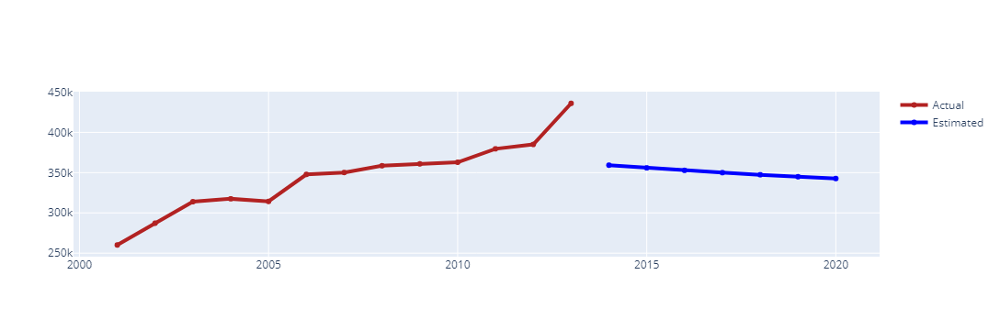

In [68]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= crime_AP_df["YEAR"], y= crime_AP_df['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_AP_forecast["YEAR"][13:], y= crimes_AP_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

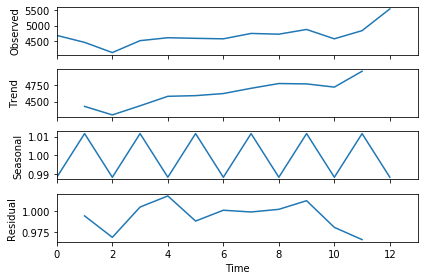

In [69]:

crime_ARU_df = crimes_total[crimes_total.STATE=='ARUNACHAL PRADESH']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_ARU_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

In [70]:
crimes_ARU_forecast = crime_ARU_df.copy()
crimes_ARU_forecast.drop(['STATE'], axis = 1, inplace = True)

In [71]:
crimes_ARU_forecast = crimes_ARU_forecast.reset_index(drop = True)

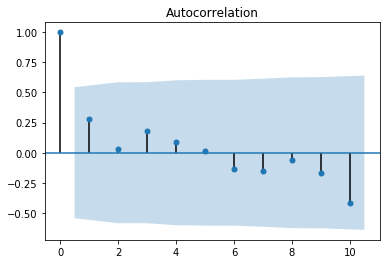

In [72]:
acf_plot = plot_acf(crimes_ARU_forecast.TOTAL, lags = 10)

In [73]:
crimes_ARU_forecast

,YEAR,TOTAL
0,2001,4684
1,2002,4456
2,2003,4122
3,2004,4512
4,2005,4608
5,2006,4588
6,2007,4572
7,2008,4748
8,2009,4724
9,2010,4878


In [74]:
aru_arim = ARIMA(crimes_ARU_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
aru_model = aru_arim.fit()
aru_model.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 138.8044
Dependent Variable: y                Log-Likelihood:      -65.948 
Date:               2020-08-03 09:35 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 174.940 
No. Iterations:     19.0000          HQIC:                136.901 
AIC:                137.8967                                      
-------------------------------------------------------------------
           Coef.    Std.Err.     t     P>|t|     [0.025     0.975] 
-------------------------------------------------------------------
const    4616.3881   97.7823  47.2109  0.0000  4424.7383  4808.0380
ar.L1.y     0.4524    0.3009   1.5036  0.1711    -0.1373     1.0421
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          2.2105             0.0000           2.2105             0.0000
==================================================================

"""

In [75]:
forecast_aru = aru_model.predict(10,12)
forecast_aru

array([4734.73702963, 4669.92722353, 4640.60833563])

In [76]:
get_mape(crimes_AP_forecast.TOTAL[10:13],forecast_aru)

98.83

In [77]:
forecast_df_aru, stderr, ci = aru_model.forecast(steps=7)
forecast_df_aru

array([4734.73702963, 4669.92722353, 4640.60833563, 4627.34495407,
       4621.34481889, 4618.63045665, 4617.40252392])

In [78]:
i=13
for j in range(len(forecast_df_aru)):
    crimes_ARU_forecast.loc[i] = crimes_ARU_forecast.YEAR[i-1]+1
    crimes_ARU_forecast.TOTAL[i] = forecast_df_aru[j]
    i = i+1

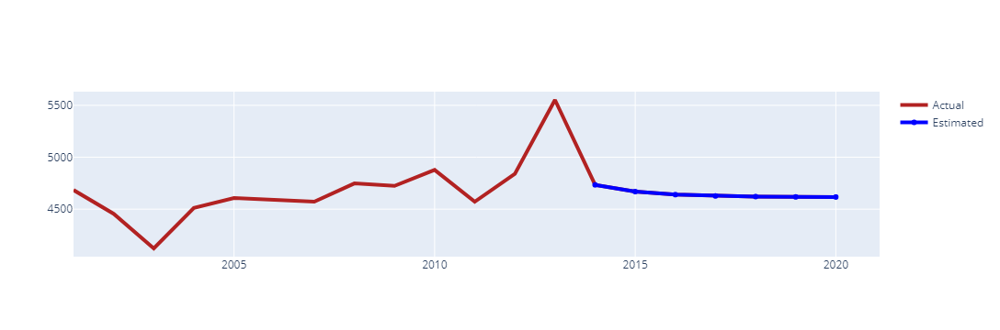

In [79]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_ARU_forecast["YEAR"], y= crimes_ARU_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_ARU_forecast["YEAR"][13:], y= crimes_ARU_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

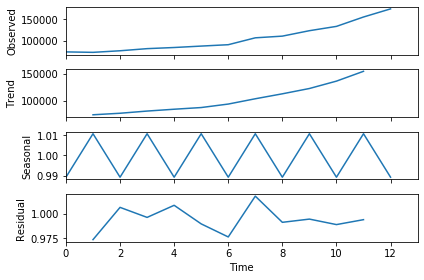

In [80]:
crime_Assam_df = crimes_total[crimes_total.STATE=='ASSAM']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_Assam_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

In [81]:
def plot(dataframe):
	acf_plot = plot_acf(dataframe.TOTAL, lags = 10)
	pcf_1 = plot_pacf(dataframe.TOTAL, lags = 10)
	return acf_plot, pcf_1

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

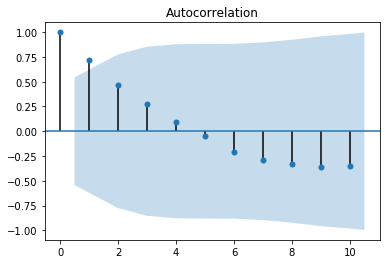

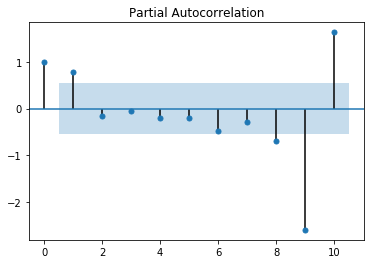

In [82]:
crimes_Assam_forecast = crime_Assam_df.copy()
crimes_Assam_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_Assam_forecast = crimes_Assam_forecast.reset_index(drop = True)
plot(crimes_Assam_forecast)

In [83]:
Assam_arim = ARIMA(crimes_Assam_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
Assam_moAssam = Assam_arim.fit()
Assam_moAssam.summary2()
forecast_Assam = Assam_moAssam.predict(10,12)
forecast_Assam

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



array([121796.04006772, 120344.23261386, 118975.53149451])

In [84]:
forecast_Assam = Assam_moAssam.predict(10,12)
forecast_Assam

array([121796.04006772, 120344.23261386, 118975.53149451])

In [85]:
forecast_df_Assam, stderr, ci = Assam_moAssam.forecast(steps=7)
forecast_df_Assam


array([121796.04006772, 120344.23261386, 118975.53149451, 117685.17942397,
       116468.69143955, 115321.83931289, 114240.63685363])

In [86]:
get_mape(crimes_Assam_forecast.TOTAL[10:13],forecast_Assam)


21.01

In [87]:
i=13
for j in range(len(forecast_df_Assam)):
    crimes_Assam_forecast.loc[i] = crimes_Assam_forecast.YEAR[i-1]+1
    crimes_Assam_forecast.TOTAL[i] = forecast_df_Assam[j]
    i = i+1

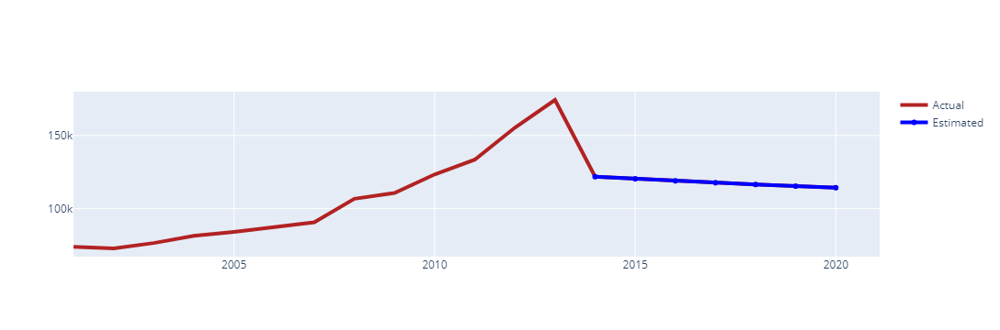

In [88]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_Assam_forecast["YEAR"], y= crimes_Assam_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_Assam_forecast["YEAR"][13:], y= crimes_Assam_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

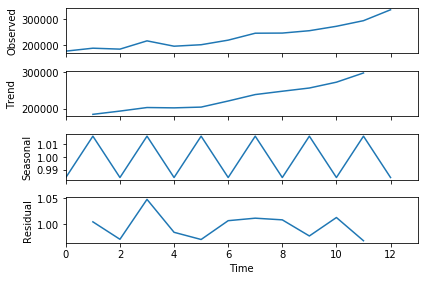

In [89]:
crime_BIH_df = crimes_total[crimes_total.STATE=='BIHAR']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_BIH_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

In [90]:
#crimes_BIH_forecast = crime_BIH_df.copy()
#crimes_BIH_forecast.drop(['STATE'], axis = 1, inplace = True)
#crimes_BIH_forecast = crimes_CHH_forecast.reset_index(drop = True)
#plot(crimes_BIH_forecast)

In [91]:
#crimes_CHH_forecast

In [92]:
#BIH_arim = ARIMA(crimes_BIH_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
#BIH_mo = BIH_arim.fit()
#BIH_mo.summary2()

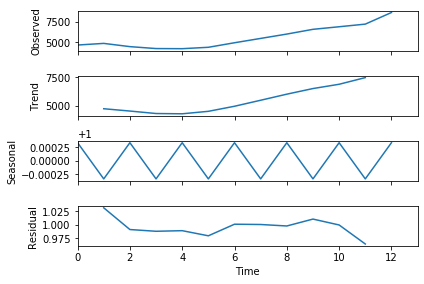

In [93]:
crime_GOA_df = crimes_total[crimes_total.STATE=='GOA']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_GOA_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

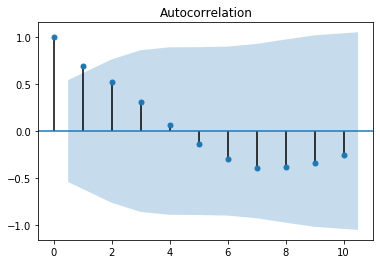

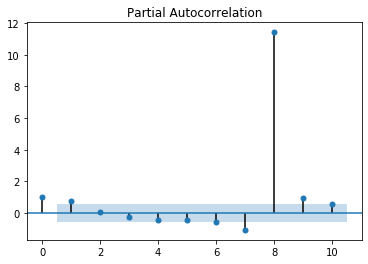

In [94]:
crimes_GOA_forecast = crime_GOA_df.copy()
crimes_GOA_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_GOA_forecast = crimes_GOA_forecast.reset_index(drop = True)
plot(crimes_GOA_forecast)

In [95]:
GOA_arim = ARIMA(crimes_GOA_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
GOA_moGOA = GOA_arim.fit()
GOA_moGOA.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 156.5449
Dependent Variable: y                Log-Likelihood:      -74.819 
Date:               2020-08-03 09:36 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 395.012 
No. Iterations:     24.0000          HQIC:                154.641 
AIC:                155.6371                                      
-------------------------------------------------------------------
            Coef.    Std.Err.    t     P>|t|     [0.025     0.975] 
-------------------------------------------------------------------
const     5410.9264  779.0608  6.9454  0.0001  3883.9953  6937.8575
ar.L1.y      0.9020    0.1136  7.9437  0.0000     0.6795     1.1246
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.1086             0.0000           1.1086             0.0000
==================================================================

"""

In [96]:
forecast_GOA = GOA_moGOA.predict(10,12)
forecast_GOA

array([6470.86283266, 6367.00714333, 6273.32753964])

In [97]:
forecast_df_GOA, stderr, ci = GOA_moGOA.forecast(steps=7)
forecast_df_GOA

array([6470.86283266, 6367.00714333, 6273.32753964, 6188.82693881,
       6112.60595517, 6043.8533275 , 5981.83728432])

In [98]:
get_mape(crimes_GOA_forecast.TOTAL[10:13],forecast_GOA)

15.07

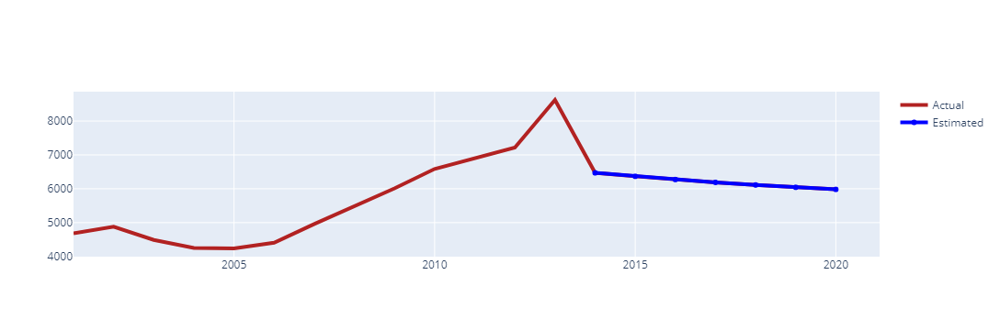

In [99]:
i=13
for j in range(len(forecast_df_GOA)):
    crimes_GOA_forecast.loc[i] = crimes_GOA_forecast.YEAR[i-1]+1
    crimes_GOA_forecast.TOTAL[i] = forecast_df_GOA[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_GOA_forecast["YEAR"], y= crimes_GOA_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_GOA_forecast["YEAR"][13:], y= crimes_GOA_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

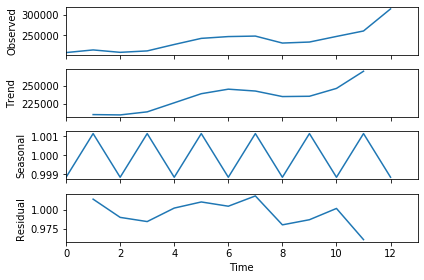

In [100]:
crime_GUJ_df = crimes_total[crimes_total.STATE=='GUJARAT']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_GUJ_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

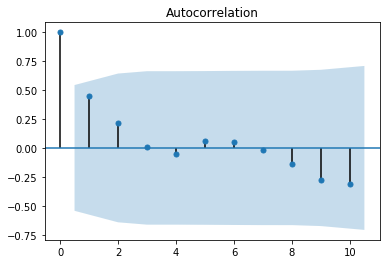

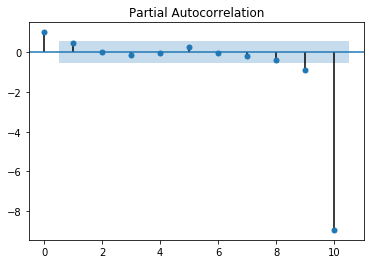

In [101]:
crimes_GUJ_forecast = crime_GUJ_df.copy()
crimes_GUJ_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_GUJ_forecast = crimes_GUJ_forecast.reset_index(drop = True)
plot(crimes_GUJ_forecast)

In [102]:
GUJ_arim = ARIMA(crimes_GUJ_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
GUJ_moGUJ = GUJ_arim.fit()
GUJ_moGUJ.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                            Results: ARMA
=====================================================================
Model:               ARMA              BIC:                  219.1216
Dependent Variable:  y                 Log-Likelihood:       -106.11 
Date:                2020-08-03 09:36  Scale:                1.0000  
No. Observations:    10                Method:               css-mle 
Df Model:            2                 Sample:               0       
Df Residuals:        8                                       0       
Converged:           1.0000            S.D. of innovations:  9364.184
No. Iterations:      29.0000           HQIC:                 217.218 
AIC:                 218.2138                                        
---------------------------------------------------------------------
           Coef.     Std.Err.     t    P>|t|     [0.025      0.975]  
---------------------------------------------------------------------
const   223721.7902 10465.8367 21.3764 0.0000 203209.1273 244234.4531
ar.L1.y      0.7811     0.1771  4.4104 0.0023      0.4340      1.1283
-------------------------------------------------------------------------------
                Real            Imaginary           Modulus           Frequency
-------------------------------------------------------------------------------
AR.1           1.2802              0.0000            1.2802              0.0000
=====================================================================

"""

In [103]:
forecast_GUJ = GUJ_moGUJ.predict(10,12)
forecast_GUJ

array([230874.1581028 , 229308.8581808 , 228086.12506538])

In [104]:
forecast_df_GUJ, stderr, ci = GUJ_moGUJ.forecast(steps=7)
forecast_df_GUJ


array([230874.1581028 , 229308.8581808 , 228086.12506538, 227130.98780986,
       226384.88290326, 225802.06349334, 225346.79445332])

In [105]:
get_mape(crimes_GUJ_forecast.TOTAL[10:13],forecast_GUJ)


15.29

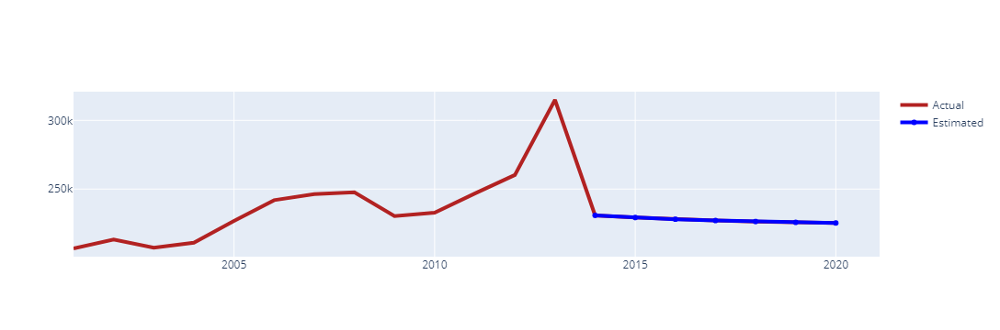

In [106]:
i=13
for j in range(len(forecast_df_GUJ)):
    crimes_GUJ_forecast.loc[i] = crimes_GUJ_forecast.YEAR[i-1]+1
    crimes_GUJ_forecast.TOTAL[i] = forecast_df_GUJ[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_GUJ_forecast["YEAR"], y= crimes_GUJ_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_GUJ_forecast["YEAR"][13:], y= crimes_GUJ_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

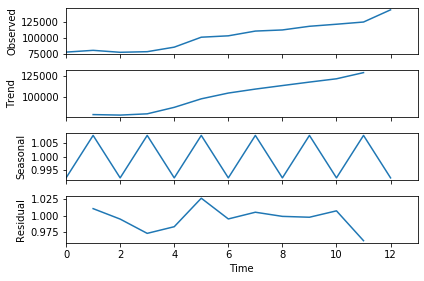

In [107]:
crime_HAR_df = crimes_total[crimes_total.STATE=='HARYANA']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_HAR_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

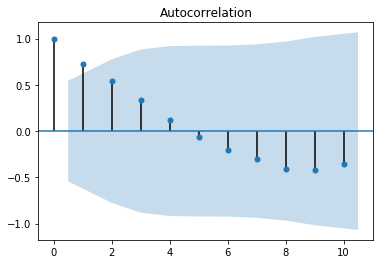

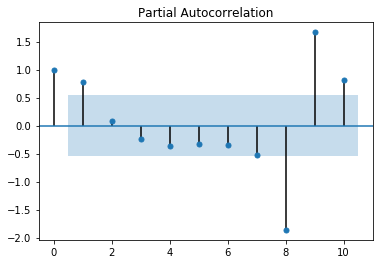

In [108]:
crimes_HAR_forecast = crime_HAR_df.copy()
crimes_HAR_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_HAR_forecast = crimes_HAR_forecast.reset_index(drop = True)
plot(crimes_HAR_forecast)

In [109]:
HAR_arim = ARIMA(crimes_HAR_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
HAR_moHAR = HAR_arim.fit()
HAR_moHAR.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
===================================================================
Model:               ARMA             BIC:                 213.5101
Dependent Variable:  y                Log-Likelihood:      -103.30 
Date:                2020-08-03 09:36 Scale:               1.0000  
No. Observations:    10               Method:              css-mle 
Df Model:            2                Sample:              0       
Df Residuals:        8                                     0       
Converged:           1.0000           S.D. of innovations: 6697.264
No. Iterations:      26.0000          HQIC:                211.607 
AIC:                 212.6024                                      
-------------------------------------------------------------------
          Coef.     Std.Err.     t    P>|t|    [0.025      0.975]  
-------------------------------------------------------------------
const   96900.6973 16172.8792  5.9916 0.0003 65202.4366 128598.9580
ar.L1.y     0.9323     0.0860 10.8437 0.0000     0.7638      1.1009
----------------------------------------------------------------------------
                Real           Imaginary          Modulus          Frequency
----------------------------------------------------------------------------
AR.1           1.0726             0.0000           1.0726             0.0000
===================================================================

"""

In [110]:
forecast_HAR = HAR_moHAR.predict(10,12)
print('prediction',forecast_HAR)

forecast_df_HAR, stderr, ci = HAR_moHAR.forecast(steps=7)
print('forecasting',forecast_df_HAR)

prediction [116796.14070541 115449.97577734 114194.89502235]
forecasting [116796.14070541 115449.97577734 114194.89502235 113024.73550571
 111933.751289   110916.58521533 109968.24260361]


In [111]:
get_mape(crimes_HAR_forecast.TOTAL[10:13],forecast_HAR)


10.76

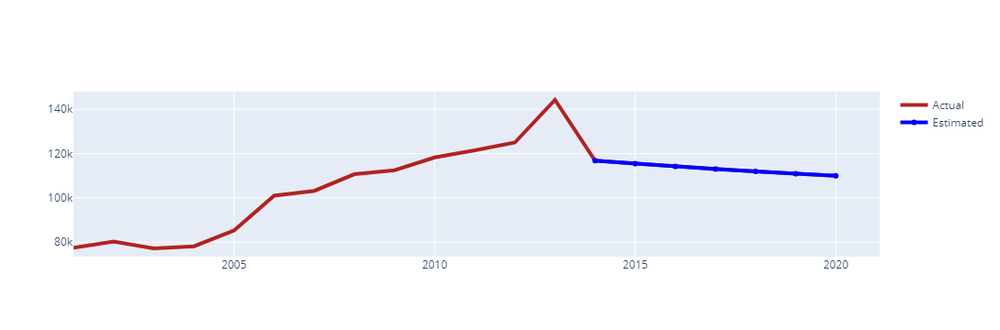

In [112]:
i=13
for j in range(len(forecast_df_HAR)):
    crimes_HAR_forecast.loc[i] = crimes_HAR_forecast.YEAR[i-1]+1
    crimes_HAR_forecast.TOTAL[i] = forecast_df_HAR[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_HAR_forecast["YEAR"], y= crimes_HAR_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_HAR_forecast["YEAR"][13:], y= crimes_HAR_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

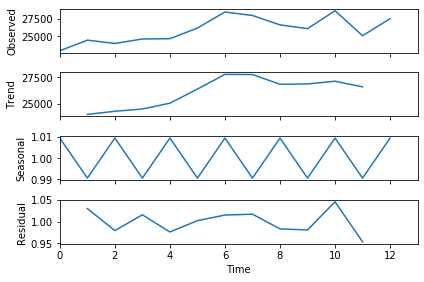

In [113]:
crime_HIM_df = crimes_total[crimes_total.STATE=='HIMACHAL PRADESH']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_HIM_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

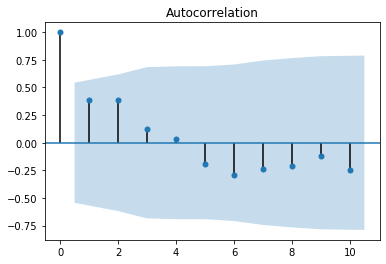

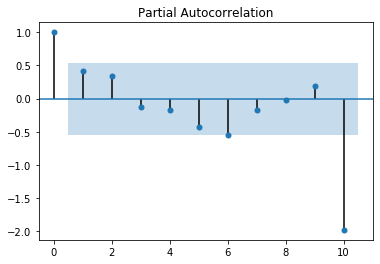

In [114]:
crimes_HIM_forecast = crime_HIM_df.copy()
crimes_HIM_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_HIM_forecast = crimes_HIM_forecast.reset_index(drop = True)
plot(crimes_HIM_forecast)

In [115]:
HIM_arim = ARIMA(crimes_HIM_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
HIM_moHIM = HIM_arim.fit()
HIM_moHIM.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 176.2649
Dependent Variable: y                Log-Likelihood:      -84.679 
Date:               2020-08-03 09:36 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 1102.571
No. Iterations:     24.0000          HQIC:                174.361 
AIC:                175.3571                                      
------------------------------------------------------------------
           Coef.     Std.Err.    t    P>|t|    [0.025     0.975]  
------------------------------------------------------------------
const    25198.1109 1177.5355 21.3990 0.0000 22890.1838 27506.0380
ar.L1.y      0.7624    0.1952  3.9063 0.0045     0.3799     1.1449
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.3117             0.0000           1.3117             0.0000
==================================================================

"""

In [116]:
forecast_HIM = HIM_moHIM.predict(10,12)
print('prediction',forecast_HIM)

forecast_df_HIM, stderr, ci = HIM_moHIM.forecast(steps=7)
print('forecasting',forecast_df_HIM)

prediction [25884.15708288 25721.13019705 25596.84380094]
forecasting [25884.15708288 25721.13019705 25596.84380094 25502.09189435
 25429.8561221  25374.78591845 25332.80218607]


In [117]:
get_mape(crimes_HIM_forecast.TOTAL[10:13],forecast_HIM)


6.3

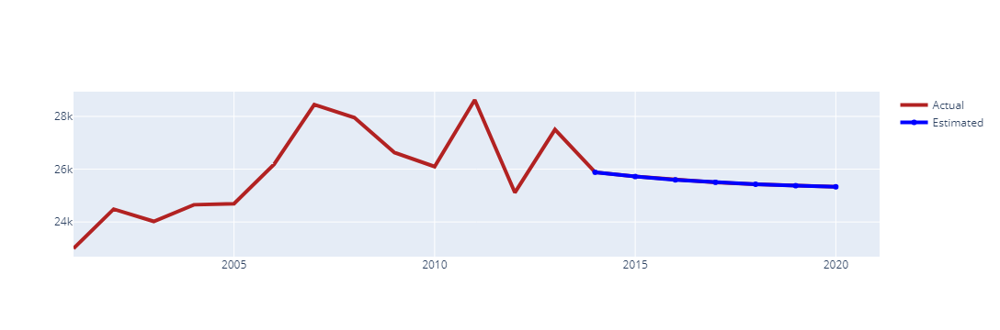

In [118]:
i=13
for j in range(len(forecast_df_HIM)):
    crimes_HIM_forecast.loc[i] = crimes_HIM_forecast.YEAR[i-1]+1
    crimes_HIM_forecast.TOTAL[i] = forecast_df_HIM[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_HIM_forecast["YEAR"], y= crimes_HIM_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_HIM_forecast["YEAR"][13:], y= crimes_HIM_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

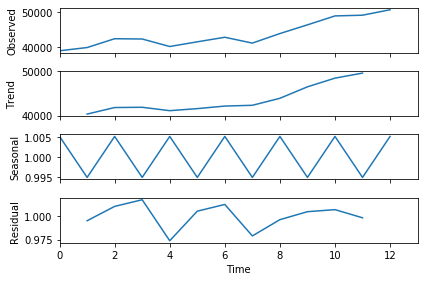

In [119]:
crime_JK_df = crimes_total[crimes_total.STATE=='JAMMU & KASHMIR']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_JK_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

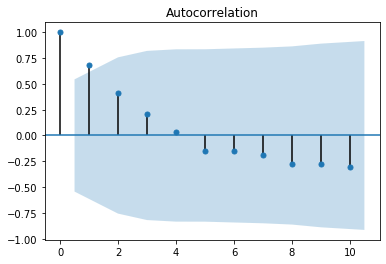

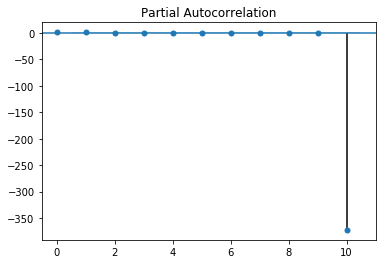

In [120]:
crimes_JK_forecast = crime_JK_df.copy()
crimes_JK_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_JK_forecast = crimes_JK_forecast.reset_index(drop = True)
plot(crimes_JK_forecast)

In [121]:
JK_arim = ARIMA(crimes_JK_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
JK_moJK = JK_arim.fit()
JK_moJK.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 185.7377
Dependent Variable: y                Log-Likelihood:      -89.415 
Date:               2020-08-03 09:36 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 1803.945
No. Iterations:     26.0000          HQIC:                183.834 
AIC:                184.8299                                      
------------------------------------------------------------------
           Coef.     Std.Err.    t    P>|t|    [0.025     0.975]  
------------------------------------------------------------------
const    42188.7579 1335.4332 31.5918 0.0000 39571.3570 44806.1588
ar.L1.y      0.6256    0.3617  1.7296 0.1220    -0.0833     1.3345
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.5985             0.0000           1.5985             0.0000
==================================================================

"""

In [122]:
forecast_JK = JK_moJK.predict(10,12)
print('prediction',forecast_JK)
forecast_df_JK, stderr, ci = JK_moJK.forecast(steps=7)
print('forecasting',forecast_df_JK)

prediction [44852.01606301 43854.8468583  43231.03478608]
forecasting [44852.01606301 43854.8468583  43231.03478608 42840.7885775
 42596.65719548 42443.93276056 42348.39095504]


In [123]:
get_mape(crimes_JK_forecast.TOTAL[10:13],forecast_JK)

	

11.41

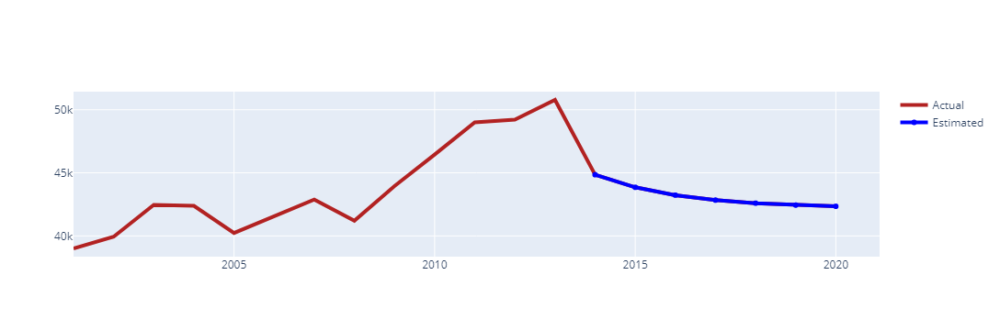

In [124]:
i=13
for j in range(len(forecast_df_JK)):
    crimes_JK_forecast.loc[i] = crimes_JK_forecast.YEAR[i-1]+1
    crimes_JK_forecast.TOTAL[i] = forecast_df_JK[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_JK_forecast["YEAR"], y= crimes_JK_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_JK_forecast["YEAR"][13:], y= crimes_JK_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

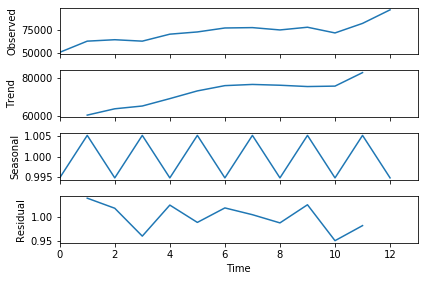

In [125]:
crime_JAR_df = crimes_total[crimes_total.STATE=='JHARKHAND']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_JAR_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

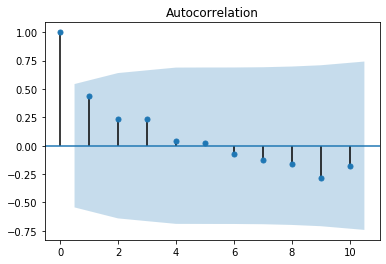

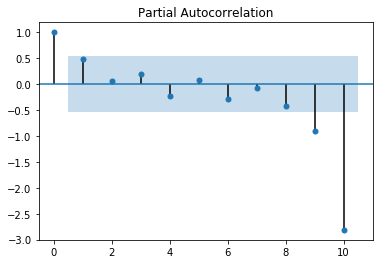

In [126]:
crimes_JAR_forecast = crime_JAR_df.copy()
crimes_JAR_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_JAR_forecast = crimes_JAR_forecast.reset_index(drop = True)
plot(crimes_JAR_forecast)

In [127]:
JAR_arim = ARIMA(crimes_JAR_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
JAR_moJAR = JAR_arim.fit()
JAR_moJAR.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 207.6448
Dependent Variable: y                Log-Likelihood:      -100.37 
Date:               2020-08-03 09:36 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 5120.029
No. Iterations:     36.0000          HQIC:                205.741 
AIC:                206.7370                                      
------------------------------------------------------------------
            Coef.     Std.Err.   t    P>|t|    [0.025     0.975]  
------------------------------------------------------------------
const     66213.3651 9045.7095 7.3199 0.0001 48484.1002 83942.6299
ar.L1.y       0.8863    0.1427 6.2128 0.0003     0.6067     1.1660
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.1282             0.0000           1.1282             0.0000
==================================================================

"""

In [128]:
forecast_JAR = JAR_moJAR.predict(10,12)
print('prediction',forecast_JAR)
forecast_df_JAR, stderr, ci = JAR_moJAR.forecast(steps=7)
print('forecasting',forecast_df_JAR)

prediction [76463.6516838  75298.6821854  74266.11424623]
forecasting [76463.6516838  75298.6821854  74266.11424623 73350.90011362
 72539.70224784 71820.69895232 71183.41209449]


In [129]:
get_mape(crimes_JAR_forecast.TOTAL[10:13],forecast_JAR)


12.57

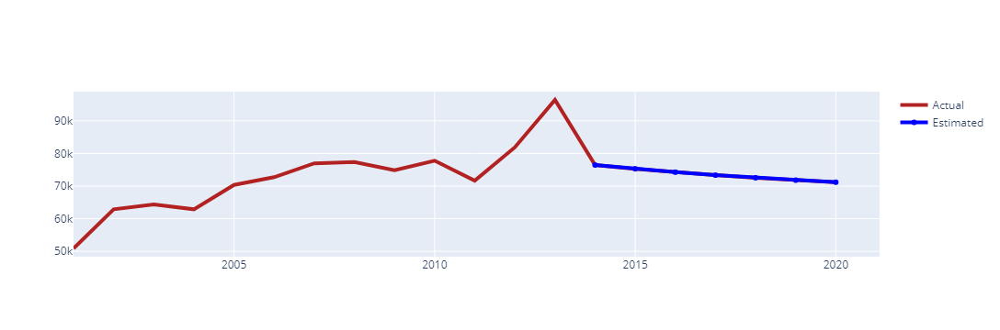

In [130]:
i=13
for j in range(len(forecast_df_JAR)):
    crimes_JAR_forecast.loc[i] = crimes_JAR_forecast.YEAR[i-1]+1
    crimes_JAR_forecast.TOTAL[i] = forecast_df_JAR[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_JAR_forecast["YEAR"], y= crimes_JAR_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_JAR_forecast["YEAR"][13:], y= crimes_JAR_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

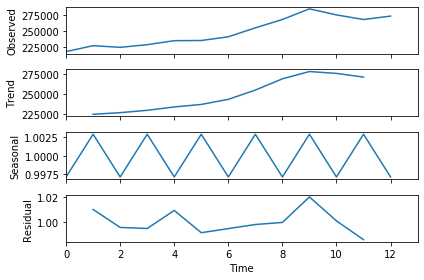

In [131]:
crime_KAR_df = crimes_total[crimes_total.STATE=='KARNATAKA']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_KAR_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

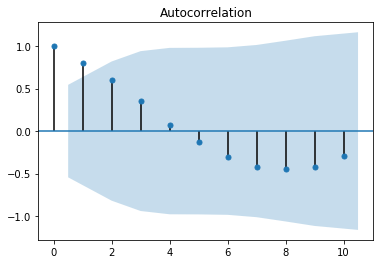

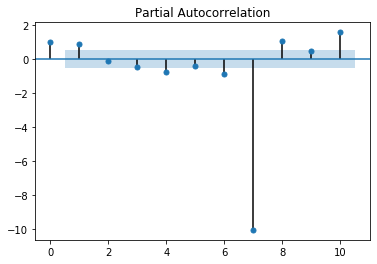

In [132]:
crimes_KAR_forecast = crime_KAR_df.copy()
crimes_KAR_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_KAR_forecast = crimes_KAR_forecast.reset_index(drop = True)
plot(crimes_KAR_forecast)

In [133]:
KAR_arim = ARIMA(crimes_KAR_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
KAR_moKAR = KAR_arim.fit()
KAR_moKAR.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                            Results: ARMA
=====================================================================
Model:               ARMA              BIC:                  220.6824
Dependent Variable:  y                 Log-Likelihood:       -106.89 
Date:                2020-08-03 09:36  Scale:                1.0000  
No. Observations:    10                Method:               css-mle 
Df Model:            2                 Sample:               0       
Df Residuals:        8                                       0       
Converged:           1.0000            S.D. of innovations:  9473.627
No. Iterations:      17.0000           HQIC:                 218.779 
AIC:                 219.7747                                        
---------------------------------------------------------------------
           Coef.     Std.Err.     t    P>|t|     [0.025      0.975]  
---------------------------------------------------------------------
const   249016.8958 26489.9782  9.4004 0.0000 197097.4926 300936.2991
ar.L1.y      0.9470     0.0734 12.9047 0.0000      0.8031      1.0908
-------------------------------------------------------------------------------
                Real            Imaginary           Modulus           Frequency
-------------------------------------------------------------------------------
AR.1           1.0560              0.0000            1.0560              0.0000
=====================================================================

"""

In [134]:
forecast_KAR = KAR_moKAR.predict(10,12)
print('prediction',forecast_KAR)
forecast_df_KAR, stderr, ci = KAR_moKAR.forecast(steps=7)
print('forecasting',forecast_df_KAR)

prediction [282754.54929906 280965.30387813 279270.94944236]
forecasting [282754.54929906 280965.30387813 279270.94944236 277666.45353564
 276147.05059351 274708.22778888 273345.71162828]


In [135]:
get_mape(crimes_KAR_forecast.TOTAL[10:13],forecast_KAR)


3.24

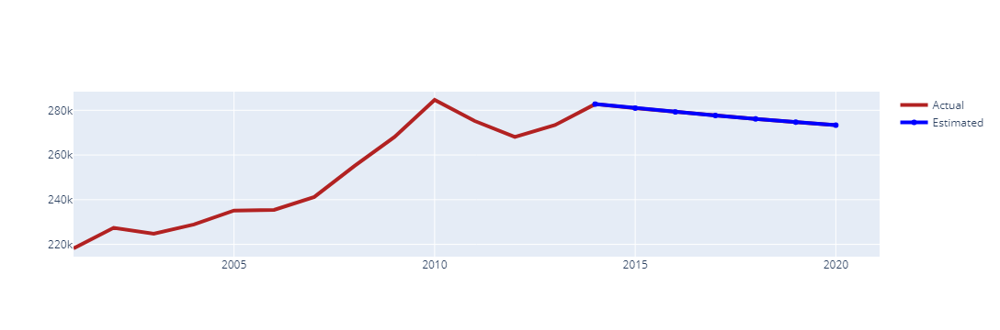

In [136]:
i=13
for j in range(len(forecast_df_KAR)):
    crimes_KAR_forecast.loc[i] = crimes_KAR_forecast.YEAR[i-1]+1
    crimes_KAR_forecast.TOTAL[i] = forecast_df_KAR[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_KAR_forecast["YEAR"], y= crimes_KAR_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_KAR_forecast["YEAR"][13:], y= crimes_KAR_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

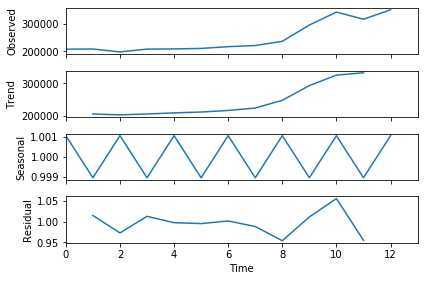

In [137]:
crime_KER_df = crimes_total[crimes_total.STATE=='KERALA']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_KER_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

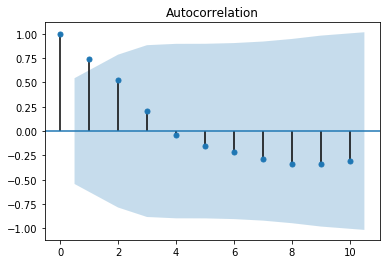

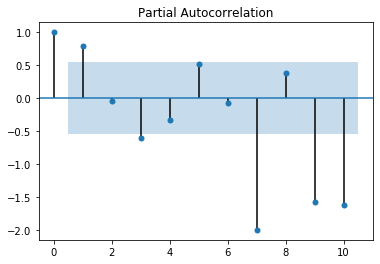

In [138]:
crimes_KER_forecast = crime_KER_df.copy()
crimes_KER_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_KER_forecast = crimes_KER_forecast.reset_index(drop = True)
plot(crimes_KER_forecast)

In [139]:
KER_arim = ARIMA(crimes_KER_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
KER_moKER = KER_arim.fit()
KER_moKER.summary2()


C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.

C:\Users\Sharang\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning:

divide by zero encountered in true_divide



<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
====================================================================
Model:               ARMA             BIC:                 235.2922 
Dependent Variable:  y                Log-Likelihood:      -114.19  
Date:                2020-08-03 09:37 Scale:               1.0000   
No. Observations:    10               Method:              css-mle  
Df Model:            2                Sample:              0        
Df Residuals:        8                                     0        
Converged:           1.0000           S.D. of innovations: 20843.266
No. Iterations:      28.0000          HQIC:                233.389  
AIC:                 234.3844                                       
--------------------------------------------------------------------
           Coef.     Std.Err.    t    P>|t|     [0.025      0.975]  
--------------------------------------------------------------------
const   235675.0005 28461.2740 8.2805 0.0000 179891.9285 291458.0726
ar.L1.y      0.8188     0.2144 3.8199 0.0051      0.3987      1.2389
-----------------------------------------------------------------------------
                 Real           Imaginary          Modulus          Frequency
-----------------------------------------------------------------------------
AR.1            1.2213             0.0000           1.2213             0.0000
====================================================================

"""

In [140]:
forecast_KER = KER_moKER.predict(10,12)
print('prediction',forecast_KER)
forecast_df_KER, stderr, ci = KER_moKER.forecast(steps=7)
print('forecasting',forecast_df_KER)

prediction [285581.41115716 276538.15032864 269133.56808695]
forecasting [285581.41115716 276538.15032864 269133.56808695 263070.72867386
 258106.5023949  254041.81572424 250713.66813342]


In [141]:
get_mape(crimes_KER_forecast.TOTAL[10:13],forecast_KER)


17.92

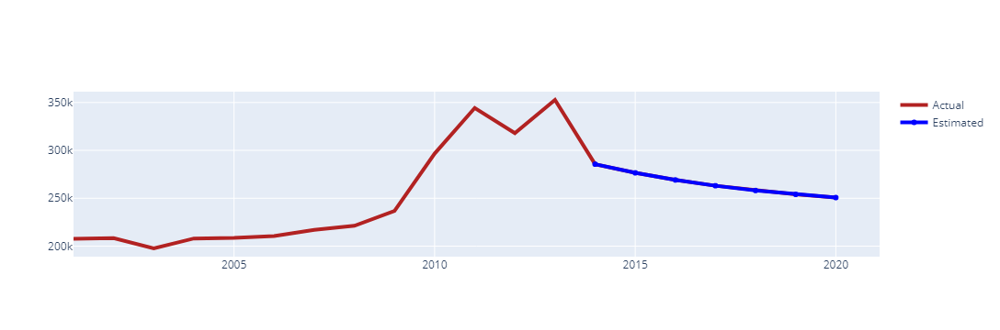

In [142]:
i=13
for j in range(len(forecast_df_KER)):
    crimes_KER_forecast.loc[i] = crimes_KER_forecast.YEAR[i-1]+1
    crimes_KER_forecast.TOTAL[i] = forecast_df_KER[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_KER_forecast["YEAR"], y= crimes_KER_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_KER_forecast["YEAR"][13:], y= crimes_KER_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

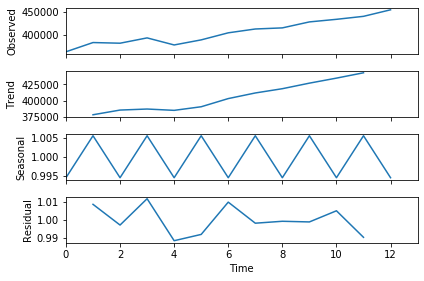

In [143]:
crime_MP_df = crimes_total[crimes_total.STATE=='MADHYA PRADESH']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_MP_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

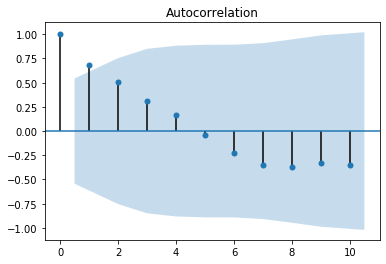

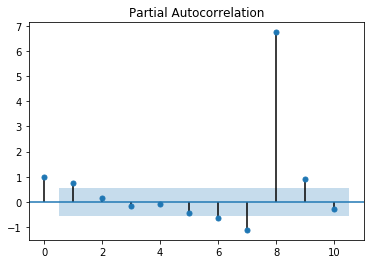

In [144]:
crimes_MP_forecast = crime_MP_df.copy()
crimes_MP_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_MP_forecast = crimes_MP_forecast.reset_index(drop = True)
plot(crimes_MP_forecast)

In [145]:
MP_arim = ARIMA(crimes_MP_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
MP_moMP = MP_arim.fit()
MP_moMP.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                            Results: ARMA
=====================================================================
Model:                ARMA             BIC:                 224.9679 
Dependent Variable:   y                Log-Likelihood:      -109.03  
Date:                 2020-08-03 09:37 Scale:               1.0000   
No. Observations:     10               Method:              css-mle  
Df Model:             2                Sample:              0        
Df Residuals:         8                                     0        
Converged:            1.0000           S.D. of innovations: 12233.543
No. Iterations:       29.0000          HQIC:                223.064  
AIC:                  224.0602                                       
---------------------------------------------------------------------
           Coef.     Std.Err.     t    P>|t|     [0.025      0.975]  
---------------------------------------------------------------------
const   395513.4216 19860.8897 19.9142 0.0000 356586.7931 434440.0502
ar.L1.y      0.8739     0.1610  5.4275 0.0006      0.5583      1.1895
-------------------------------------------------------------------------------
                Real            Imaginary           Modulus           Frequency
-------------------------------------------------------------------------------
AR.1           1.1443              0.0000            1.1443              0.0000
=====================================================================

"""

In [146]:
forecast_MP = MP_moMP.predict(10,12)
print('prediction',forecast_MP)
forecast_df_MP, stderr, ci = MP_moMP.forecast(steps=7)
print('forecasting',forecast_df_MP)


prediction [424373.54805421 420734.24013339 417553.85473935]
forecasting [424373.54805421 420734.24013339 417553.85473935 414774.52101033
 412345.66569244 410223.09289966 408368.17991764]


In [147]:
get_mape(crimes_MP_forecast.TOTAL[10:13],forecast_MP)

	

5.0

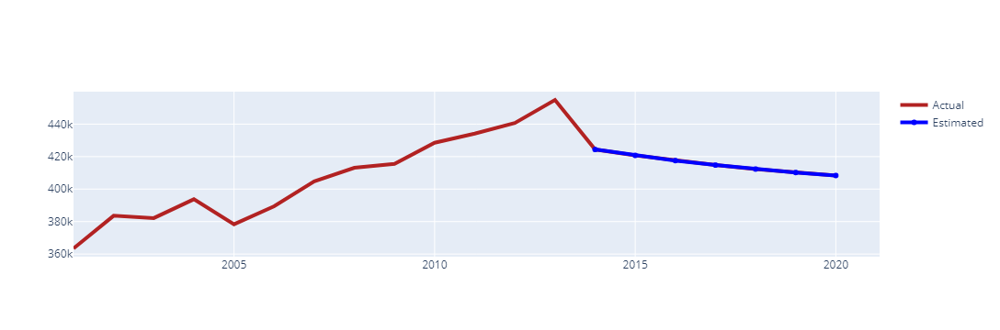

In [148]:
i=13
for j in range(len(forecast_df_MP)):
    crimes_MP_forecast.loc[i] = crimes_MP_forecast.YEAR[i-1]+1
    crimes_MP_forecast.TOTAL[i] = forecast_df_MP[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_MP_forecast["YEAR"], y= crimes_MP_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_MP_forecast["YEAR"][13:], y= crimes_MP_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

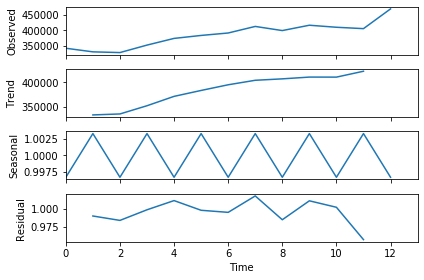

In [149]:
crime_MAH_df = crimes_total[crimes_total.STATE=='MAHARASHTRA']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_MAH_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

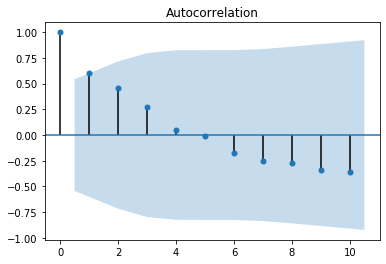

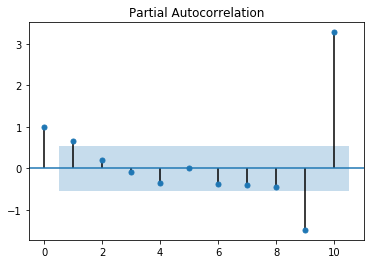

In [150]:
crimes_MAH_forecast = crime_MAH_df.copy()
crimes_MAH_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_MAH_forecast = crimes_MAH_forecast.reset_index(drop = True)
plot(crimes_MAH_forecast)

In [151]:
MAH_arim = ARIMA(crimes_MAH_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
MAH_moMAH = MAH_arim.fit()
MAH_moMAH.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                            Results: ARMA
=====================================================================
Model:                ARMA             BIC:                 229.7404 
Dependent Variable:   y                Log-Likelihood:      -111.42  
Date:                 2020-08-03 09:37 Scale:               1.0000   
No. Observations:     10               Method:              css-mle  
Df Model:             2                Sample:              0        
Df Residuals:         8                                     0        
Converged:            1.0000           S.D. of innovations: 15428.432
No. Iterations:       30.0000          HQIC:                227.837  
AIC:                  228.8327                                       
---------------------------------------------------------------------
           Coef.     Std.Err.     t    P>|t|     [0.025      0.975]  
---------------------------------------------------------------------
const   376837.6002 27530.3651 13.6881 0.0000 322879.0762 430796.1242
ar.L1.y      0.8905     0.1217  7.3175 0.0001      0.6519      1.1290
-------------------------------------------------------------------------------
                Real            Imaginary           Modulus           Frequency
-------------------------------------------------------------------------------
AR.1           1.1230              0.0000            1.1230              0.0000
=====================================================================

"""

In [152]:
forecast_MAH = MAH_moMAH.predict(10,12)
print('prediction',forecast_MAH)
forecast_df_MAH, stderr, ci = MAH_moMAH.forecast(steps=7)
print('forecasting',forecast_df_MAH)

prediction [412008.99443774 408156.00749983 404725.11097564]
forecasting [412008.99443774 408156.00749983 404725.11097564 401670.06533199
 398949.69652489 396527.34108087 394370.35196901]


In [153]:
get_mape(crimes_MAH_forecast.TOTAL[10:13],forecast_MAH)

	

4.96

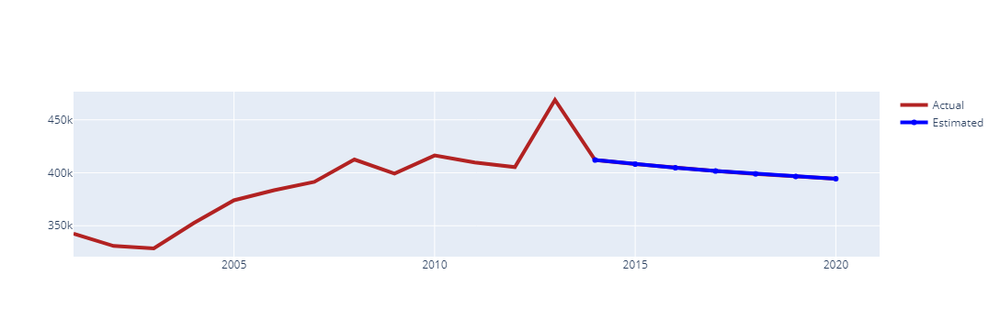

In [154]:
i=13
for j in range(len(forecast_df_MAH)):
    crimes_MAH_forecast.loc[i] = crimes_MAH_forecast.YEAR[i-1]+1
    crimes_MAH_forecast.TOTAL[i] = forecast_df_MAH[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_MAH_forecast["YEAR"], y= crimes_MAH_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_MAH_forecast["YEAR"][13:], y= crimes_MAH_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

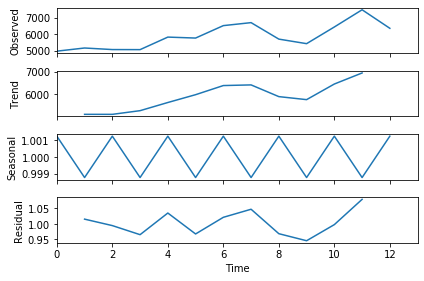

In [155]:
crime_MAN_df = crimes_total[crimes_total.STATE=='MANIPUR']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_MAN_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

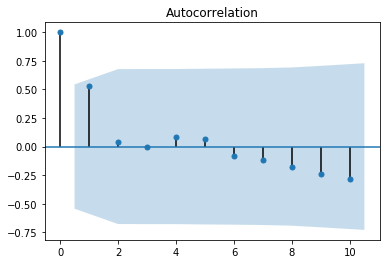

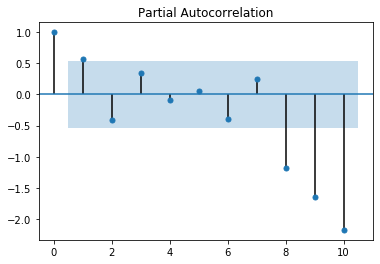

In [156]:
crimes_MAN_forecast = crime_MAN_df.copy()
crimes_MAN_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_MAN_forecast = crimes_MAN_forecast.reset_index(drop = True)
plot(crimes_MAN_forecast)

In [157]:
MAN_arim = ARIMA(crimes_MAN_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
MAN_moMAN = MAN_arim.fit()
MAN_moMAN.summary2()


C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 157.7031
Dependent Variable: y                Log-Likelihood:      -75.398 
Date:               2020-08-03 09:37 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 444.454 
No. Iterations:     21.0000          HQIC:                155.800 
AIC:                156.7954                                      
-------------------------------------------------------------------
           Coef.    Std.Err.     t     P>|t|     [0.025     0.975] 
-------------------------------------------------------------------
const    5521.1249  328.4962  16.8073  0.0000  4877.2842  6164.9657
ar.L1.y     0.6173    0.2356   2.6202  0.0306     0.1555     1.0790
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.6200             0.0000           1.6200             0.0000
==================================================================

"""

In [158]:
forecast_MAN = MAN_moMAN.predict(10,12)
print('prediction',forecast_MAN)
forecast_df_MAN, stderr, ci = MAN_moMAN.forecast(steps=7)
print('forecasting',forecast_df_MAN)

prediction [5464.87654431 5486.40467431 5499.69327244]
forecasting [5464.87654431 5486.40467431 5499.69327244 5507.89588178 5512.95907952
 5516.08442297 5518.01359345]


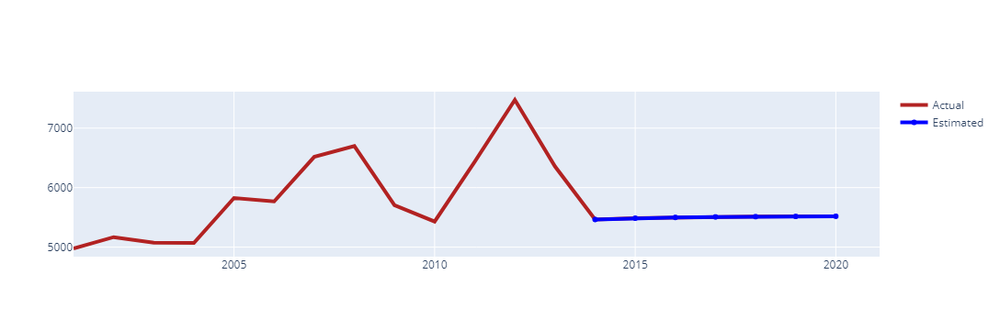

In [159]:
i=13
for j in range(len(forecast_df_MAN)):
    crimes_MAN_forecast.loc[i] = crimes_MAN_forecast.YEAR[i-1]+1
    crimes_MAN_forecast.TOTAL[i] = forecast_df_MAN[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_MAN_forecast["YEAR"], y= crimes_MAN_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_MAN_forecast["YEAR"][13:], y= crimes_MAN_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

In [160]:
get_mape(crimes_MAN_forecast.TOTAL[10:13],forecast_MAN)


18.38

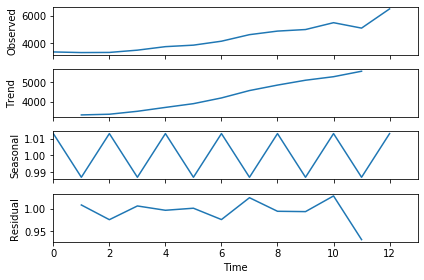

In [161]:
crime_MEG_df = crimes_total[crimes_total.STATE=='MEGHALAYA']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_MEG_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

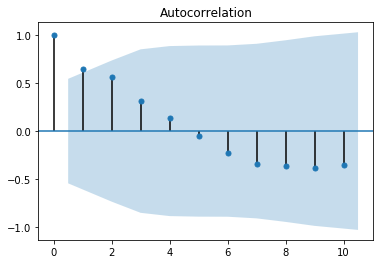

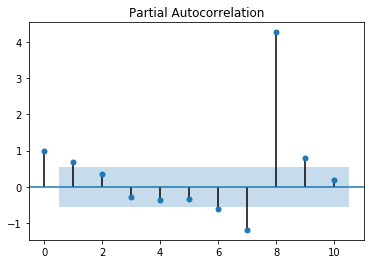

In [162]:
crimes_MEG_forecast = crime_MEG_df.copy()
crimes_MEG_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_MEG_forecast = crimes_MEG_forecast.reset_index(drop = True)
plot(crimes_MEG_forecast)


In [163]:
MEG_arim = ARIMA(crimes_MEG_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
MEG_moMEG = MEG_arim.fit()
MEG_moMEG.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 146.7369
Dependent Variable: y                Log-Likelihood:      -69.915 
Date:               2020-08-03 09:37 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 233.732 
No. Iterations:     25.0000          HQIC:                144.833 
AIC:                145.8291                                      
-------------------------------------------------------------------
           Coef.    Std.Err.     t     P>|t|     [0.025     0.975] 
-------------------------------------------------------------------
const    4150.8123  692.1262   5.9972  0.0003  2794.2700  5507.3547
ar.L1.y     0.9520    0.0638  14.9287  0.0000     0.8270     1.0769
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.0505             0.0000           1.0505             0.0000
==================================================================

"""

In [164]:
forecast_MEG = MEG_moMEG.predict(10,12)
print('prediction',forecast_MEG)
forecast_df_MEG, stderr, ci = MEG_moMEG.forecast(steps=7)
print('forecasting',forecast_df_MEG)

prediction [4968.72331631 4929.4296273  4892.02366687]
forecasting [4968.72331631 4929.4296273  4892.02366687 4856.41474568 4822.51653123
 4790.24683857 4759.52743102]


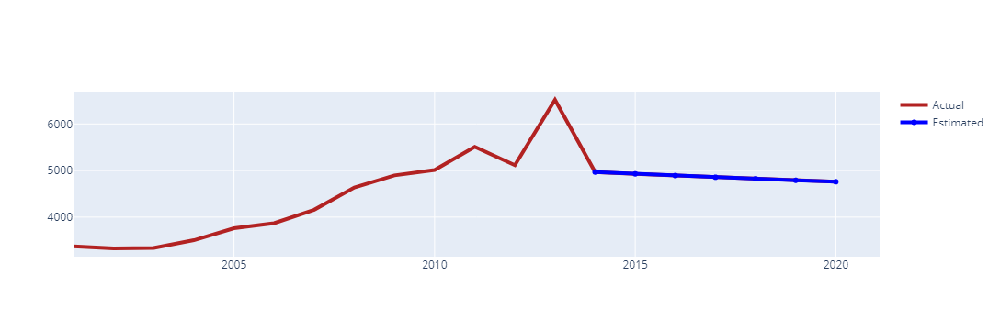

In [165]:
i=13
for j in range(len(forecast_df_MEG)):
    crimes_MEG_forecast.loc[i] = crimes_MEG_forecast.YEAR[i-1]+1
    crimes_MEG_forecast.TOTAL[i] = forecast_df_MEG[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_MEG_forecast["YEAR"], y= crimes_MEG_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_MEG_forecast["YEAR"][13:], y= crimes_MEG_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

In [166]:
get_mape(crimes_MEG_forecast.TOTAL[10:13],forecast_MEG)


12.79

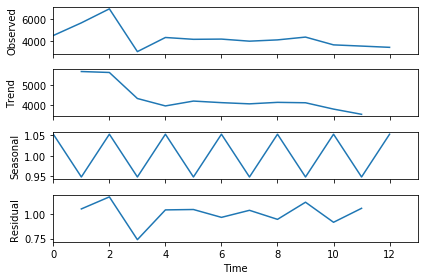

In [167]:
crime_MIZ_df = crimes_total[crimes_total.STATE=='MIZORAM']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_MIZ_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

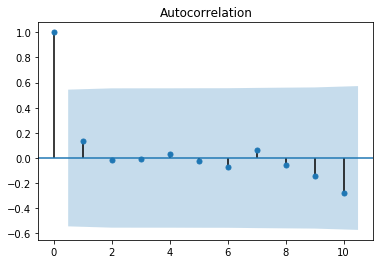

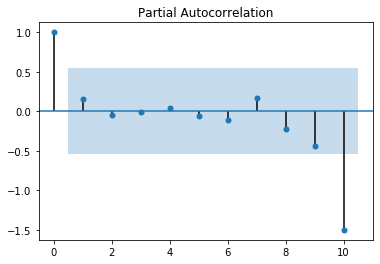

In [168]:
crimes_MIZ_forecast = crime_MIZ_df.copy()
crimes_MIZ_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_MIZ_forecast = crimes_MIZ_forecast.reset_index(drop = True)
plot(crimes_MIZ_forecast)


In [169]:
MIZ_arim = ARIMA(crimes_MIZ_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
MIZ_moMIZ = MIZ_arim.fit()
MIZ_moMIZ.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 173.4503
Dependent Variable: y                Log-Likelihood:      -83.271 
Date:               2020-08-03 09:37 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 1000.427
No. Iterations:     17.0000          HQIC:                171.547 
AIC:                172.5425                                      
-------------------------------------------------------------------
           Coef.    Std.Err.     t     P>|t|     [0.025     0.975] 
-------------------------------------------------------------------
const    4511.6204  319.0442  14.1410  0.0000  3886.3052  5136.9356
ar.L1.y     0.0092    0.3019   0.0304  0.9765    -0.5826     0.6009
--------------------------------------------------------------------------
               Real           Imaginary         Modulus          Frequency
--------------------------------------------------------------------------
AR.1         109.0994            0.0000         109.0994            0.0000
==================================================================

"""

In [170]:
forecast_MIZ = MIZ_moMIZ.predict(10,12)
print('prediction',forecast_MIZ)
forecast_df_MIZ, stderr, ci = MIZ_moMIZ.forecast(steps=7)
print('forecasting',forecast_df_MIZ)

prediction [4510.12063804 4511.60662815 4511.62024867]
forecasting [4510.12063804 4511.60662815 4511.62024867 4511.62037351 4511.62037466
 4511.62037467 4511.62037467]


In [171]:
get_mape(crimes_MIZ_forecast.TOTAL[10:13],forecast_MIZ)


27.86

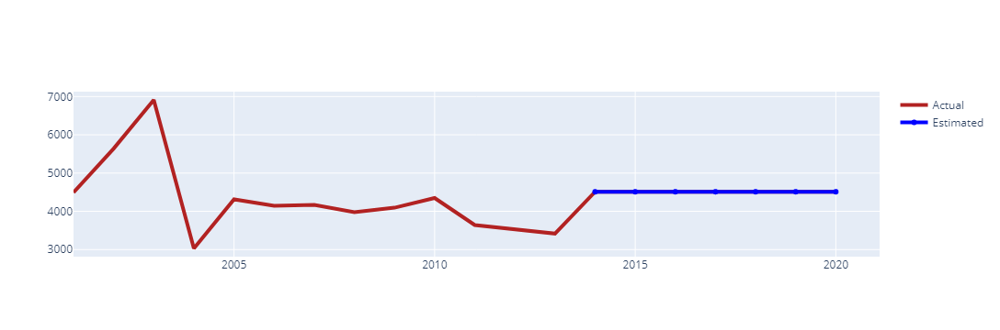

In [172]:
i=13
for j in range(len(forecast_df_MIZ)):
    crimes_MIZ_forecast.loc[i] = crimes_MIZ_forecast.YEAR[i-1]+1
    crimes_MIZ_forecast.TOTAL[i] = forecast_df_MIZ[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_MIZ_forecast["YEAR"], y= crimes_MIZ_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_MIZ_forecast["YEAR"][13:], y= crimes_MIZ_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

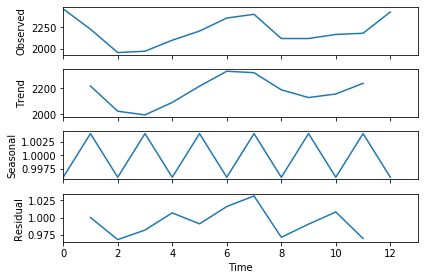

In [173]:
crime_NAG_df = crimes_total[crimes_total.STATE=='NAGALAND']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_NAG_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

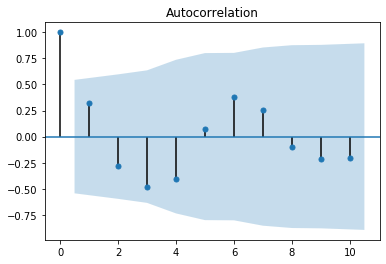

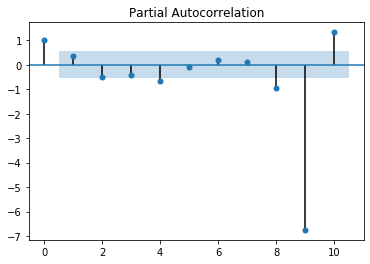

In [174]:
crimes_NAG_forecast = crime_NAG_df.copy()
crimes_NAG_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_NAG_forecast = crimes_NAG_forecast.reset_index(drop = True)
plot(crimes_NAG_forecast)

In [175]:
NAG_arim = ARIMA(crimes_NAG_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
NAG_moNAG = NAG_arim.fit()
NAG_moNAG.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 135.7346
Dependent Variable: y                Log-Likelihood:      -64.413 
Date:               2020-08-03 09:37 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 149.971 
No. Iterations:     14.0000          HQIC:                133.831 
AIC:                134.8268                                      
-------------------------------------------------------------------
           Coef.    Std.Err.     t     P>|t|     [0.025     0.975] 
-------------------------------------------------------------------
const    2206.7666   82.8261  26.6434  0.0000  2044.4303  2369.1029
ar.L1.y     0.4613    0.3073   1.5012  0.1717    -0.1410     1.0636
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          2.1678             0.0000           2.1678             0.0000
==================================================================

"""

In [176]:
forecast_NAG = NAG_moNAG.predict(10,12)
print('prediction',forecast_NAG)
forecast_df_NAG, stderr, ci = NAG_moNAG.forecast(steps=7)
print('forecasting',forecast_df_NAG)

prediction [2165.81818331 2187.87691502 2198.05270195]
forecasting [2165.81818331 2187.87691502 2198.05270195 2202.74683582 2204.91225978
 2205.91117907 2206.3719848 ]


In [177]:
get_mape(crimes_NAG_forecast.TOTAL[10:13],forecast_NAG)


3.33

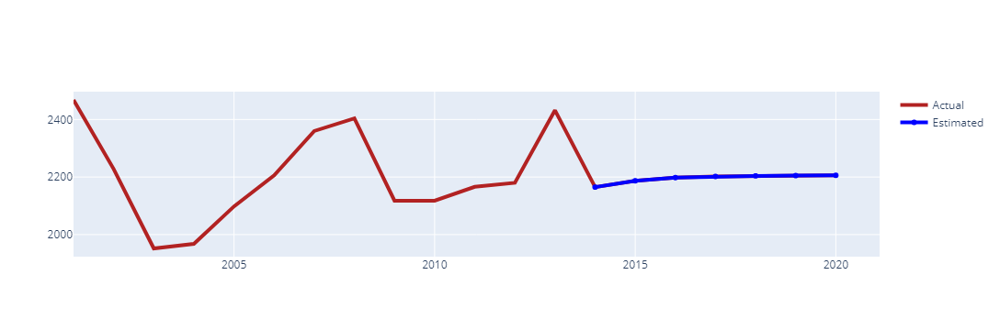

In [178]:
i=13
for j in range(len(forecast_df_NAG)):
    crimes_NAG_forecast.loc[i] = crimes_NAG_forecast.YEAR[i-1]+1
    crimes_NAG_forecast.TOTAL[i] = forecast_df_NAG[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_NAG_forecast["YEAR"], y= crimes_NAG_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_NAG_forecast["YEAR"][13:], y= crimes_NAG_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

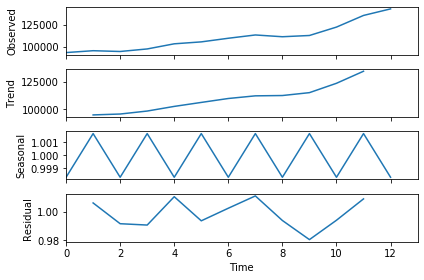

In [179]:
crime_ODI_df = crimes_total[crimes_total.STATE=='ODISHA']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_ODI_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

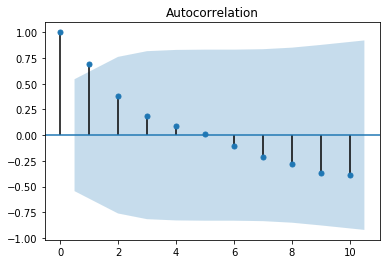

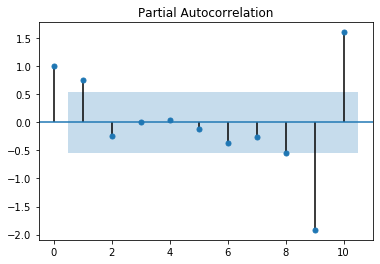

In [180]:
crimes_ODI_forecast = crime_ODI_df.copy()
crimes_ODI_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_ODI_forecast = crimes_ODI_forecast.reset_index(drop = True)
plot(crimes_ODI_forecast)


In [181]:
ODI_arim = ARIMA(crimes_ODI_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
ODI_moODI = ODI_arim.fit()
ODI_moODI.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
===================================================================
Model:               ARMA             BIC:                 198.4759
Dependent Variable:  y                Log-Likelihood:      -95.784 
Date:                2020-08-03 09:37 Scale:               1.0000  
No. Observations:    10               Method:              css-mle 
Df Model:            2                Sample:              0       
Df Residuals:        8                                     0       
Converged:           1.0000           S.D. of innovations: 3148.934
No. Iterations:      26.0000          HQIC:                196.572 
AIC:                 197.5682                                      
-------------------------------------------------------------------
           Coef.     Std.Err.    t    P>|t|    [0.025      0.975]  
-------------------------------------------------------------------
const   103295.1087 7878.1261 13.1116 0.0000 87854.2653 118735.9520
ar.L1.y      0.9363    0.0813 11.5114 0.0000     0.7769      1.0957
----------------------------------------------------------------------------
                Real           Imaginary          Modulus          Frequency
----------------------------------------------------------------------------
AR.1           1.0680             0.0000           1.0680             0.0000
===================================================================

"""

In [182]:
forecast_ODI = ODI_moODI.predict(10,12)
print('prediction',forecast_ODI)
forecast_df_ODI, stderr, ci = ODI_moODI.forecast(steps=7)
print('forecasting',forecast_df_ODI)

prediction [112305.17627528 111731.37958557 111194.12453517]
forecasting [112305.17627528 111731.37958557 111194.12453517 110691.08400816
 110220.07908858 109779.06962242 109366.14538074]


In [183]:
get_mape(crimes_ODI_forecast.TOTAL[10:13],forecast_ODI)

	

16.21

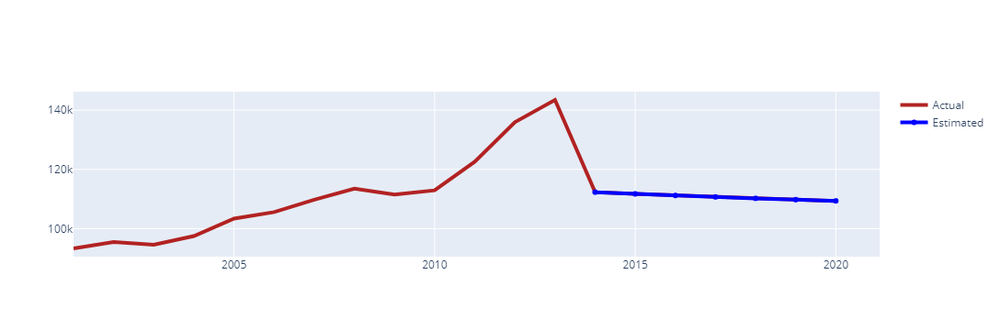

In [184]:
i=13
for j in range(len(forecast_df_ODI)):
    crimes_ODI_forecast.loc[i] = crimes_ODI_forecast.YEAR[i-1]+1
    crimes_ODI_forecast.TOTAL[i] = forecast_df_ODI[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_ODI_forecast["YEAR"], y= crimes_ODI_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_ODI_forecast["YEAR"][13:], y= crimes_ODI_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

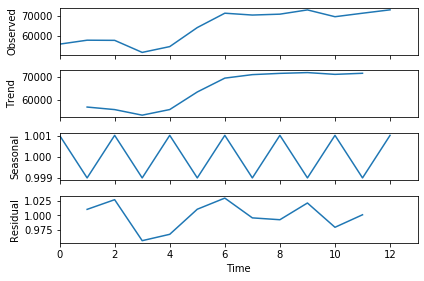

In [185]:
crime_PUN_df = crimes_total[crimes_total.STATE=='PUNJAB']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_PUN_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

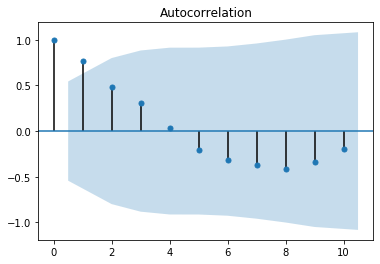

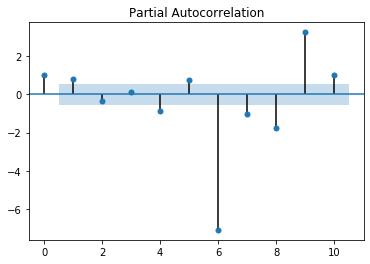

In [186]:
crimes_PUN_forecast = crime_PUN_df.copy()
crimes_PUN_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_PUN_forecast = crimes_PUN_forecast.reset_index(drop = True)
plot(crimes_PUN_forecast)


In [187]:
PUN_arim = ARIMA(crimes_PUN_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
PUN_moPUN = PUN_arim.fit()
PUN_moPUN.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 205.3438
Dependent Variable: y                Log-Likelihood:      -99.218 
Date:               2020-08-03 09:37 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 4652.277
No. Iterations:     32.0000          HQIC:                203.440 
AIC:                204.4360                                      
------------------------------------------------------------------
           Coef.     Std.Err.    t    P>|t|    [0.025     0.975]  
------------------------------------------------------------------
const    63544.7132 6116.1019 10.3897 0.0000 51557.3739 75532.0526
ar.L1.y      0.8276    0.1632  5.0720 0.0010     0.5078     1.1474
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.2083             0.0000           1.2083             0.0000
==================================================================

"""

In [188]:
forecast_PUN = PUN_moPUN.predict(10,12)
print('prediction',forecast_PUN)
forecast_df_PUN, stderr, ci = PUN_moPUN.forecast(steps=7)
print('forecasting',forecast_df_PUN)


prediction [71614.98981682 70223.76654149 69072.37422918]
forecasting [71614.98981682 70223.76654149 69072.37422918 68119.46876796
 67330.83329739 66678.14955199 66137.981011  ]


In [189]:
get_mape(crimes_PUN_forecast.TOTAL[10:13],forecast_PUN)


3.45

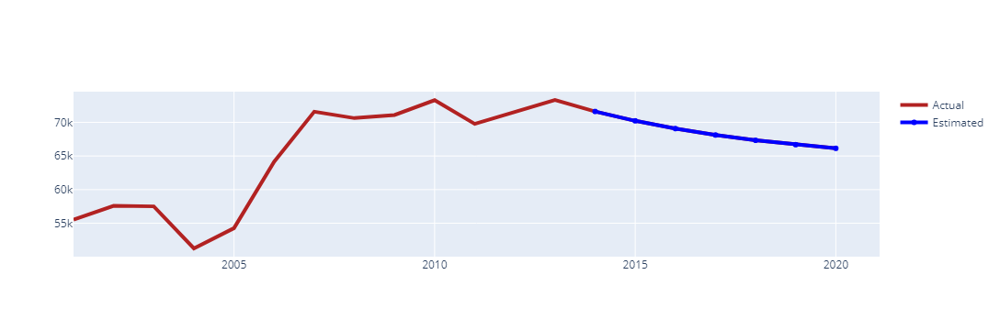

In [190]:
i=13
for j in range(len(forecast_df_PUN)):
    crimes_PUN_forecast.loc[i] = crimes_PUN_forecast.YEAR[i-1]+1
    crimes_PUN_forecast.TOTAL[i] = forecast_df_PUN[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_PUN_forecast["YEAR"], y= crimes_PUN_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_PUN_forecast["YEAR"][13:], y= crimes_PUN_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

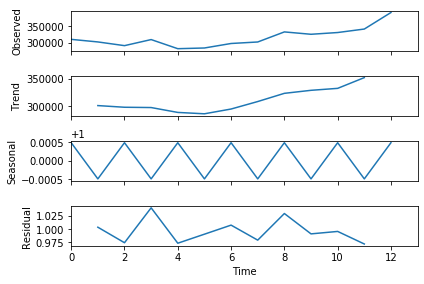

In [191]:
crime_RAJ_df = crimes_total[crimes_total.STATE=='RAJASTHAN']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_RAJ_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

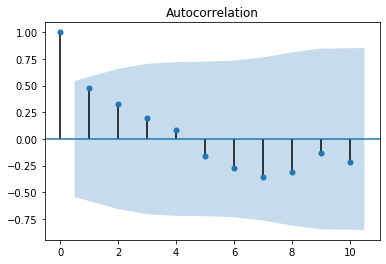

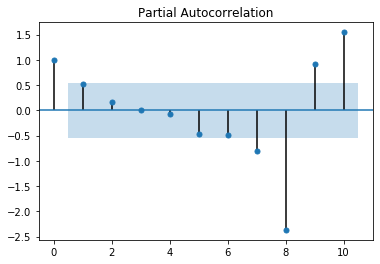

In [192]:
crimes_RAJ_forecast = crime_RAJ_df.copy()
crimes_RAJ_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_RAJ_forecast = crimes_RAJ_forecast.reset_index(drop = True)
plot(crimes_RAJ_forecast)

In [193]:
RAJ_arim = ARIMA(crimes_RAJ_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
RAJ_moRAJ = RAJ_arim.fit()
RAJ_moRAJ.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
====================================================================
Model:               ARMA             BIC:                 226.7057 
Dependent Variable:  y                Log-Likelihood:      -109.90  
Date:                2020-08-03 09:37 Scale:               1.0000   
No. Observations:    10               Method:              css-mle  
Df Model:            2                Sample:              0        
Df Residuals:        8                                     0        
Converged:           1.0000           S.D. of innovations: 14180.581
No. Iterations:      22.0000          HQIC:                224.802  
AIC:                 225.7979                                       
--------------------------------------------------------------------
           Coef.     Std.Err.    t    P>|t|     [0.025      0.975]  
--------------------------------------------------------------------
const   305879.5267 7835.7779 39.0363 0.0000 290521.6843 321237.3691
ar.L1.y      0.4503    0.2945  1.5289 0.1648     -0.1270      1.0275
-----------------------------------------------------------------------------
                 Real           Imaginary          Modulus          Frequency
-----------------------------------------------------------------------------
AR.1            2.2209             0.0000           2.2209             0.0000
====================================================================

"""

In [194]:
forecast_RAJ = RAJ_moRAJ.predict(10,12)
print('prediction',forecast_RAJ)
forecast_df_RAJ, stderr, ci = RAJ_moRAJ.forecast(steps=7)
print('forecasting',forecast_df_RAJ)

prediction [314900.58423064 309941.4991658  307708.53845721]
forecasting [314900.58423064 309941.4991658  307708.53845721 306703.08816529
 306250.35727503 306046.5030809  305954.71227678]


In [195]:
get_mape(crimes_RAJ_forecast.TOTAL[10:13],forecast_RAJ)

11.96

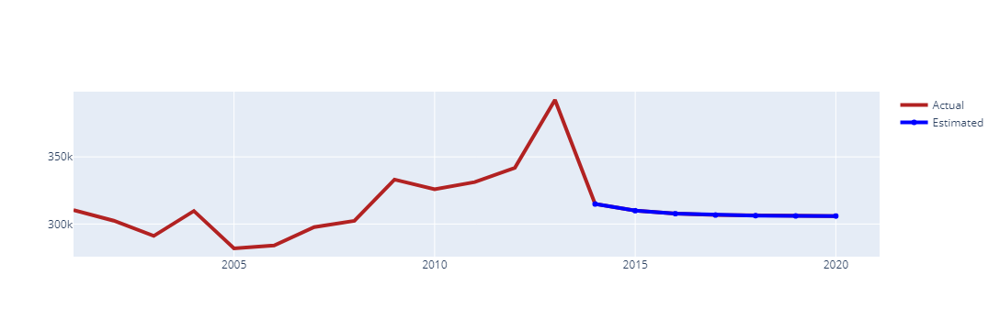

In [196]:
i=13
for j in range(len(forecast_df_RAJ)):
    crimes_RAJ_forecast.loc[i] = crimes_RAJ_forecast.YEAR[i-1]+1
    crimes_RAJ_forecast.TOTAL[i] = forecast_df_RAJ[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_RAJ_forecast["YEAR"], y= crimes_RAJ_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_RAJ_forecast["YEAR"][13:], y= crimes_RAJ_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

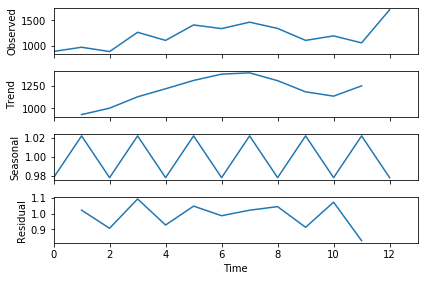

In [197]:
crime_SIK_df = crimes_total[crimes_total.STATE=='SIKKIM']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_SIK_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

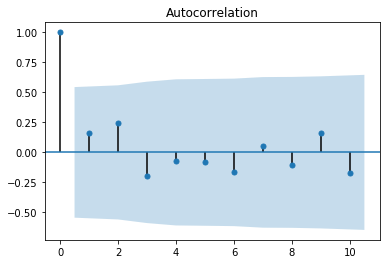

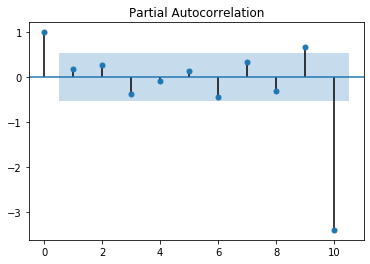

In [198]:

crimes_SIK_forecast = crime_SIK_df.copy()
crimes_SIK_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_SIK_forecast = crimes_SIK_forecast.reset_index(drop = True)
plot(crimes_SIK_forecast)


In [199]:
SIK_arim = ARIMA(crimes_SIK_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
SIK_moSIK = SIK_arim.fit()
SIK_moSIK.summary2()


C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 138.7634
Dependent Variable: y                Log-Likelihood:      -65.928 
Date:               2020-08-03 09:38 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 173.785 
No. Iterations:     21.0000          HQIC:                136.860 
AIC:                137.8557                                      
-------------------------------------------------------------------
            Coef.    Std.Err.     t     P>|t|    [0.025     0.975] 
-------------------------------------------------------------------
const     1142.9124  108.4975  10.5340  0.0000  930.2612  1355.5636
ar.L1.y      0.5236    0.2766   1.8929  0.0950   -0.0186     1.0658
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.9098             0.0000           1.9098             0.0000
==================================================================

"""

In [200]:
forecast_SIK = SIK_moSIK.predict(10,12)
print('prediction',forecast_SIK)
forecast_df_SIK, stderr, ci = SIK_moSIK.forecast(steps=7)
print('forecasting',forecast_df_SIK)


prediction [1122.53687995 1132.24325868 1137.32576383]
forecasting [1122.53687995 1132.24325868 1137.32576383 1139.98709196 1141.38063061
 1142.11032266 1142.49240785]


In [201]:
get_mape(crimes_SIK_forecast.TOTAL[10:13],forecast_SIK)


15.41

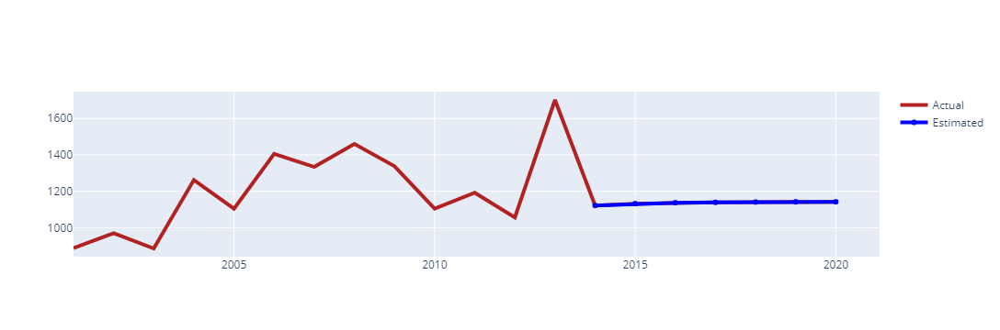

In [202]:
i=13
for j in range(len(forecast_df_SIK)):
    crimes_SIK_forecast.loc[i] = crimes_SIK_forecast.YEAR[i-1]+1
    crimes_SIK_forecast.TOTAL[i] = forecast_df_SIK[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_SIK_forecast["YEAR"], y= crimes_SIK_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_SIK_forecast["YEAR"][13:], y= crimes_SIK_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

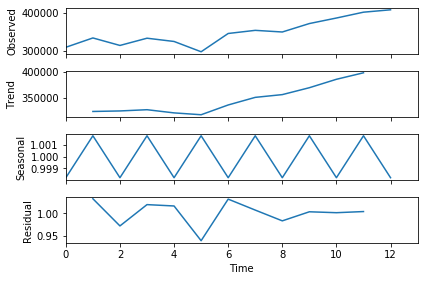

In [203]:
crime_TN_df = crimes_total[crimes_total.STATE=='TAMIL NADU']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_TN_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

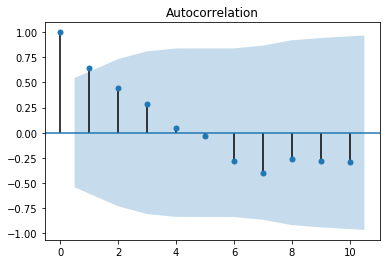

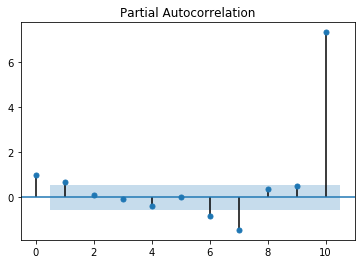

In [204]:
crimes_TN_forecast = crime_TN_df.copy()
crimes_TN_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_TN_forecast = crimes_TN_forecast.reset_index(drop = True)
plot(crimes_TN_forecast)

In [205]:
TN_arim = ARIMA(crimes_TN_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
TN_moTN = TN_arim.fit()
TN_moTN.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
====================================================================
Model:               ARMA             BIC:                 233.7156 
Dependent Variable:  y                Log-Likelihood:      -113.40  
Date:                2020-08-03 09:38 Scale:               1.0000   
No. Observations:    10               Method:              css-mle  
Df Model:            2                Sample:              0        
Df Residuals:        8                                     0        
Converged:           1.0000           S.D. of innovations: 20229.016
No. Iterations:      19.0000          HQIC:                231.812  
AIC:                 232.8079                                       
--------------------------------------------------------------------
           Coef.     Std.Err.    t    P>|t|     [0.025      0.975]  
--------------------------------------------------------------------
const   334059.0136 9419.2921 35.4654 0.0000 315597.5404 352520.4868
ar.L1.y      0.3512    0.3645  0.9635 0.3635     -0.3632      1.0656
-----------------------------------------------------------------------------
                 Real           Imaginary          Modulus          Frequency
-----------------------------------------------------------------------------
AR.1            2.8474             0.0000           2.8474             0.0000
====================================================================

"""

In [206]:
forecast_TN = TN_moTN.predict(10,12)
print('prediction',forecast_TN)
forecast_df_TN, stderr, ci = TN_moTN.forecast(steps=7)
print('forecasting',forecast_df_TN)


prediction [347157.78066347 338659.32357874 335674.65054075]
forecasting [347157.78066347 338659.32357874 335674.65054075 334626.42813345
 334258.29058499 334129.0000321  334083.5929631 ]


In [207]:
get_mape(crimes_TN_forecast.TOTAL[10:13],forecast_TN)


14.37

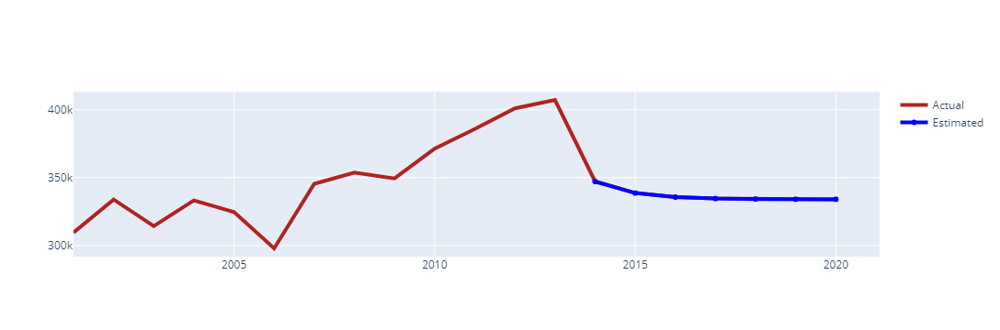

In [208]:
i=13
for j in range(len(forecast_df_TN)):
    crimes_TN_forecast.loc[i] = crimes_TN_forecast.YEAR[i-1]+1
    crimes_TN_forecast.TOTAL[i] = forecast_df_TN[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_TN_forecast["YEAR"], y= crimes_TN_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_TN_forecast["YEAR"][13:], y= crimes_TN_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

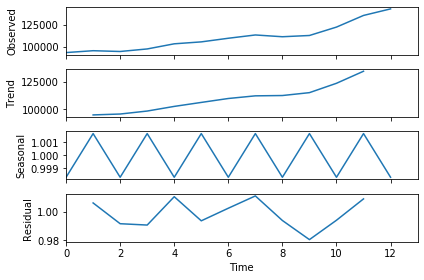

In [209]:
crime_TRI_df = crimes_total[crimes_total.STATE=='TRIPURA']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_ODI_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

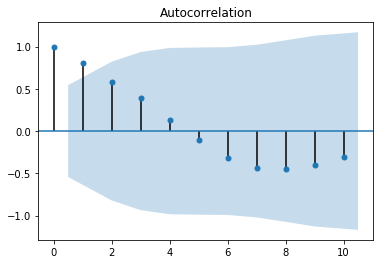

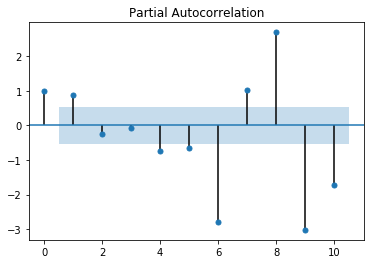

In [210]:
crimes_TRI_forecast = crime_TRI_df.copy()
crimes_TRI_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_TRI_forecast = crimes_TRI_forecast.reset_index(drop = True)
plot(crimes_TRI_forecast)

In [211]:
TRI_arim = ARIMA(crimes_TRI_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
TRI_moTRI = TRI_arim.fit()
TRI_moTRI.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 175.1609
Dependent Variable: y                Log-Likelihood:      -84.127 
Date:               2020-08-03 09:38 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 987.193 
No. Iterations:     39.0000          HQIC:                173.257 
AIC:                174.2532                                      
------------------------------------------------------------------
              Coef.    Std.Err.   t    P>|t|    [0.025    0.975]  
------------------------------------------------------------------
const       8471.2869 2299.4657 3.6840 0.0062 3964.4170 12978.1568
ar.L1.y        0.9282    0.0929 9.9884 0.0000    0.7461     1.1103
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.0774             0.0000           1.0774             0.0000
==================================================================

"""

In [212]:
forecast_TRI = TRI_moTRI.predict(10,12)
print('prediction',forecast_TRI)
forecast_df_TRI, stderr, ci = TRI_moTRI.forecast(steps=7)
print('forecasting',forecast_df_TRI)

prediction [11384.59627704 11175.37971018 10981.18783404]
forecasting [11384.59627704 11175.37971018 10981.18783404 10800.94166461
 10633.63970409 10478.35237632 10334.21686174]


In [213]:
get_mape(crimes_TRI_forecast.TOTAL[10:13],forecast_TRI)


8.1

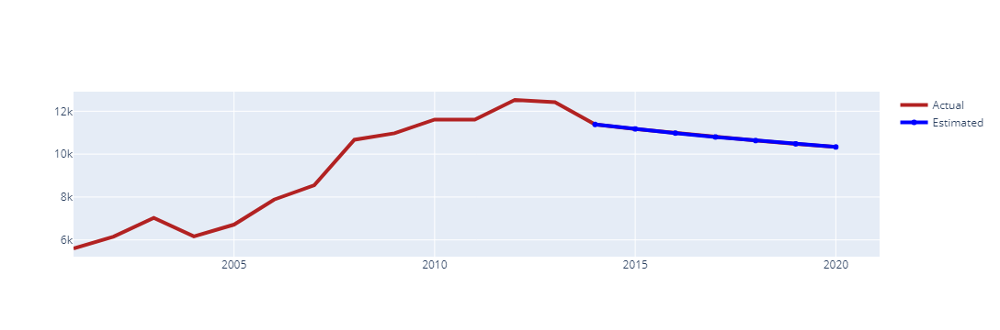

In [214]:
i=13
for j in range(len(forecast_df_TRI)):
    crimes_TRI_forecast.loc[i] = crimes_TRI_forecast.YEAR[i-1]+1
    crimes_TRI_forecast.TOTAL[i] = forecast_df_TRI[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_TRI_forecast["YEAR"], y= crimes_TRI_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_TRI_forecast["YEAR"][13:], y= crimes_TRI_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

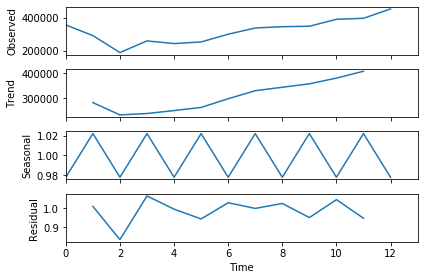

In [215]:
crime_UP_df = crimes_total[crimes_total.STATE=='UTTAR PRADESH']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_UP_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

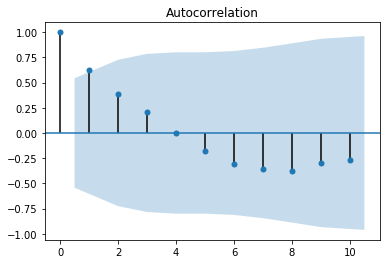

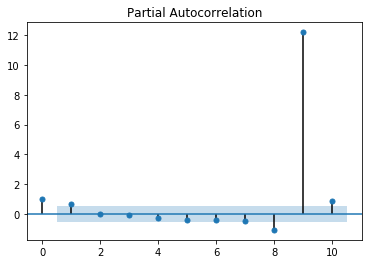

In [216]:
crimes_UP_forecast = crime_UP_df.copy()
crimes_UP_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_UP_forecast = crimes_UP_forecast.reset_index(drop = True)
plot(crimes_UP_forecast)

In [217]:
UP_arim = ARIMA(crimes_UP_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
UP_moUP = UP_arim.fit()
UP_moUP.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                            Results: ARMA
=====================================================================
Model:                ARMA             BIC:                 249.7402 
Dependent Variable:   y                Log-Likelihood:      -121.42  
Date:                 2020-08-03 09:38 Scale:               1.0000   
No. Observations:     10               Method:              css-mle  
Df Model:             2                Sample:              0        
Df Residuals:         8                                     0        
Converged:            1.0000           S.D. of innovations: 44574.887
No. Iterations:       18.0000          HQIC:                247.837  
AIC:                  248.8325                                       
---------------------------------------------------------------------
           Coef.     Std.Err.     t    P>|t|     [0.025      0.975]  
---------------------------------------------------------------------
const   304435.4380 29779.4033 10.2230 0.0000 246068.8801 362801.9960
ar.L1.y      0.5468     0.2783  1.9644 0.0851      0.0012      1.0923
-------------------------------------------------------------------------------
                Real            Imaginary           Modulus           Frequency
-------------------------------------------------------------------------------
AR.1           1.8289              0.0000            1.8289              0.0000
=====================================================================

"""

In [218]:
forecast_UP = UP_moUP.predict(10,12)
print('prediction',forecast_UP)
forecast_df_UP, stderr, ci = UP_moUP.forecast(steps=7)
print('forecasting',forecast_df_UP)

prediction [328451.06077648 317566.50575629 311615.1369066 ]
forecasting [328451.06077648 317566.50575629 311615.1369066  308361.09564176
 306581.87731053 305609.05071968 305077.13647438]


In [219]:
get_mape(crimes_UP_forecast.TOTAL[10:13],forecast_UP)


22.29

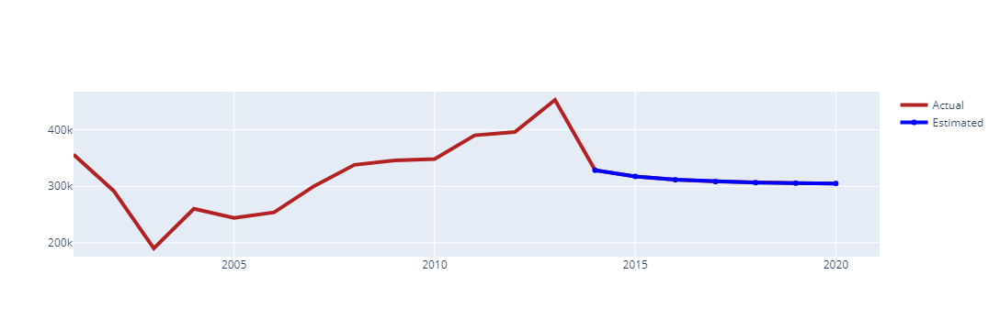

In [220]:
i=13
for j in range(len(forecast_df_UP)):
    crimes_UP_forecast.loc[i] = crimes_UP_forecast.YEAR[i-1]+1
    crimes_UP_forecast.TOTAL[i] = forecast_df_UP[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_UP_forecast["YEAR"], y= crimes_UP_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_UP_forecast["YEAR"][13:], y= crimes_UP_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

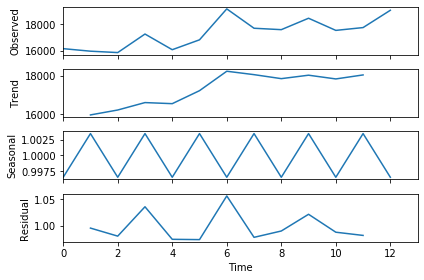

In [221]:
crime_UK_df = crimes_total[crimes_total.STATE=='UTTARAKHAND']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_UK_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

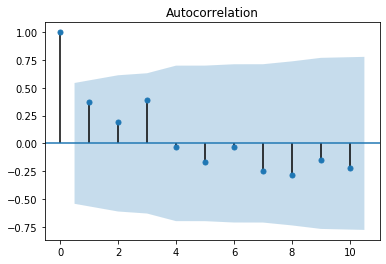

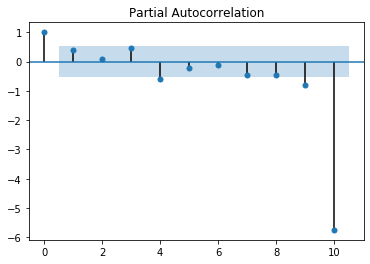

In [222]:
crimes_UK_forecast = crime_UK_df.copy()
crimes_UK_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_UK_forecast = crimes_UK_forecast.reset_index(drop = True)
plot(crimes_UK_forecast)

In [223]:
UK_arim = ARIMA(crimes_UK_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
UK_moUK = UK_arim.fit()
UK_moUK.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 173.6592
Dependent Variable: y                Log-Likelihood:      -83.376 
Date:               2020-08-03 09:38 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 1002.008
No. Iterations:     21.0000          HQIC:                171.756 
AIC:                172.7514                                      
------------------------------------------------------------------
            Coef.    Std.Err.    t    P>|t|    [0.025     0.975]  
------------------------------------------------------------------
const     17133.8609 499.0784 34.3310 0.0000 16155.6852 18112.0366
ar.L1.y       0.4032   0.3062  1.3170 0.2243    -0.1968     1.0033
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          2.4801             0.0000           2.4801             0.0000
==================================================================

"""

In [224]:
forecast_UK = UK_moUK.predict(10,12)
print('prediction',forecast_UK)
forecast_df_UK, stderr, ci = UK_moUK.forecast(steps=7)
print('forecasting',forecast_df_UK)


prediction [17676.62963192 17352.70743857 17222.10069539]
forecasting [17676.62963192 17352.70743857 17222.10069539 17169.43952639
 17148.2063293  17139.64501804 17136.19306259]


In [225]:
get_mape(crimes_UK_forecast.TOTAL[10:13],forecast_UK)


4.28

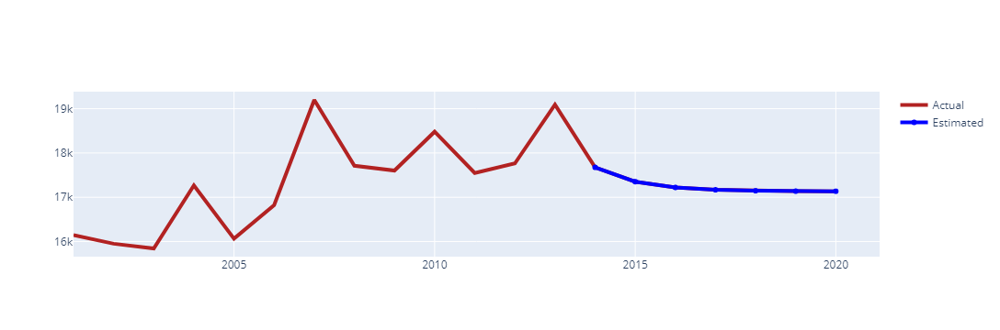

In [226]:
i=13
for j in range(len(forecast_df_UK)):
    crimes_UK_forecast.loc[i] = crimes_UK_forecast.YEAR[i-1]+1
    crimes_UK_forecast.TOTAL[i] = forecast_df_UK[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_UK_forecast["YEAR"], y= crimes_UK_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_UK_forecast["YEAR"][13:], y= crimes_UK_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

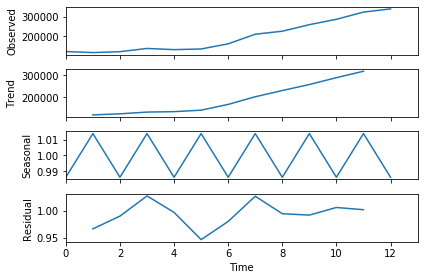

In [227]:
crime_WB_df = crimes_total[crimes_total.STATE=='WEST BENGAL']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_WB_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

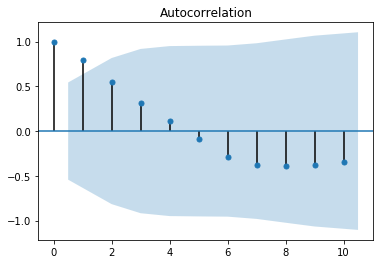

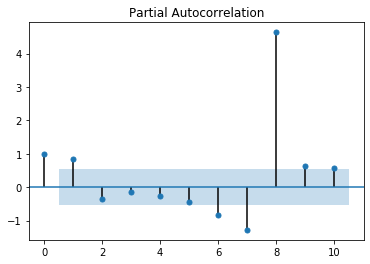

In [228]:
crimes_WB_forecast = crime_WB_df.copy()
crimes_WB_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_WB_forecast = crimes_WB_forecast.reset_index(drop = True)
plot(crimes_WB_forecast)

In [229]:
WB_arim = ARIMA(crimes_WB_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
WB_moWB = WB_arim.fit()
WB_moWB.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
====================================================================
Model:               ARMA             BIC:                 237.8857 
Dependent Variable:  y                Log-Likelihood:      -115.49  
Date:                2020-08-03 09:38 Scale:               1.0000   
No. Observations:    10               Method:              css-mle  
Df Model:            2                Sample:              0        
Df Residuals:        8                                     0        
Converged:           1.0000           S.D. of innovations: 22693.565
No. Iterations:      32.0000          HQIC:                235.982  
AIC:                 236.9780                                       
--------------------------------------------------------------------
           Coef.     Std.Err.     t    P>|t|    [0.025      0.975]  
--------------------------------------------------------------------
const   182656.0964 54034.1684  3.3804 0.0096 76751.0723 288561.1205
ar.L1.y      0.9301     0.0895 10.3943 0.0000     0.7547      1.1054
-----------------------------------------------------------------------------
                 Real           Imaginary          Modulus          Frequency
-----------------------------------------------------------------------------
AR.1            1.0752             0.0000           1.0752             0.0000
====================================================================

"""

In [230]:
forecast_WB = WB_moWB.predict(10,12)
print('prediction',forecast_WB)
forecast_df_WB, stderr, ci = WB_moWB.forecast(steps=7)
print('forecasting',forecast_df_WB)

prediction [253875.74911675 248894.15164516 244261.00172183]
forecasting [253875.74911675 248894.15164516 244261.00172183 239951.9265036
 235944.25795335 232216.913594   228750.28560344]


In [231]:
get_mape(crimes_WB_forecast.TOTAL[10:13],forecast_WB)


20.74

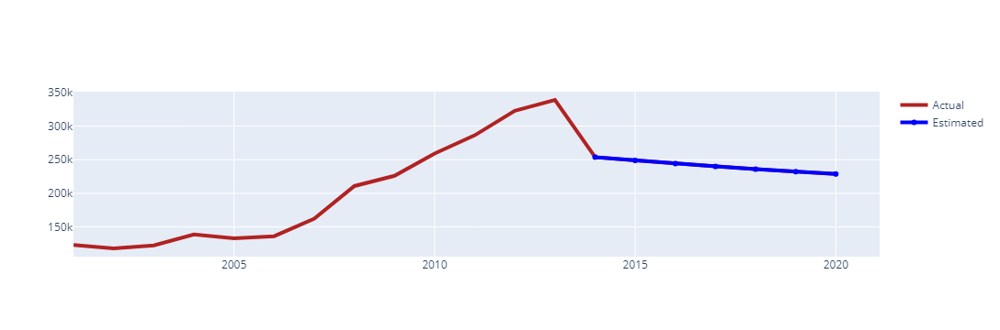

In [232]:
i=13
for j in range(len(forecast_df_WB)):
    crimes_WB_forecast.loc[i] = crimes_WB_forecast.YEAR[i-1]+1
    crimes_WB_forecast.TOTAL[i] = forecast_df_WB[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_WB_forecast["YEAR"], y= crimes_WB_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_WB_forecast["YEAR"][13:], y= crimes_WB_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

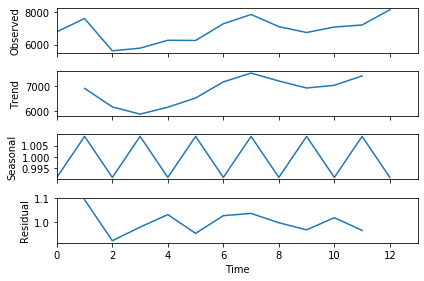

In [233]:
crime_CHAN_df = crimes_total[crimes_total.STATE=='CHANDIGARH']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_CHAN_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

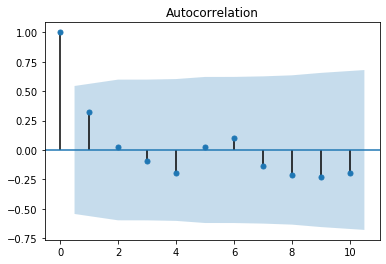

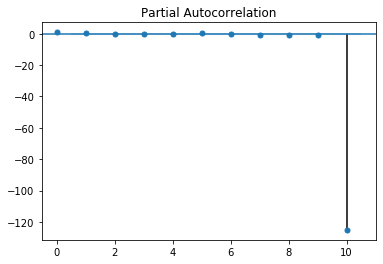

In [234]:
crimes_CHAN_forecast = crime_CHAN_df.copy()
crimes_CHAN_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_CHAN_forecast = crimes_CHAN_forecast.reset_index(drop = True)
plot(crimes_CHAN_forecast)

In [235]:
CHAN_arim = ARIMA(crimes_CHAN_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
CHAN_moCHAN = CHAN_arim.fit()
CHAN_moCHAN.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 165.8077
Dependent Variable: y                Log-Likelihood:      -79.450 
Date:               2020-08-03 09:38 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 679.825 
No. Iterations:     19.0000          HQIC:                163.904 
AIC:                164.8999                                      
-------------------------------------------------------------------
           Coef.    Std.Err.     t     P>|t|     [0.025     0.975] 
-------------------------------------------------------------------
const    6734.6145  289.2416  23.2837  0.0000  6167.7115  7301.5176
ar.L1.y     0.2846    0.2849   0.9991  0.3470    -0.2737     0.8429
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          3.5137             0.0000           3.5137             0.0000
==================================================================

"""

In [236]:
forecast_CHAN = CHAN_moCHAN.predict(10,12)
print('prediction',forecast_CHAN)
forecast_df_CHAN, stderr, ci = CHAN_moCHAN.forecast(steps=7)
print('forecasting',forecast_df_CHAN)

prediction [6737.85488466 6735.53675271 6734.87700322]
forecasting [6737.85488466 6735.53675271 6734.87700322 6734.68923591 6734.63579659
 6734.62058755 6734.616259  ]


In [237]:
get_mape(crimes_CHAN_forecast.TOTAL[10:13],forecast_CHAN)

	

9.63

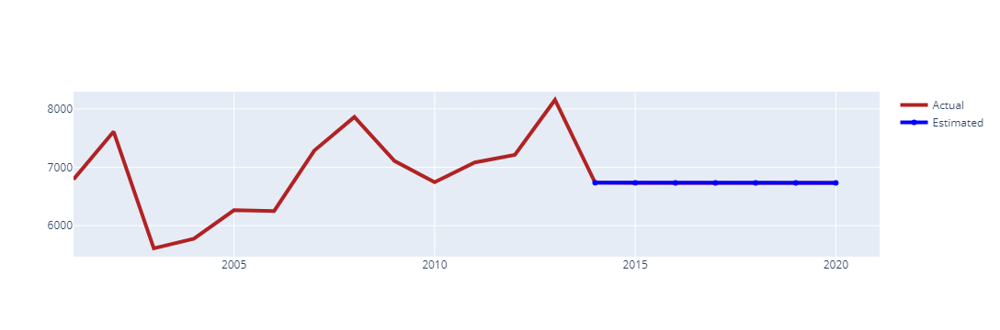

In [238]:
i=13
for j in range(len(forecast_df_CHAN)):
    crimes_CHAN_forecast.loc[i] = crimes_CHAN_forecast.YEAR[i-1]+1
    crimes_CHAN_forecast.TOTAL[i] = forecast_df_CHAN[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_CHAN_forecast["YEAR"], y= crimes_CHAN_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_CHAN_forecast["YEAR"][13:], y= crimes_CHAN_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

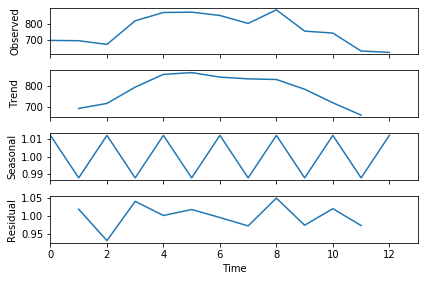

In [239]:
crime_DNH_df = crimes_total[crimes_total.STATE=='D & N HAVELI']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_DNH_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

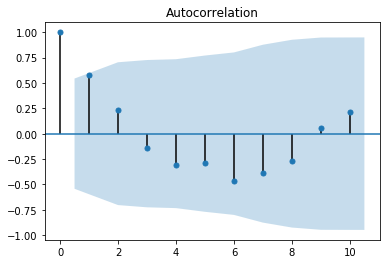

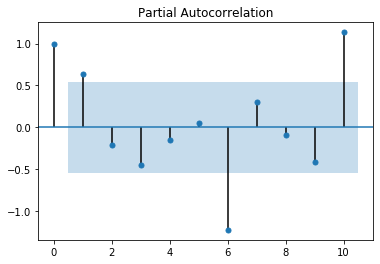

In [240]:
crimes_DNH_forecast = crime_DNH_df.copy()
crimes_DNH_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_DNH_forecast = crimes_DNH_forecast.reset_index(drop = True)
plot(crimes_DNH_forecast)

In [241]:
DNH_arim = ARIMA(crimes_DNH_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
DNH_moDNH = DNH_arim.fit()
DNH_moDNH.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 118.6818
Dependent Variable: y                Log-Likelihood:      -55.887 
Date:               2020-08-03 09:38 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 63.646  
No. Iterations:     16.0000          HQIC:                116.778 
AIC:                117.7741                                      
-------------------------------------------------------------------
             Coef.    Std.Err.     t     P>|t|    [0.025    0.975] 
-------------------------------------------------------------------
const       780.4122   39.9984  19.5111  0.0000  702.0167  858.8076
ar.L1.y       0.5293    0.2681   1.9744  0.0838    0.0039    1.0547
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.8893             0.0000           1.8893             0.0000
==================================================================

"""

In [242]:
forecast_DNH = DNH_moDNH.predict(10,12)
print('prediction',forecast_DNH)
forecast_df_DNH, stderr, ci = DNH_moDNH.forecast(steps=7)
print('forecasting',forecast_df_DNH)

prediction [767.49066444 773.57273768 776.79201322]
forecasting [767.49066444 773.57273768 776.79201322 778.49599385 779.39792038
 779.87531515 780.12800289]


In [243]:
get_mape(crimes_DNH_forecast.TOTAL[10:13],forecast_DNH)

	

16.16

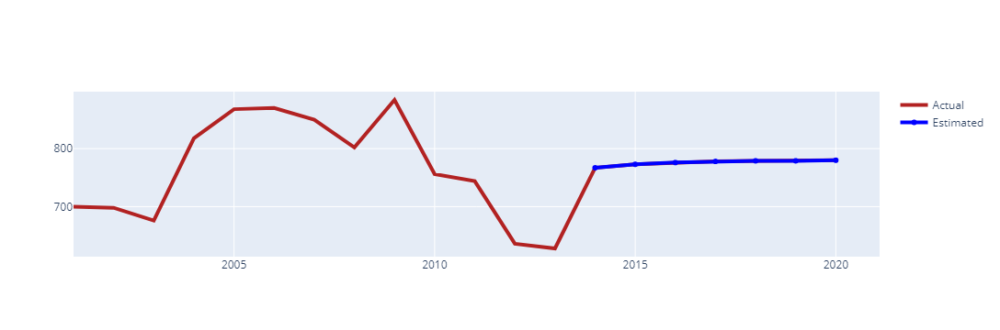

In [244]:
i=13
for j in range(len(forecast_df_DNH)):
    crimes_DNH_forecast.loc[i] = crimes_DNH_forecast.YEAR[i-1]+1
    crimes_DNH_forecast.TOTAL[i] = forecast_df_DNH[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_DNH_forecast["YEAR"], y= crimes_DNH_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_DNH_forecast["YEAR"][13:], y= crimes_DNH_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

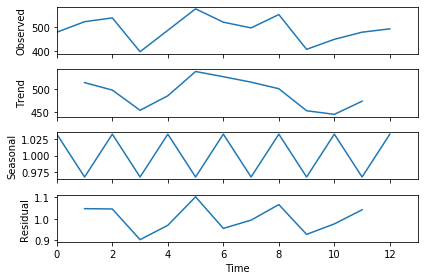

In [245]:
crime_DD_df = crimes_total[crimes_total.STATE=='DAMAN & DIU']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_DD_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

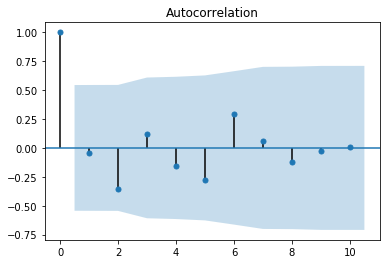

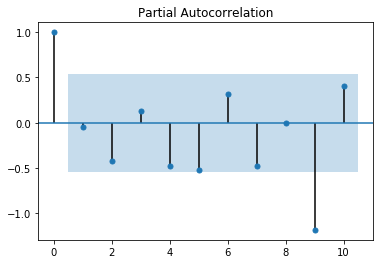

In [246]:
crimes_DD_forecast = crime_DD_df.copy()
crimes_DD_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_DD_forecast = crimes_DD_forecast.reset_index(drop = True)
plot(crimes_DD_forecast)

In [247]:
DD_arim = ARIMA(crimes_DD_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
DD_moDD = DD_arim.fit()
DD_moDD.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 115.0994
Dependent Variable: y                Log-Likelihood:      -54.096 
Date:               2020-08-03 09:38 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 53.881  
No. Iterations:     12.0000          HQIC:                113.196 
AIC:                114.1916                                      
-------------------------------------------------------------------
             Coef.    Std.Err.     t     P>|t|    [0.025    0.975] 
-------------------------------------------------------------------
const       499.4611   13.9205  35.8795  0.0000  472.1774  526.7448
ar.L1.y      -0.2725    0.3431  -0.7944  0.4499   -0.9449    0.3999
--------------------------------------------------------------------------
                 Real          Imaginary         Modulus         Frequency
--------------------------------------------------------------------------
AR.1           -3.6695            0.0000          3.6695            0.5000
==================================================================

"""

In [248]:
forecast_DD = DD_moDD.predict(10,12)
print('prediction',forecast_DD)
forecast_df_DD, stderr, ci = DD_moDD.forecast(steps=7)
print('forecasting',forecast_df_DD)

prediction [524.93083509 492.52020059 501.3526386 ]
forecasting [524.93083509 492.52020059 501.3526386  498.94565205 499.601596
 499.42284034 499.47155424]


In [249]:
get_mape(crimes_DD_forecast.TOTAL[10:13],forecast_DD)


7.37

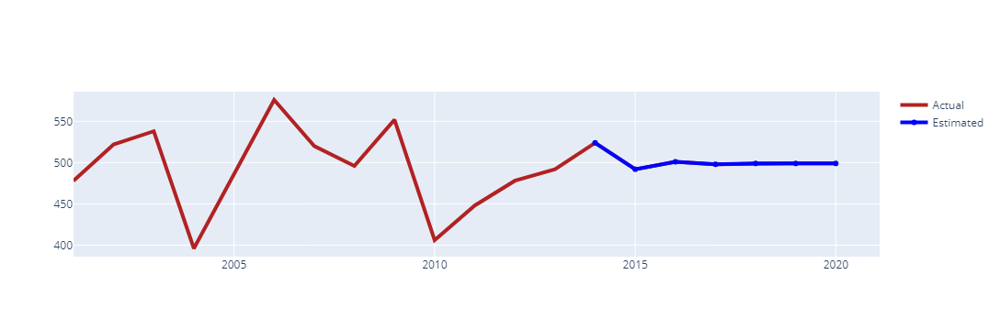

In [250]:
i=13
for j in range(len(forecast_df_DD)):
    crimes_DD_forecast.loc[i] = crimes_DD_forecast.YEAR[i-1]+1
    crimes_DD_forecast.TOTAL[i] = forecast_df_DD[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_DD_forecast["YEAR"], y= crimes_DD_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_DD_forecast["YEAR"][13:], y= crimes_DD_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

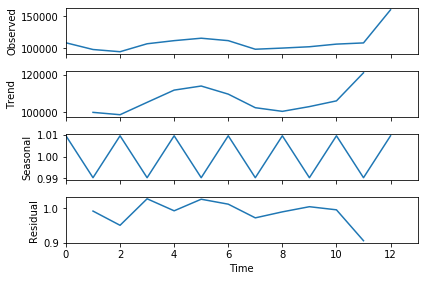

In [251]:
crime_DEL_df = crimes_total[crimes_total.STATE=='DELHI UT']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_DEL_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

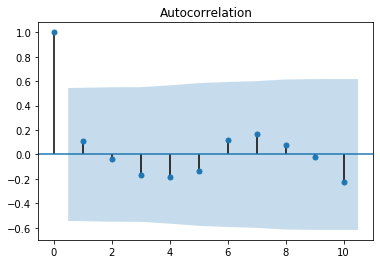

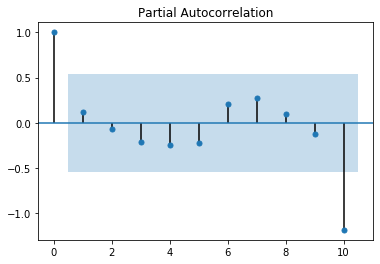

In [252]:
crimes_DEL_forecast = crime_DEL_df.copy()
crimes_DEL_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_DEL_forecast = crimes_DEL_forecast.reset_index(drop = True)
plot(crimes_DEL_forecast)

In [253]:
DEL_arim = ARIMA(crimes_DEL_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
DEL_moDEL = DEL_arim.fit()
DEL_moDEL.summary2()


C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                           Results: ARMA
===================================================================
Model:               ARMA             BIC:                 209.8719
Dependent Variable:  y                Log-Likelihood:      -101.48 
Date:                2020-08-03 09:39 Scale:               1.0000  
No. Observations:    10               Method:              css-mle 
Df Model:            2                Sample:              0       
Df Residuals:        8                                     0       
Converged:           1.0000           S.D. of innovations: 6130.740
No. Iterations:      23.0000          HQIC:                207.968 
AIC:                 208.9641                                      
-------------------------------------------------------------------
           Coef.     Std.Err.    t    P>|t|    [0.025      0.975]  
-------------------------------------------------------------------
const   105175.1642 2988.6660 35.1913 0.0000 99317.4866 111032.8419
ar.L1.y      0.3889    0.2759  1.4093 0.1964    -0.1519      0.9297
----------------------------------------------------------------------------
                Real           Imaginary          Modulus          Frequency
----------------------------------------------------------------------------
AR.1           2.5716             0.0000           2.5716             0.0000
===================================================================

"""

In [254]:
forecast_DEL = DEL_moDEL.predict(10,12)
print('prediction',forecast_DEL)
forecast_df_DEL, stderr, ci = DEL_moDEL.forecast(steps=7)
print('forecasting',forecast_df_DEL)

prediction [104167.56401265 104783.34876991 105022.80285212]
forecasting [104167.56401265 104783.34876991 105022.80285212 105115.91697489
 105152.12533592 105166.20532046 105171.68046373]


In [255]:
get_mape(crimes_DEL_forecast.TOTAL[10:13],forecast_DEL)

	

13.46

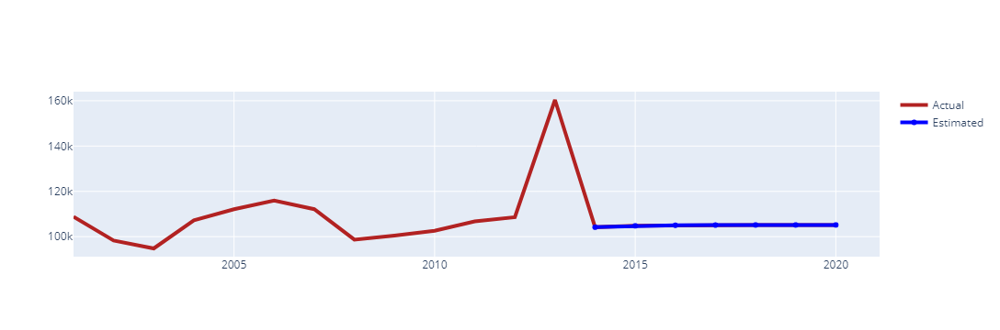

In [256]:
i=13
for j in range(len(forecast_df_DEL)):
    crimes_DEL_forecast.loc[i] = crimes_DEL_forecast.YEAR[i-1]+1
    crimes_DEL_forecast.TOTAL[i] = forecast_df_DEL[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_DEL_forecast["YEAR"], y= crimes_DEL_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_DEL_forecast["YEAR"][13:], y= crimes_DEL_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

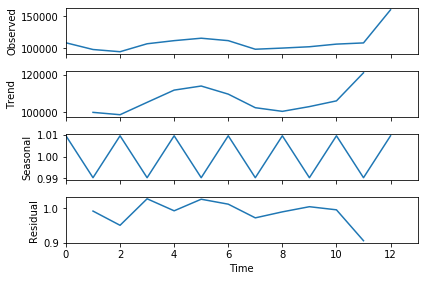

In [257]:
crime_LAK_df = crimes_total[crimes_total.STATE=='LAKSHADWEEP']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_DEL_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

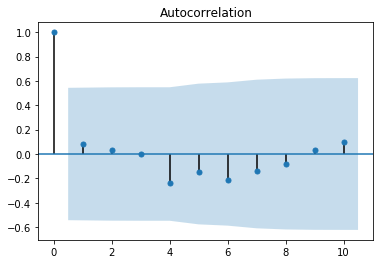

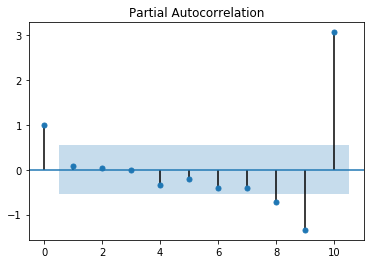

In [258]:
crimes_LAK_forecast = crime_LAK_df.copy()
crimes_LAK_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_LAK_forecast = crimes_LAK_forecast.reset_index(drop = True)
plot(crimes_LAK_forecast)


In [259]:
LAK_arim = ARIMA(crimes_LAK_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
LAK_moLAK = LAK_arim.fit()
LAK_moLAK.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 117.3625
Dependent Variable: y                Log-Likelihood:      -55.227 
Date:               2020-08-03 09:39 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 60.567  
No. Iterations:     8.0000           HQIC:                115.459 
AIC:                116.4547                                      
--------------------------------------------------------------------
           Coef.     Std.Err.     t      P>|t|     [0.025    0.975] 
--------------------------------------------------------------------
const     127.5060    19.9569   6.3891   0.0002   88.3912   166.6208
ar.L1.y     0.0288     0.3266   0.0883   0.9318   -0.6113     0.6690
--------------------------------------------------------------------------
                 Real          Imaginary         Modulus         Frequency
--------------------------------------------------------------------------
AR.1           34.6648            0.0000         34.6648            0.0000
==================================================================

"""

In [260]:
forecast_LAK = LAK_moLAK.predict(10,12)
print('prediction',forecast_LAK)
forecast_df_LAK, stderr, ci = LAK_moLAK.forecast(steps=7)
print('forecasting',forecast_df_LAK)

prediction [126.25094595 127.46979037 127.50495128]
forecasting [126.25094595 127.46979037 127.50495128 127.50596559 127.50599485
 127.50599569 127.50599572]


In [261]:
get_mape(crimes_LAK_forecast.TOTAL[10:13],forecast_LAK)


36.36

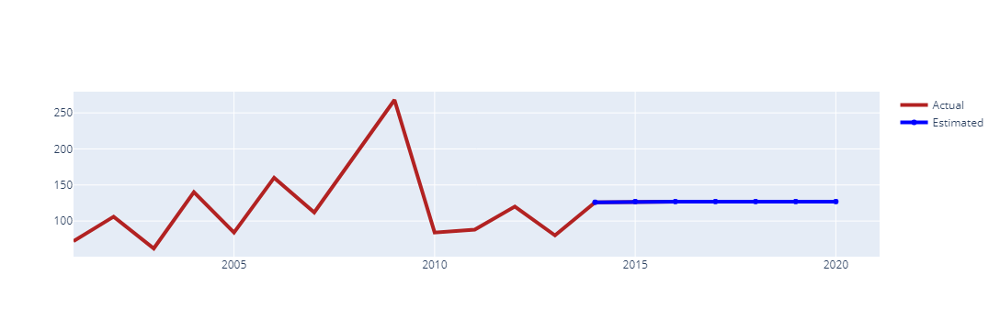

In [262]:
i=13
for j in range(len(forecast_df_LAK)):
    crimes_LAK_forecast.loc[i] = crimes_LAK_forecast.YEAR[i-1]+1
    crimes_LAK_forecast.TOTAL[i] = forecast_df_LAK[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_LAK_forecast["YEAR"], y= crimes_LAK_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_LAK_forecast["YEAR"][13:], y= crimes_LAK_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

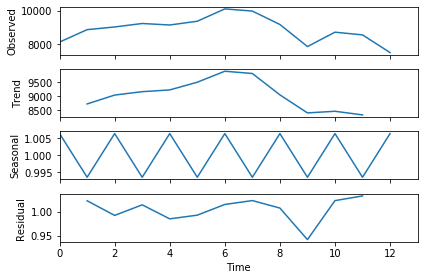

In [263]:
crime_PUD_df = crimes_total[crimes_total.STATE=='PUDUCHERRY']
ts_decompose = sm.tsa.seasonal_decompose(np.array(crime_PUD_df['TOTAL']),
                                 model = "multiplicative", freq=2)
ts_plot = ts_decompose.plot()

(<Figure size 432x288 with 1 Axes>, <Figure size 432x288 with 1 Axes>)

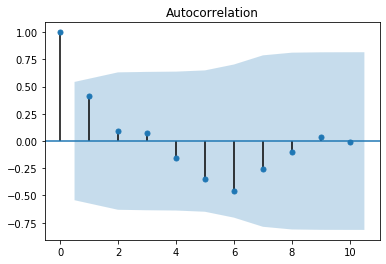

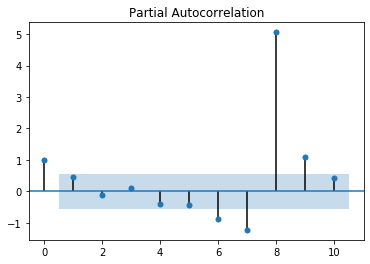

In [264]:
crimes_PUD_forecast = crime_PUD_df.copy()
crimes_PUD_forecast.drop(['STATE'], axis = 1, inplace = True)
crimes_PUD_forecast = crimes_PUD_forecast.reset_index(drop = True)
plot(crimes_PUD_forecast)

In [265]:
PUD_arim = ARIMA(crimes_PUD_forecast.TOTAL[0:10].astype(np.float64).as_matrix(), order=(1,0,0))
PUD_moPUD = PUD_arim.fit()
PUD_moPUD.summary2()

C:\Users\Sharang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



<class 'statsmodels.iolib.summary2.Summary'>
"""
                          Results: ARMA
==================================================================
Model:              ARMA             BIC:                 162.7972
Dependent Variable: y                Log-Likelihood:      -77.945 
Date:               2020-08-03 09:39 Scale:               1.0000  
No. Observations:   10               Method:              css-mle 
Df Model:           2                Sample:              0       
Df Residuals:       8                                     0       
Converged:          1.0000           S.D. of innovations: 573.446 
No. Iterations:     23.0000          HQIC:                160.894 
AIC:                161.8894                                      
-------------------------------------------------------------------
           Coef.    Std.Err.     t     P>|t|     [0.025     0.975] 
-------------------------------------------------------------------
const    8829.3261  488.4888  18.0748  0.0000  7871.9057  9786.7466
ar.L1.y     0.6161    0.3109   1.9815  0.0829     0.0067     1.2255
---------------------------------------------------------------------------
               Real           Imaginary          Modulus          Frequency
---------------------------------------------------------------------------
AR.1          1.6231             0.0000           1.6231             0.0000
==================================================================

"""

In [266]:
forecast_PUD = PUD_moPUD.predict(10,12)
print('prediction',forecast_PUD)
forecast_df_PUD, stderr, ci = PUD_moPUD.forecast(steps=7)
print('forecasting',forecast_df_PUD)


prediction [8238.26659871 8465.16283068 8604.95802325]
forecasting [8238.26659871 8465.16283068 8604.95802325 8691.08856714 8744.15527461
 8776.85070779 8796.99500167]


In [267]:
get_mape(crimes_PUD_forecast.TOTAL[10:13],forecast_PUD)


7.08

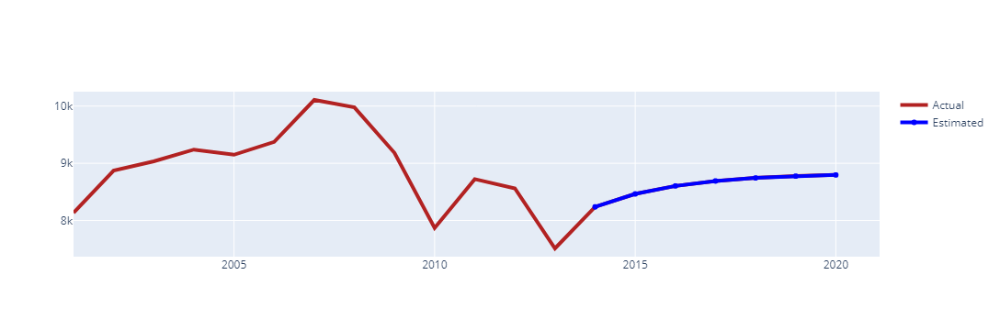

In [268]:
i=13
for j in range(len(forecast_df_PUD)):
    crimes_PUD_forecast.loc[i] = crimes_PUD_forecast.YEAR[i-1]+1
    crimes_PUD_forecast.TOTAL[i] = forecast_df_PUD[j]
    i = i+1

fig = go.Figure()
fig.add_trace(go.Scatter(x= crimes_PUD_forecast["YEAR"], y= crimes_PUD_forecast['TOTAL'],
                    name = "Actual",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= crimes_PUD_forecast["YEAR"][13:], y= crimes_PUD_forecast['TOTAL'][13:],
                    name = "Estimated",line=dict(color='blue', width=4)))

In [269]:
#Crimes in UP
crimes_UP = crimes_df[crimes_df.STATE=="UTTAR PRADESH"]


In [270]:
crimes_UP.columns

Index(['STATE', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL_BREACH_OF_TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT', 'DOWRY DEATHS',
       'ASSAULT_WOMEN_MODESTY', 'INSULT TO MODESTY OF WOMEN',
       'CRUELTY_BY_HUSBAND', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'DEATH_BY_NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL', 'TOTAL_THEFT'],
      dtype='object')

In [271]:
# Countplot for crime types
Dist_UP = crimes_UP[crimes_UP.DISTRICT=='TOTAL']
Dist_UP = crimes_UP.groupby(["YEAR"]).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()


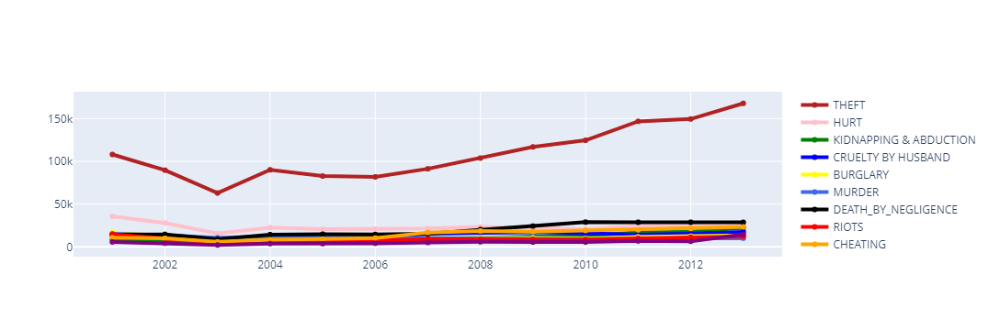

In [272]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= Dist_UP["YEAR"], y= Dist_UP['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= Dist_UP["YEAR"], y= Dist_UP['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= Dist_UP["YEAR"], y= Dist_UP['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= Dist_UP["YEAR"], y= Dist_UP["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= Dist_UP["YEAR"], y= Dist_UP['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= Dist_UP["YEAR"], y= Dist_UP['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= Dist_UP["YEAR"], y= Dist_UP['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= Dist_UP["YEAR"], y= Dist_UP['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= Dist_UP["YEAR"], y= Dist_UP['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= Dist_UP["YEAR"], y= Dist_UP['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [273]:
crimes_theft = crimes_UP[crimes_UP.DISTRICT!="TOTAL"]
crimes_theft = crimes_theft.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'HURT':sum, 'DEATH_BY_NEGLIGENCE':sum}).reset_index()
crimes_theft.head(5)

,DISTRICT,TOTAL_THEFT,HURT,DEATH_BY_NEGLIGENCE
0,AGRA,47480,5680,5047
1,ALIGARH,24724,4034,3464
2,ALLAHABAD,21606,5482,4261
3,AMBEDKAR NAGAR,2866,2027,678
4,AMETHI,284,211,137


In [274]:
crimes_large = crimes_theft[(crimes_theft.TOTAL_THEFT>10000) & (crimes_theft.HURT>5000) & (crimes_theft.DEATH_BY_NEGLIGENCE>2000)].reset_index()

crimes_large

,index,DISTRICT,TOTAL_THEFT,HURT,DEATH_BY_NEGLIGENCE
0,0,AGRA,47480,5680,5047
1,2,ALLAHABAD,21606,5482,4261
2,46,KANPUR NAGAR,30178,5795,4541


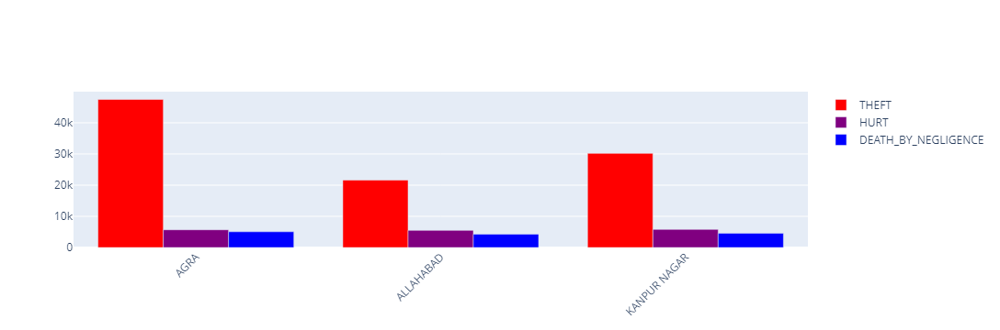

In [275]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=crimes_large["DISTRICT"],
    y=crimes_large["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=crimes_large["DISTRICT"],
    y=crimes_large["HURT"],
    name='HURT',
    marker_color='Purple'
))
fig.add_trace(go.Bar(
    x=crimes_large["DISTRICT"],
    y=crimes_large["DEATH_BY_NEGLIGENCE"],
    name='DEATH_BY_NEGLIGENCE',
    marker_color='blue'
))
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [276]:
crimes_up_clus = crimes_UP.copy()

In [277]:
crimes_up_clus.columns

Index(['STATE', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL_BREACH_OF_TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT', 'DOWRY DEATHS',
       'ASSAULT_WOMEN_MODESTY', 'INSULT TO MODESTY OF WOMEN',
       'CRUELTY_BY_HUSBAND', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'DEATH_BY_NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL', 'TOTAL_THEFT'],
      dtype='object')

In [278]:
crimes_up_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)

In [279]:
crimes_up_main = crimes_up_clus[crimes_up_clus.DISTRICT!="TOTAL"]


In [280]:
crimes_up_df = crimes_up_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()
       

In [281]:
scale = StandardScaler()
scale_new = scale.fit_transform(crimes_up_df[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

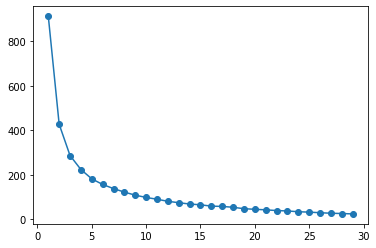

In [282]:
cluster_range = range(1,30)
cluster_error = []

for x in cluster_range:
    cluster = KMeans(x)
    cluster.fit(scale_new)
    cluster_error.append(cluster.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(cluster_range, cluster_error, marker = "o")

In [283]:
k = 3
cluster_new = KMeans(3, random_state = 42)
cluster_new.fit(scale_new)
crimes_up_df['Cluster_ID'] = cluster_new.labels_

In [284]:
crimes_up_df[crimes_up_df.Cluster_ID == 0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_ID
0,AGRA,47480,5680,2965,4402,3405,1742,5047,3750,3714,1517,22469,0
1,ALIGARH,24724,4034,2533,3209,2190,2217,3464,3251,3209,1294,15977,0
2,ALLAHABAD,21606,5482,1731,2638,3217,1775,4261,2831,1964,880,23587,0
15,BAREILLY,15592,4868,2083,2827,1803,2184,2978,2960,1453,1273,22784,0
32,GHAZIABAD,54022,822,2686,3413,2459,2364,5103,4051,1372,767,22904,0
46,KANPUR NAGAR,30178,5795,2897,4580,3020,2082,4541,4820,2047,1193,25535,0
53,LUCKNOW,62858,831,3295,6518,7216,1961,5546,8808,3074,1762,49453,0
59,MEERUT,36964,712,2439,3955,2538,2636,3597,3464,2236,1108,20270,0


In [285]:
crimes_up_df[crimes_up_df.Cluster_ID == 1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_ID
3,AMBEDKAR NAGAR,2866,2027,593,923,531,462,678,659,420,189,4048,1
4,AMETHI,284,211,116,35,61,31,137,27,50,83,572,1
5,AMROHA,558,117,113,171,55,65,190,117,34,57,995,1
6,AURAIYA,2448,1575,662,410,317,511,1652,370,291,225,4547,1
9,BAGHPAT,4610,1198,628,890,473,1028,1027,673,649,241,4921,1
10,BAHRAICH,4068,2144,916,448,858,620,1067,1171,623,328,8073,1
11,BALLIA,3624,2104,493,343,882,471,961,566,848,265,4274,1
12,BALRAMPUR,1220,780,331,190,308,249,348,430,164,157,1696,1
13,BANDA,2938,1197,493,520,753,651,638,644,518,651,7315,1
16,BASTI,2708,1736,383,401,503,400,1084,622,446,176,5256,1


In [286]:
crimes_up_df[crimes_up_df.Cluster_ID == 2]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_ID
7,AZAMGARH,4708,3687,852,1171,1068,1035,1375,1015,1300,271,7337,2
8,BADAUN,5180,3885,1146,600,736,1854,828,735,334,597,12222,2
14,BARABANKI,5290,3313,979,1240,1050,810,2070,736,369,433,10879,2
18,BIJNOR,6678,3326,1123,2150,739,1161,2222,1936,686,620,9018,2
19,BULANDSHAHAR,10876,2087,1652,2548,962,2159,3215,1844,1173,919,14947,2
24,ETAH,6684,3319,1048,1006,746,1536,1859,1108,1175,614,10368,2
28,FATEHPUR,2808,2643,733,617,617,1051,2406,925,256,451,7839,2
29,FIROZABAD,10056,3719,1594,1288,843,1512,1307,1270,1313,592,11721,2
31,GAUTAMBUDH NAGAR,43852,422,1086,1046,1522,1040,2694,2679,1142,528,12837,2
35,GORAKHPUR,15098,4180,1609,1630,2081,1233,3307,2471,1829,550,11007,2


In [287]:
#crimes in Delhi
crimes_DEL = crimes_df[crimes_df.STATE=="DELHI UT"]
crimes_DEL.shape

(202, 34)

In [288]:
crimes_DEL.columns

Index(['STATE', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL_BREACH_OF_TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT', 'DOWRY DEATHS',
       'ASSAULT_WOMEN_MODESTY', 'INSULT TO MODESTY OF WOMEN',
       'CRUELTY_BY_HUSBAND', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'DEATH_BY_NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL', 'TOTAL_THEFT'],
      dtype='object')

In [289]:
Dist_DEL = crimes_DEL[crimes_DEL.DISTRICT=='TOTAL']


In [290]:
Dist_DEL = crimes_DEL.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()

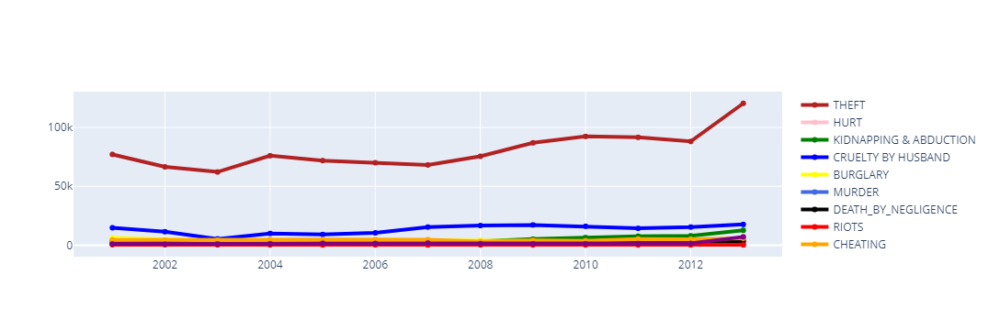

In [291]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= Dist_DEL["YEAR"], y= Dist_DEL['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= Dist_DEL["YEAR"], y= Dist_DEL['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= Dist_DEL["YEAR"], y= Dist_DEL['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= Dist_DEL["YEAR"], y= Dist_UP["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= Dist_DEL["YEAR"], y= Dist_DEL['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= Dist_DEL["YEAR"], y= Dist_DEL['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= Dist_DEL["YEAR"], y= Dist_DEL['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= Dist_DEL["YEAR"], y= Dist_DEL['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= Dist_DEL["YEAR"], y= Dist_DEL['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= Dist_DEL["YEAR"], y= Dist_DEL['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [292]:
crimes_all = crimes_DEL[crimes_DEL.DISTRICT!="TOTAL"]
crimes_all = crimes_all.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'CRUELTY_BY_HUSBAND':sum}).reset_index()


In [293]:
crimes_del = crimes_all[(crimes_all.TOTAL_THEFT>10000) & (crimes_all.CRUELTY_BY_HUSBAND>1000)].reset_index()
crimes_del

,index,DISTRICT,TOTAL_THEFT,CRUELTY_BY_HUSBAND
0,3,EAST,66834,2106
1,10,NORTH EAST,45272,2385
2,11,NORTH WEST,60216,2416
3,12,OUTER,30016,1573
4,14,SOUTH,81774,1560
5,16,SOUTH WEST,37768,1901
6,18,WEST,60336,2916


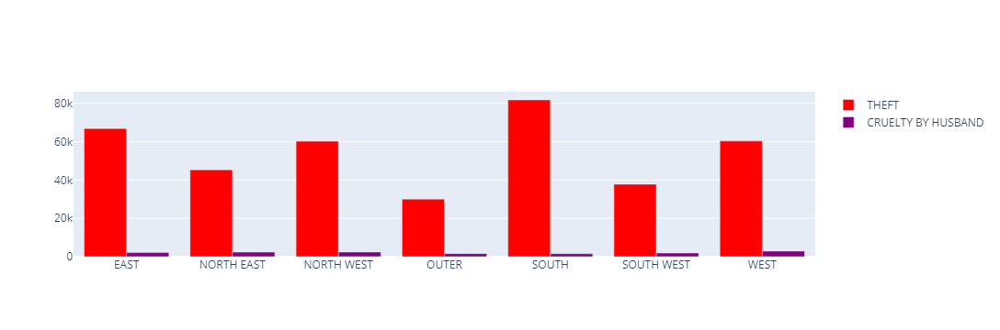

In [294]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=crimes_del["DISTRICT"],
    y=crimes_del["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=crimes_del["DISTRICT"],
    y=crimes_del["CRUELTY_BY_HUSBAND"],
    name='CRUELTY BY HUSBAND',
    marker_color='Purple'
))

In [295]:
crimes_del_clus = crimes_DEL.copy()
crimes_del_clus.columns

Index(['STATE', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL_BREACH_OF_TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT', 'DOWRY DEATHS',
       'ASSAULT_WOMEN_MODESTY', 'INSULT TO MODESTY OF WOMEN',
       'CRUELTY_BY_HUSBAND', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'DEATH_BY_NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL', 'TOTAL_THEFT'],
      dtype='object')

In [296]:
crimes_del_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)

In [297]:
crimes_del_main = crimes_del_clus[crimes_del_clus.DISTRICT!="TOTAL"]


In [298]:
crimes_del_df = crimes_del_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()
    
       

In [299]:
scaled = StandardScaler()
scaled_new = scaled.fit_transform(crimes_del_df[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

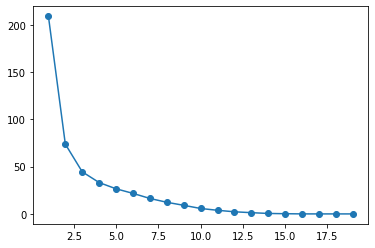

In [300]:
new_range = range(1,20)
rate_error = []
for i in new_range:
    cluster_df = KMeans(i)
    cluster_df.fit(scaled_new)
    rate_error.append(cluster_df.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_range, rate_error, marker="o")

In [301]:
k = 2
clusterdel = KMeans(2, random_state=42)
clusterdel.fit(scaled_new)
crimes_del_df['cluster_id'] = clusterdel.labels_

In [302]:
crimes_del_df[crimes_del_df.cluster_id == 0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
0,CAW,0,2,0,991,0,0,0,0,0,4,1,0
1,CENTRAL,35030,1877,1305,656,1186,336,203,2286,58,593,14833,0
2,CRIME BRANCH,36,0,5,0,0,6,0,266,0,0,116,0
4,EOW,0,0,0,0,0,0,0,748,0,1,174,0
5,G.R.P.(RLY),23422,112,159,2,17,114,8,180,10,56,1124,0
6,I.G.I. AIRPORT,2190,22,48,3,7,17,49,4810,10,59,1964,0
7,METRO RAIL,1750,1,8,2,4,1,1,11,2,16,21,0
8,NEW DELHI,19582,415,377,111,609,93,804,2571,112,332,8837,0
9,NORTH,27842,1696,1491,892,1284,390,253,1805,81,510,18084,0
13,S.T.F.,6,0,1,0,0,2,0,126,0,1,115,0


In [303]:
crimes_del_df[crimes_del_df.cluster_id == 1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
3,EAST,66834,2826,3530,2106,2489,621,1119,2090,155,1364,25252,1
10,NORTH EAST,45272,3360,4308,2385,1800,832,1529,1331,86,1141,20552,1
11,NORTH WEST,60216,3231,4651,2416,4595,1145,521,2028,102,1290,39694,1
12,OUTER,30016,1585,3576,1573,2000,619,498,1132,39,749,14369,1
14,SOUTH,81774,2300,2929,1560,4592,736,812,3860,177,1663,40114,1
15,SOUTH EAST,31264,1427,2604,730,1126,329,1533,1229,50,925,12126,1
16,SOUTH WEST,37768,1817,2975,1901,3468,687,756,2155,161,1161,27985,1
18,WEST,60336,3307,3410,2916,3213,794,1195,2326,66,1184,34187,1


In [304]:
#Crimes in west bengal

In [305]:
crimes_WB = crimes_df[crimes_df.STATE=="WEST BENGAL"]
crimes_WB.shape

(339, 34)

In [306]:
crimes_WB.columns

Index(['STATE', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL_BREACH_OF_TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT', 'DOWRY DEATHS',
       'ASSAULT_WOMEN_MODESTY', 'INSULT TO MODESTY OF WOMEN',
       'CRUELTY_BY_HUSBAND', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'DEATH_BY_NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL', 'TOTAL_THEFT'],
      dtype='object')

In [307]:
DIST_WB = crimes_WB[crimes_WB.DISTRICT=='TOTAL']

In [308]:
DIST_WB = crimes_WB.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()


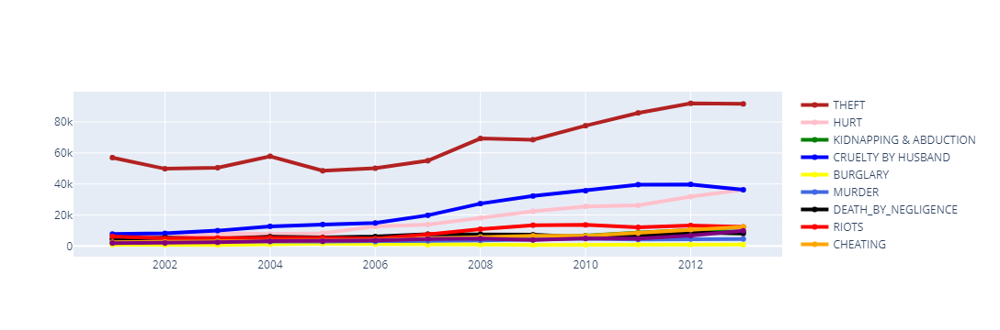

In [309]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_WB["YEAR"], y= DIST_WB['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_WB["YEAR"], y= DIST_WB['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_WB["YEAR"], y= DIST_WB['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_WB["YEAR"], y= DIST_WB["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_WB["YEAR"], y= DIST_WB['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_WB["YEAR"], y= DIST_WB['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_WB["YEAR"], y= DIST_WB['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_WB["YEAR"], y= DIST_WB['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_WB["YEAR"], y= DIST_WB['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_WB["YEAR"], y= DIST_WB['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [310]:
crimes_wb_df = crimes_WB[crimes_WB.DISTRICT!="TOTAL"]
crimes_wb_df = crimes_wb_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'CRUELTY_BY_HUSBAND':sum, 'HURT':sum}).reset_index()


In [311]:
crimes_wb_df

,DISTRICT,TOTAL_THEFT,CRUELTY_BY_HUSBAND,HURT
0,24 PARGANAS NORTH,46672,19162,1909
1,24 PARGANAS SOUTH,39304,20650,2200
2,ASANSOL,7772,3030,1011
3,BANKURA,5988,2136,2370
4,BDN CP,3188,549,270
5,BIRBHUM,7946,2874,3390
6,BKP CP,5364,1694,392
7,BURDWAN,14558,5538,2271
8,COOCHBEHAR,5254,4556,1464
9,DAKSHIN DINAJPUR,3558,2494,1670


In [312]:
wb_crimes = crimes_wb_df[(crimes_wb_df.TOTAL_THEFT>10000) & (crimes_wb_df.CRUELTY_BY_HUSBAND>5000) & (crimes_wb_df.HURT>2000)].reset_index()
wb_crimes

,index,DISTRICT,TOTAL_THEFT,CRUELTY_BY_HUSBAND,HURT
0,1,24 PARGANAS SOUTH,39304,20650,2200
1,7,BURDWAN,14558,5538,2271
2,11,HOOGHLY,16928,7962,2520
3,12,HOWRAH,34454,8020,3409
4,13,JALPAIGURI,28960,7524,5715
5,16,KOLKATA,92454,5367,22930
6,19,MURSHIDABAD,17532,19168,22380
7,20,NADIA,25622,12962,17831


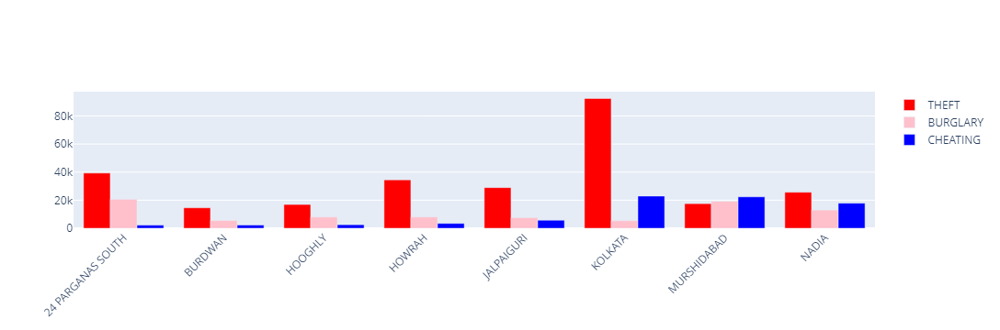

In [313]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=wb_crimes["DISTRICT"],
    y=wb_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=wb_crimes["DISTRICT"],
    y=wb_crimes["CRUELTY_BY_HUSBAND"],
    name='BURGLARY',
    marker_color='PINK'
))
fig.add_trace(go.Bar(
    x=wb_crimes["DISTRICT"],
    y=wb_crimes["HURT"],
    name='CHEATING',
    marker_color='Blue'
))
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [314]:
crimes_wb_clus = crimes_WB.copy()
crimes_wb_clus.columns

Index(['STATE', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL_BREACH_OF_TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT', 'DOWRY DEATHS',
       'ASSAULT_WOMEN_MODESTY', 'INSULT TO MODESTY OF WOMEN',
       'CRUELTY_BY_HUSBAND', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'DEATH_BY_NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL', 'TOTAL_THEFT'],
      dtype='object')

In [315]:
crimes_wb_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)

In [316]:
crimes_wb_main = crimes_wb_clus[crimes_wb_clus.DISTRICT!="TOTAL"]

In [317]:
crimes_KMe_wb = crimes_wb_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()

In [318]:
scaled = StandardScaler()
scaled_wb = scaled.fit_transform(crimes_KMe_wb[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

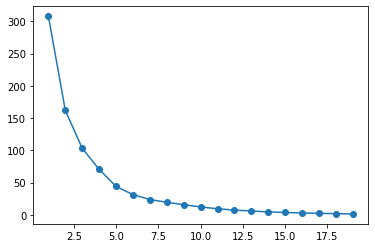

In [319]:
new = range(1,20)
rate = []
for i in new:
    clustering = KMeans(i)
    clustering.fit(scaled_wb)
    rate.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new, rate, marker="o")

In [320]:
k = 3
wb_clus = KMeans(3, random_state=42)
wb_clus.fit(scaled_wb)
crimes_KMe_wb['cluster_id'] = wb_clus.labels_

In [321]:
crimes_KMe_wb[crimes_KMe_wb.cluster_id==0] 

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
0,24 PARGANAS NORTH,46672,1909,3739,19162,398,2465,188,2404,5995,2226,64593,0
1,24 PARGANAS SOUTH,39304,2200,2606,20650,690,2340,482,1863,10807,1650,67134,0
7,BURDWAN,14558,2271,986,5538,250,1419,5904,1390,3557,1047,23595,0
11,HOOGHLY,16928,2520,976,7962,344,1241,1945,1311,5463,600,19235,0
12,HOWRAH,34454,3409,1674,8020,371,1126,3437,2796,2591,1369,36080,0
13,JALPAIGURI,28960,5715,2140,7524,523,1451,3104,661,818,2192,27484,0
19,MURSHIDABAD,17532,22380,3339,19168,120,1812,3587,1239,3452,3894,19970,0
20,NADIA,25622,17831,2921,12962,179,1501,2649,1951,2618,1823,27086,0


In [322]:
crimes_KMe_wb[crimes_KMe_wb.cluster_id==1] 

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
16,KOLKATA,92454,22930,1744,5367,1516,673,5783,16412,3355,3279,67803,1


In [323]:
crimes_KMe_wb[crimes_KMe_wb.cluster_id==2] 

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
2,ASANSOL,7772,1011,407,3030,120,451,1295,502,967,279,10846,2
3,BANKURA,5988,2370,395,2136,127,722,1793,417,1639,660,6826,2
4,BDN CP,3188,270,113,549,18,32,50,428,42,135,2343,2
5,BIRBHUM,7946,3390,590,2874,188,1003,2316,477,2923,725,7662,2
6,BKP CP,5364,392,383,1694,11,177,273,635,215,285,5689,2
8,COOCHBEHAR,5254,1464,1295,4556,127,539,1207,525,811,1245,13592,2
9,DAKSHIN DINAJPUR,3558,1670,826,2494,63,410,1054,505,322,802,7864,2
10,DARJEELING,12198,6085,535,1504,103,613,1650,225,479,540,6737,2
14,JHARGRAM,380,25,44,109,11,61,85,35,93,70,520,2
15,KHARAGPUR G.R.P.,2936,37,16,7,1,46,14,11,26,29,219,2


In [324]:
#Crimes In MAHARASHTRA

crimes_MH = crimes_df[crimes_df.STATE=="MAHARASHTRA"]
crimes_MH.shape

(598, 34)

In [325]:
DIST_MH = crimes_MH[crimes_MH.DISTRICT=='TOTAL']

In [326]:
DIST_MH = crimes_MH.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()
    

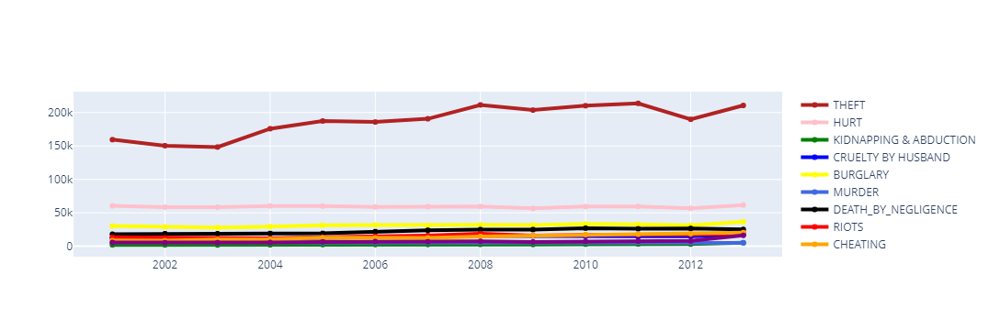

In [327]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_MH["YEAR"], y= DIST_MH['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_MH["YEAR"], y= DIST_MH['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_MH["YEAR"], y= DIST_MH['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_MH["YEAR"], y= DIST_MH["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_MH["YEAR"], y= DIST_MH['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_MH["YEAR"], y= DIST_MH['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_MH["YEAR"], y= DIST_MH['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_MH["YEAR"], y= DIST_MH['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_MH["YEAR"], y= DIST_MH['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_MH["YEAR"], y= DIST_MH['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [328]:
crimes_mh_df = crimes_MH[crimes_MH.DISTRICT!="TOTAL"]
crimes_mh_df = crimes_mh_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'HURT':sum, 'BURGLARY':sum}).reset_index()


In [329]:
mh_crimes = crimes_mh_df[(crimes_mh_df.TOTAL_THEFT>10000) & (crimes_mh_df.HURT>10000) & (crimes_mh_df.BURGLARY>5000)].reset_index()


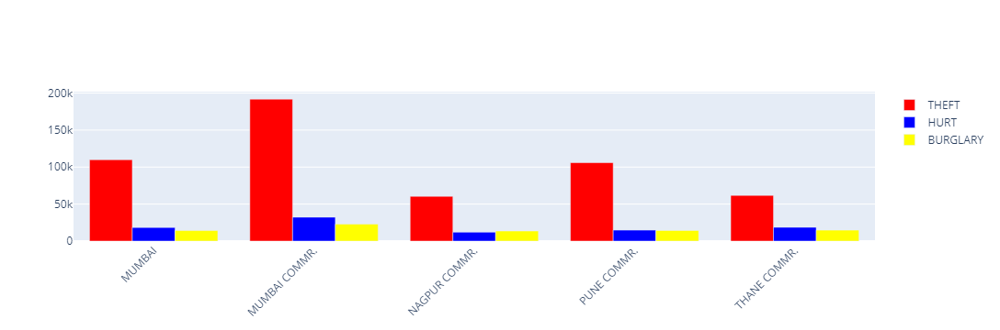

In [330]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=mh_crimes["DISTRICT"],
    y=mh_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=mh_crimes["DISTRICT"],
    y=mh_crimes["HURT"],
    name='HURT',
    marker_color='Blue'
))
fig.add_trace(go.Bar(
    x=mh_crimes["DISTRICT"],
    y=mh_crimes["BURGLARY"],
    name='BURGLARY',
    marker_color='yellow'
))
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [331]:
crimes_mh_clus = crimes_MH.copy()
crimes_mh_clus.columns

Index(['STATE', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL_BREACH_OF_TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT', 'DOWRY DEATHS',
       'ASSAULT_WOMEN_MODESTY', 'INSULT TO MODESTY OF WOMEN',
       'CRUELTY_BY_HUSBAND', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'DEATH_BY_NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL', 'TOTAL_THEFT'],
      dtype='object')

In [332]:
crimes_mh_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)

In [333]:
crimes_mh_main = crimes_mh_clus[crimes_mh_clus.DISTRICT!="TOTAL"]

In [334]:
crimes_KMe_mh = crimes_mh_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()

In [335]:
scaled = StandardScaler()
scaled_mh = scaled.fit_transform(crimes_KMe_mh[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

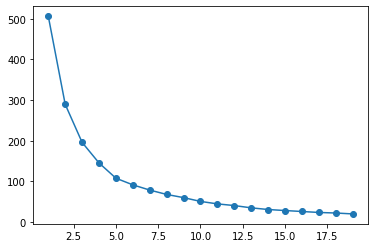

In [336]:
new_mh = range(1,20)
rate_mh = []
for i in new_mh:
    clustering = KMeans(i)
    clustering.fit(scaled_mh)
    rate_mh.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_mh, rate_mh, marker="o")

In [337]:
k = 4
mh_clus = KMeans(4, random_state=42)
mh_clus.fit(scaled_mh)
crimes_KMe_mh['cluster_id'] = mh_clus.labels_

In [338]:
crimes_KMe_mh[crimes_KMe_mh.cluster_id==0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
1,AKOLA,22986,10528,343,1889,3549,623,1632,1139,1665,1309,15989,0
3,AMRAVATI RURAL,23462,11736,331,1676,3516,829,2234,548,1338,1882,14122,0
4,AURANGABAD COMMR.,20384,5391,351,1692,3476,450,1843,1943,1959,717,9348,0
5,AURANGABAD RURAL,11172,9638,161,3204,2143,685,3149,631,2898,857,8525,0
6,BEED,15474,12467,490,3924,3920,911,3226,1123,4984,1225,9878,0
8,BULDHANA,18258,10314,290,2562,2723,689,2657,1059,2660,1627,13809,0
9,CHANDRAPUR,18170,8010,300,1797,3764,650,3010,784,1499,1425,15159,0
10,DHULE,9022,4752,149,2308,1859,585,3234,864,1891,419,9677,0
14,JALGAON,19094,9479,397,4698,3293,1080,4634,2724,3140,1471,16537,0
15,JALNA,10046,7468,213,3443,2479,651,1879,997,2325,819,8368,0


In [339]:
crimes_KMe_mh[crimes_KMe_mh.cluster_id==1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
19,MUMBAI COMMR.,191852,32275,1715,3338,22852,1712,5528,15711,2749,4363,54905,1


In [340]:
crimes_KMe_mh[crimes_KMe_mh.cluster_id==2]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
2,AMRAVATI COMMR.,20696,5265,252,947,3055,311,903,705,1067,584,10047,2
7,BHANDARA,12118,4674,166,838,2447,371,1764,488,828,703,10377,2
11,GADCHIROLI,3474,2973,122,524,1258,736,1012,162,333,548,4553,2
12,GONDIA,8492,4601,234,723,2452,463,1464,444,523,1059,7672,2
13,HINGOLI,4644,5588,142,1309,1192,457,1097,462,1468,520,5890,2
20,MUMBAI RLY.,46884,536,63,0,42,101,24,473,129,177,1219,2
22,NAGPUR RLY.,25056,306,24,5,22,85,26,66,132,87,1410,2
25,NANDURBAR,4476,3311,130,1071,950,453,1434,467,1189,391,4928,2
26,NASIK COMMR.,28886,3181,281,1683,5465,420,2511,1847,1588,494,10078,2
32,PUNE RLY.,7998,70,14,0,3,37,12,34,40,24,480,2


In [341]:
crimes_KMe_mh[crimes_KMe_mh.cluster_id==3]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
0,AHMEDNAGAR,32016,9156,595,5968,5800,1322,7591,2274,5326,1521,18565,3
18,MUMBAI,109872,18382,793,1195,14163,1254,3487,6694,944,1516,31636,3
21,NAGPUR COMMR.,60504,11935,764,2538,13573,1278,3427,3478,2762,1058,35124,3
31,PUNE COMMR.,105978,14758,1264,2837,14360,1446,6220,7591,6985,1364,32968,3
33,PUNE RURAL,32988,9121,592,2419,6712,1751,11862,2312,3933,1402,21052,3
41,THANE COMMR.,61770,18612,1348,3831,14732,1480,4038,8549,3766,2001,15128,3
42,THANE RURAL,23764,9981,594,1561,7853,1821,8002,2888,3675,1580,12805,3


In [342]:
#Crimes in Tamil Nadu
crimes_TN = crimes_df[crimes_df.STATE=='TAMIL NADU']

In [343]:
DIST_TN = crimes_TN[crimes_TN.DISTRICT=='TOTAL']

In [344]:
DIST_TN = crimes_TN.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()
    

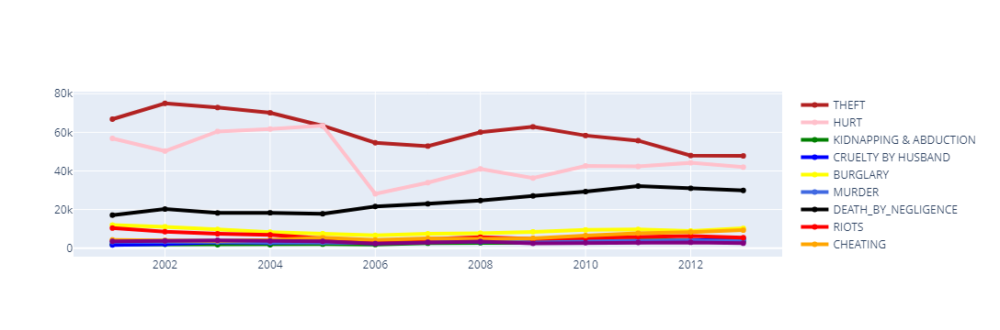

In [345]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_TN["YEAR"], y= DIST_TN['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_TN["YEAR"], y= DIST_TN['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_TN["YEAR"], y= DIST_TN['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_TN["YEAR"], y= DIST_TN["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_TN["YEAR"], y= DIST_TN['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_TN["YEAR"], y= DIST_TN['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_TN["YEAR"], y= DIST_TN['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_TN["YEAR"], y= DIST_TN['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_TN["YEAR"], y= DIST_TN['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_TN["YEAR"], y= DIST_TN['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [346]:
crimes_TN_df = crimes_TN[crimes_TN.DISTRICT!="TOTAL"]
crimes_TN_df = crimes_TN_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'HURT':sum, 'DEATH_BY_NEGLIGENCE': sum}).reset_index()


In [347]:
TN_crimes = crimes_TN_df[(crimes_TN_df.TOTAL_THEFT>10000) & (crimes_TN_df.HURT>5000) & (crimes_TN_df.DEATH_BY_NEGLIGENCE>5000)].reset_index()


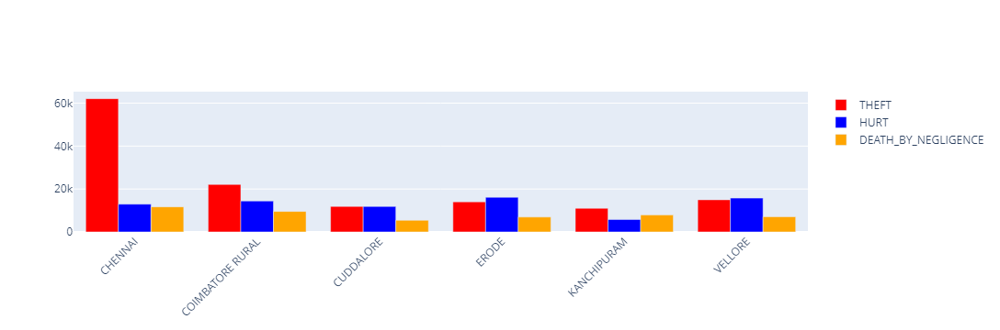

In [348]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=TN_crimes["DISTRICT"],
    y=TN_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=TN_crimes["DISTRICT"],
    y=TN_crimes["HURT"],
    name='HURT',
    marker_color='Blue'
))
fig.add_trace(go.Bar(
    x=TN_crimes["DISTRICT"],
    y=TN_crimes["DEATH_BY_NEGLIGENCE"],
    name='DEATH_BY_NEGLIGENCE',
    marker_color='Orange'
))
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [349]:
crimes_tn_clus = crimes_TN.copy()
crimes_tn_clus.columns

Index(['STATE', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL_BREACH_OF_TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT', 'DOWRY DEATHS',
       'ASSAULT_WOMEN_MODESTY', 'INSULT TO MODESTY OF WOMEN',
       'CRUELTY_BY_HUSBAND', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'DEATH_BY_NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL', 'TOTAL_THEFT'],
      dtype='object')

In [350]:
crimes_tn_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)

In [351]:
crimes_tn_main = crimes_tn_clus[crimes_tn_clus.DISTRICT!="TOTAL"]

In [352]:
crimes_KMe_tn = crimes_tn_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()

In [353]:
scaled = StandardScaler()
scaled_tn = scaled.fit_transform(crimes_KMe_tn[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

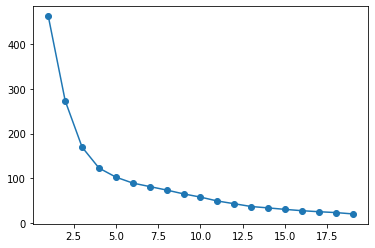

In [354]:
new_tn = range(1,20)
rate_tn = []
for i in new_tn:
    clustering = KMeans(i)
    clustering.fit(scaled_tn)
    rate_tn.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_tn, rate_tn, marker="o")

In [355]:
k = 3
tn_clus = KMeans(3, random_state=42)
tn_clus.fit(scaled_tn)
crimes_KMe_tn['cluster_id'] = tn_clus.labels_

In [356]:
crimes_KMe_tn[crimes_KMe_tn.cluster_id==0] 

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
5,COIMBATORE RURAL,22104,14376,554,1022,3021,866,9542,1236,2664,953,56311,0
7,CUDDALORE,11874,11841,690,536,1531,778,5394,324,2377,627,63060,0
8,DHARMAPURI,5812,12837,695,531,1146,709,3485,504,2436,801,24815,0
9,DINDIGUL,9866,6099,649,859,1322,785,5439,1070,823,501,41478,0
10,ERODE,14018,16141,539,453,1853,694,6922,1041,519,660,43216,0
11,KANCHIPURAM,11006,5756,208,199,1798,767,7869,529,1230,400,57732,0
15,MADURAI RURAL,9944,11862,681,1023,1824,771,5051,2038,2114,825,33652,0
23,SALEM RURAL,5970,23308,1054,1040,1147,860,5691,633,2677,1754,32648,0
26,THANJAVUR,14752,9970,598,337,2276,782,4668,559,1421,999,40653,0
28,THIRUNELVELI RURAL,10950,12770,724,1422,2410,1039,4135,1707,138,1304,58119,0


In [357]:
crimes_KMe_tn[crimes_KMe_tn.cluster_id==1] 

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
0,ARIYALUR,1228,1839,155,61,234,156,675,72,284,264,7433,1
1,CHENGAI,8602,3442,114,319,1855,308,2303,464,417,329,28662,1
3,CHENNAI RLY.,5066,375,8,9,20,29,53,65,121,47,3111,1
4,CHENNAISUBURBAN,4304,1874,87,157,903,232,1759,524,213,154,10410,1
6,COIMBATORE URBAN,22382,2813,181,618,1895,287,3232,1414,807,260,46025,1
12,KANYAKUMARI,7746,7809,348,837,2269,462,3403,1270,38,244,30556,1
13,KARUR,5880,3096,295,220,575,303,3082,214,292,183,20369,1
14,KRISHNAGIRI,5490,6623,447,294,936,587,4138,574,1533,381,26668,1
16,MADURAI URBAN,13320,2177,351,678,1213,386,1521,2317,590,260,21487,1
17,NAGAPATTINAM,6286,10093,378,173,906,572,2327,346,594,638,30468,1


In [358]:
crimes_KMe_tn[crimes_KMe_tn.cluster_id==2] 

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,cluster_id
2,CHENNAI,62086,12912,687,2433,7010,1566,11674,6923,1093,904,97536,2


In [359]:
#Crimes in Bihar
crimes_BI = crimes_df[crimes_df.STATE=='BIHAR']
crimes_BI.shape

(585, 34)

In [360]:
DIST_BI = crimes_BI[crimes_BI.DISTRICT=='TOTAL']

In [361]:
DIST_BI = crimes_BI.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()
                                           
    

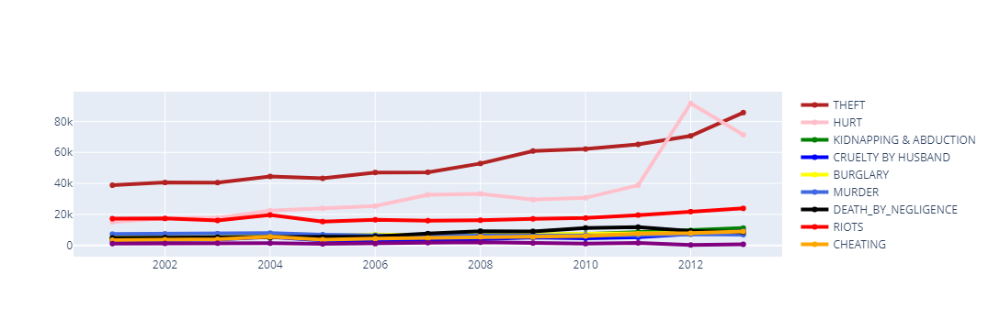

In [362]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_BI["YEAR"], y= DIST_BI['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_BI["YEAR"], y= DIST_BI['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_BI["YEAR"], y= DIST_BI['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_BI["YEAR"], y= DIST_BI["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_BI["YEAR"], y= DIST_BI['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_BI["YEAR"], y= DIST_BI['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_BI["YEAR"], y= DIST_BI['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_BI["YEAR"], y= DIST_BI['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_BI["YEAR"], y= DIST_BI['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_BI["YEAR"], y= DIST_BI['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [363]:
crimes_BI_df = crimes_BI[crimes_BI.DISTRICT!="TOTAL"]
crimes_BI_df = crimes_BI_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'HURT':sum, 'RIOTS':sum}).reset_index()


In [364]:
BI_crimes = crimes_BI_df[(crimes_BI_df.TOTAL_THEFT>10000) & (crimes_BI_df.RIOTS>1000) & (crimes_BI_df.HURT>5000)].reset_index()


In [365]:
BI_crimes

,index,DISTRICT,TOTAL_THEFT,HURT,RIOTS
0,12,GAYA,14802,7274,4884
1,24,MOTIHARI,11504,13071,6162
2,26,MUZAFFARPUR,24762,9033,5637
3,31,PATNA,56512,9059,6565
4,34,ROHTAS,11090,6355,2984
5,37,SARAN,10890,14465,3942
6,43,VAISHALI,12922,5426,3860


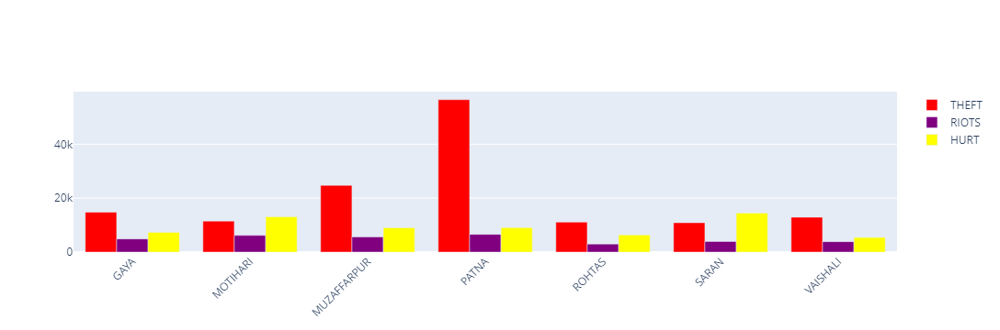

In [366]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=BI_crimes["DISTRICT"],
    y=BI_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=BI_crimes["DISTRICT"],
    y=BI_crimes["RIOTS"],
    name='RIOTS',
    marker_color='Purple'
))
fig.add_trace(go.Bar(
    x=BI_crimes["DISTRICT"],
    y=BI_crimes["HURT"],
    name='HURT',
    marker_color='yellow'
))
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [367]:
crimes_BI_clus = crimes_BI.copy()
crimes_BI_clus.columns

Index(['STATE', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL_BREACH_OF_TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT', 'DOWRY DEATHS',
       'ASSAULT_WOMEN_MODESTY', 'INSULT TO MODESTY OF WOMEN',
       'CRUELTY_BY_HUSBAND', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'DEATH_BY_NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL', 'TOTAL_THEFT'],
      dtype='object')

In [368]:
crimes_BI_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)

In [369]:
crimes_BI_main = crimes_BI_clus[crimes_BI_clus.DISTRICT!="TOTAL"]

In [370]:
crimes_KMe_BI = crimes_BI_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()

In [371]:
scaled = StandardScaler()
scaled_BI = scaled.fit_transform(crimes_KMe_BI[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

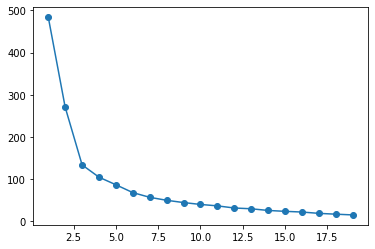

In [372]:
new_BI = range(1,20)
rate_BI = []
for i in new_tn:
    clustering = KMeans(i)
    clustering.fit(scaled_BI)
    rate_BI.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_BI, rate_BI, marker="o")

In [373]:
cluster_bi = KMeans(3, random_state = 42)
cluster_bi.fit(scaled_BI)
crimes_KMe_BI["clu_Id"] = cluster_bi.labels_

In [374]:
crimes_KMe_BI[crimes_KMe_BI.clu_Id==0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,clu_Id
0,ARARIA,5346,1947,1015,499,642,756,536,514,3539,161,15549,0
1,ARWAL,1450,1333,182,129,215,350,303,148,560,67,3587,0
3,BAGAHA,3466,3376,787,224,390,493,306,475,1393,165,7913,0
4,BANKA,3080,2676,601,322,836,958,467,267,2446,53,8934,0
7,BHABHUA,4870,3334,547,295,842,685,748,404,1953,74,7754,0
10,BUXAR,6654,4336,648,571,949,736,889,656,2493,198,7117,0
14,JAMALPUR RLY.,3614,78,41,3,12,90,5,34,62,14,718,0
15,JAMUI,3056,5279,581,554,596,880,662,461,2033,191,4754,0
16,JEHANABAD,3784,2205,446,319,539,666,462,408,1551,79,9241,0
18,KATIHAR RLY.,5604,204,81,13,95,134,17,128,115,32,1503,0


In [375]:
crimes_KMe_BI[crimes_KMe_BI.clu_Id==1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,clu_Id
2,AURANGABAD,6698,8513,570,762,1272,1075,1159,868,3427,156,11436,1
5,BEGUSARAI,8600,5523,1284,633,937,1516,2199,874,3255,194,18232,1
6,BETTIAH,8918,14439,1408,862,1131,982,1004,1117,4697,212,13658,1
8,BHAGALPUR,11424,4213,1269,964,1744,1292,1204,992,2964,237,17931,1
9,BHOJPUR,8522,10045,775,1302,1331,1517,1618,1057,2442,211,16795,1
11,DARBHANGA,7940,4085,1331,1991,958,844,1437,1776,4219,551,24761,1
12,GAYA,14802,7274,1271,801,1947,2230,2599,1189,4884,209,20545,1
13,GOPALGANJ,4986,6003,1054,1312,891,1004,1132,1092,2969,134,14039,1
17,KATIHAR,5552,7105,1307,639,686,961,983,838,2493,132,12243,1
23,MADHUBANI,7202,10842,1234,1326,1187,885,1161,433,4163,733,18033,1


In [376]:
crimes_KMe_BI[crimes_KMe_BI.clu_Id==2]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,clu_Id
31,PATNA,56512,9059,4046,3297,7446,4872,5115,5837,6565,304,78268,2


In [377]:
#Crimes in Madhya Pradesh
crimes_MP = crimes_df[crimes_df.STATE=='MADHYA PRADESH']

In [378]:
DIST_MP = crimes_MP[crimes_MP.DISTRICT=='TOTAL']

In [379]:
DIST_MP = crimes_MP.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()
    

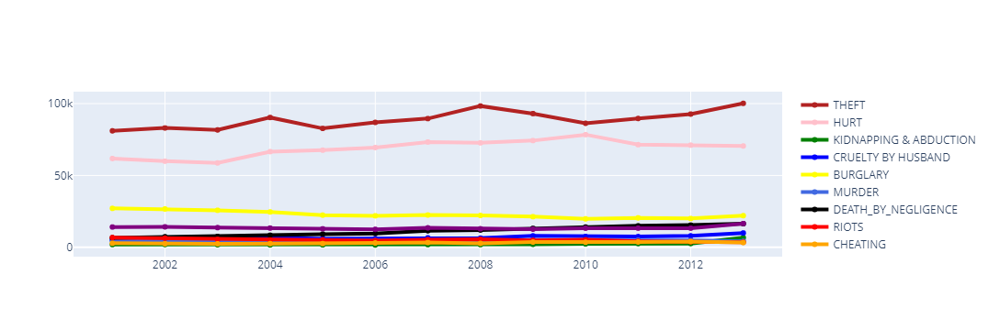

In [380]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_MP["YEAR"], y= DIST_MP['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_MP["YEAR"], y= DIST_MP['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_MP["YEAR"], y= DIST_MP['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_MP["YEAR"], y= DIST_MP["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_MP["YEAR"], y= DIST_MP['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_MP["YEAR"], y= DIST_MP['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_MP["YEAR"], y= DIST_MP['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_MP["YEAR"], y= DIST_MP['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_MP["YEAR"], y= DIST_MP['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_MP["YEAR"], y= DIST_MP['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [381]:
crimes_MP_df = crimes_MP[crimes_MP.DISTRICT!="TOTAL"]
crimes_MP_df = crimes_MP_df.groupby('DISTRICT').agg({"THEFT":sum, 'BURGLARY':sum, 'HURT':sum}).reset_index()


In [382]:
MP_crimes = crimes_MP_df[(crimes_MP_df.THEFT>10000) & (crimes_MP_df.BURGLARY>5000) & (crimes_MP_df.HURT>5000)].reset_index()
MP_crimes

,index,DISTRICT,THEFT,BURGLARY,HURT
0,8,BHOPAL,27545,12144,13061
1,19,GWALIOR,20363,12015,13525
2,22,INDORE,46788,13184,21653
3,24,JABALPUR,12275,6544,38630
4,51,UJJAIN,15141,6307,10461


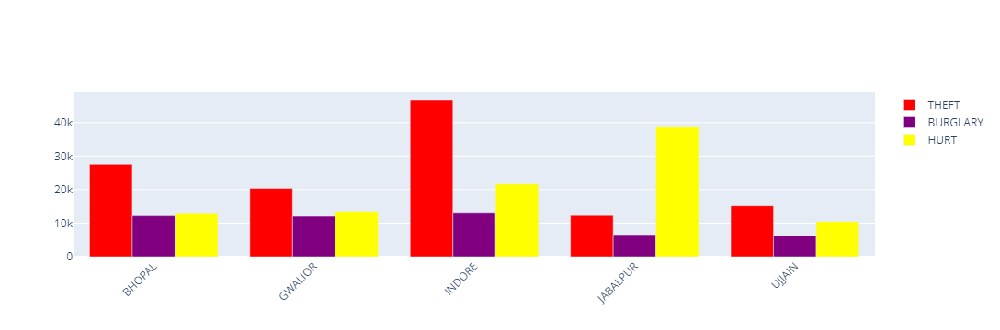

In [383]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=MP_crimes["DISTRICT"],
    y=MP_crimes["THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=MP_crimes["DISTRICT"],
    y=MP_crimes["BURGLARY"],
    name='BURGLARY',
    marker_color='Purple'
))
fig.add_trace(go.Bar(
    x=MP_crimes["DISTRICT"],
    y=MP_crimes["HURT"],
    name='HURT',
    marker_color='YELLOW'
))

fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [384]:
crimes_MP_clus = crimes_MP.copy()
crimes_MP_clus.columns

Index(['STATE', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL_BREACH_OF_TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT', 'DOWRY DEATHS',
       'ASSAULT_WOMEN_MODESTY', 'INSULT TO MODESTY OF WOMEN',
       'CRUELTY_BY_HUSBAND', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'DEATH_BY_NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL', 'TOTAL_THEFT'],
      dtype='object')

In [385]:
crimes_MP_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)

In [386]:
crimes_MP_main = crimes_MP_clus[crimes_MP_clus.DISTRICT!="TOTAL"]

In [387]:
crimes_KMe_MP = crimes_MP_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()

In [388]:
scaled = StandardScaler()
scaled_MP = scaled.fit_transform(crimes_KMe_MP[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

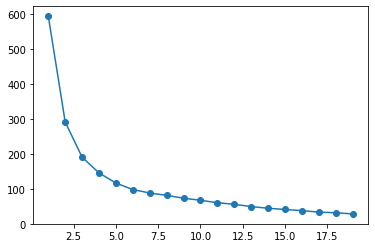

In [389]:
new_MP = range(1,20)
rate_MP = []
for i in new_MP:
    clustering = KMeans(i)
    clustering.fit(scaled_MP)
    rate_MP.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_MP, rate_MP, marker="o")

In [390]:
cluster_mp = KMeans(4, random_state = 42)
cluster_mp.fit(scaled_MP)
crimes_KMe_MP["clu_Id"] = cluster_mp.labels_

In [391]:
crimes_KMe_MP[crimes_KMe_MP.clu_Id==0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,clu_Id
8,BHOPAL,55090,13061,717,2311,12144,876,3584,2045,1267,2805,110761,0
19,GWALIOR,40726,13525,900,2298,12015,1236,3034,1485,1873,2336,55865,0
22,INDORE,93576,21653,1023,4268,13184,1445,5201,1931,1700,3904,116653,0


In [392]:
crimes_KMe_MP[crimes_KMe_MP.clu_Id==1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,clu_Id
0,AGAR,152,281,18,30,33,19,63,14,17,41,552,1
1,ALIRAJPUR,846,1634,81,47,222,367,432,24,101,150,3586,1
2,ANUPPUR,2238,2272,93,435,1069,308,299,164,155,772,8007,1
3,ASHOK NAGAR,2850,9018,93,379,1082,314,646,120,326,1232,9445,1
5,BARWANI,4910,4009,107,220,1130,518,1583,116,385,1046,14374,1
9,BHOPAL RLY.,27878,72,22,13,130,57,22,72,57,152,3469,1
10,BURHANPUR,2362,1855,45,257,488,161,445,105,184,570,8115,1
17,DINDORI,806,1464,47,248,501,265,503,117,99,807,7248,1
20,HARDA,2792,4528,96,206,852,223,235,87,184,568,5648,1
23,INDORE RLY.,5112,86,13,2,26,37,0,23,15,61,1190,1


In [393]:
crimes_KMe_MP[crimes_KMe_MP.clu_Id==2]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,clu_Id
4,BALAGHAT,4086,5009,103,709,1781,725,1061,199,493,1688,19249,2
6,BETUL,5404,5082,336,830,1985,798,1527,288,153,2087,21827,2
7,BHIND,6518,11981,346,680,2147,896,1747,382,1030,987,20235,2
11,CHHATARPUR,5926,6919,343,826,3740,763,1489,389,797,2386,32040,2
12,CHHINDWARA,6690,17350,405,1489,2351,924,2129,495,684,2578,22547,2
13,DAMOH,3864,15398,216,887,1737,604,827,198,249,2012,11123,2
14,DATIYA,3746,5174,250,373,1264,642,909,187,363,851,15957,2
15,DEWAS,18014,5562,330,1847,3265,622,2122,529,1066,2364,45492,2
16,DHAR,13918,7831,578,1038,2938,1017,2618,399,990,2363,37990,2
18,GUNA,7336,12670,174,668,2689,594,1832,285,1042,2314,21659,2


In [394]:
crimes_KMe_MP[crimes_KMe_MP.clu_Id==3]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,clu_Id
24,JABALPUR,24550,38630,658,2020,6544,1084,2752,1475,1194,3389,53646,3
40,SAGAR,13050,33627,580,1863,5192,1009,2233,481,1350,5025,40127,3
51,UJJAIN,30282,10461,500,2241,6307,850,1773,866,1441,2360,58342,3


In [395]:
crimes_ANP = crimes_df[crimes_df.STATE=='ANDHRA PRADESH']
crimes_ANP.shape

(404, 34)

In [396]:
DIST_ANP = crimes_ANP[crimes_ANP.DISTRICT=='TOTAL']

In [397]:
DIST_ANP = crimes_ANP.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()

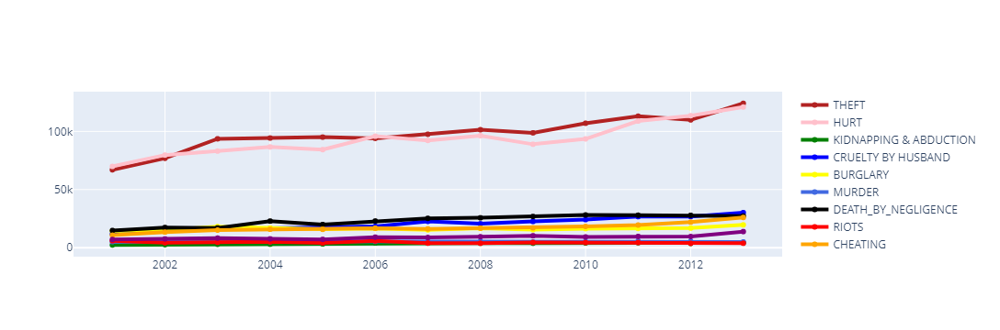

In [398]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_ANP["YEAR"], y= DIST_ANP['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_ANP["YEAR"], y= DIST_ANP['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_ANP["YEAR"], y= DIST_ANP['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_ANP["YEAR"], y= DIST_ANP["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_ANP["YEAR"], y= DIST_ANP['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_ANP["YEAR"], y= DIST_ANP['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_ANP["YEAR"], y= DIST_ANP['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_ANP["YEAR"], y= DIST_ANP['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_ANP["YEAR"], y= DIST_ANP['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_ANP["YEAR"], y= DIST_ANP['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [399]:
crimes_ANP_df = crimes_ANP[crimes_ANP.DISTRICT!="TOTAL"]
crimes_ANP_df = crimes_ANP_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'HURT':sum}).reset_index()


In [400]:
ANP_crimes = crimes_ANP_df[(crimes_ANP_df.TOTAL_THEFT>10000) & (crimes_ANP_df.HURT>10000)].reset_index()
ANP_crimes

,index,DISTRICT,TOTAL_THEFT,HURT
0,1,ANANTAPUR,13352,20219
1,2,CHITTOOR,23178,14480
2,3,CUDDAPAH,10464,16611
3,4,CYBERABAD,68888,36981
4,5,EAST GODAVARI,28642,33814
5,7,GUNTUR,27680,24554
6,9,HYDERABAD CITY,120666,50435
7,10,KARIMNAGAR,16718,33927
8,11,KHAMMAM,13786,20379
9,12,KRISHNA,15162,30094


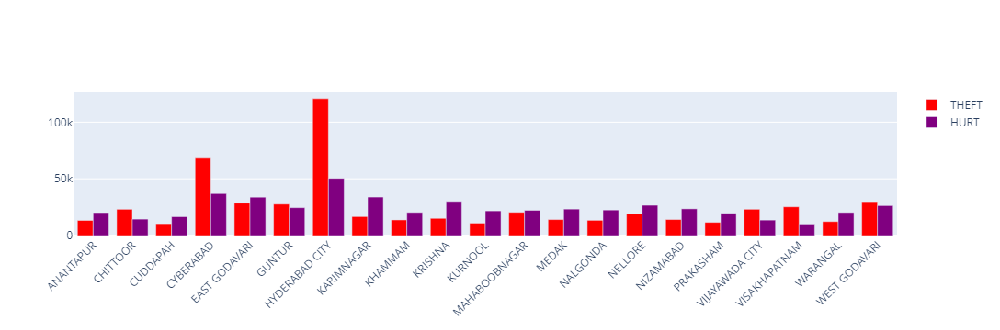

In [515]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=ANP_crimes["DISTRICT"],
    y=ANP_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=ANP_crimes["DISTRICT"],
    y=ANP_crimes["HURT"],
    name='HURT',
    marker_color='Purple'
))

fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [402]:
crimes_ANP_clus = crimes_ANP.copy()


In [403]:
crimes_ANP_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)

In [404]:
crimes_ANP_main = crimes_ANP_clus[crimes_ANP_clus.DISTRICT!="TOTAL"]

In [405]:
crimes_KMe_ANP = crimes_ANP_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()

In [406]:
scaled = StandardScaler()
scaled_ANP = scaled.fit_transform(crimes_KMe_ANP[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

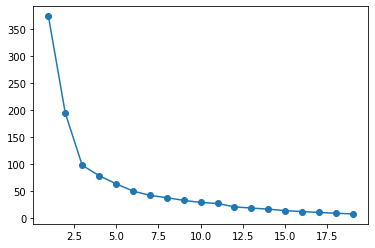

In [407]:
new_ANP = range(1,20)
rate_ANP = []
for i in new_MP:
    clustering = KMeans(i)
    clustering.fit(scaled_ANP)
    rate_ANP.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_ANP, rate_ANP, marker="o")

In [408]:
cluster_anp = KMeans(3, random_state = 42)
cluster_anp.fit(scaled_ANP)
crimes_KMe_ANP["clu_Id"] = cluster_anp.labels_

In [409]:
crimes_KMe_ANP[crimes_KMe_ANP.clu_Id==0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,clu_Id
6,GUNTAKAL RLY.,4684,86,10,11,0,77,32,22,4,22,778,0
8,GUNTUR URBAN,6976,3578,146,1653,606,194,916,1175,34,342,3692,0
20,RAJAHMUNDRY,2818,2861,90,677,514,79,620,292,24,207,1206,0
21,RANGA REDDY,8866,14518,475,2169,3362,1171,3152,1796,410,810,8293,0
22,SECUNDERABAD RLY.,11112,148,11,5,6,111,35,63,16,31,750,0
23,SRIKAKULAM,5774,14173,243,2968,1627,440,3484,1035,491,1100,14513,0
24,TIRUPATHI URBAN,5864,2642,94,426,677,138,849,764,106,144,1842,0
25,VIJAYAWADA,24556,9360,374,3571,3101,213,1212,3188,62,569,3678,0
26,VIJAYAWADA CITY,23196,13642,557,5750,1986,283,2463,3084,61,1439,6391,0
27,VIJAYAWADA RLY.,9704,157,10,10,2,38,41,46,15,41,511,0


In [410]:
crimes_KMe_ANP[crimes_KMe_ANP.clu_Id==1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,clu_Id
0,ADILABAD,8682,18786,819,4590,2793,1282,3969,2186,1074,1982,21969,1
1,ANANTAPUR,13352,20219,949,1806,2815,2078,5631,1605,1349,2363,17495,1
2,CHITTOOR,23178,14480,959,3718,2934,1342,8714,2932,1030,1500,26814,1
3,CUDDAPAH,10464,16611,737,1997,1769,1289,5279,2211,1482,2026,23734,1
5,EAST GODAVARI,28642,33814,843,5410,5395,1109,7180,3495,818,2272,19195,1
7,GUNTUR,27680,24554,1030,6400,3701,1885,6559,4543,1245,3177,30501,1
10,KARIMNAGAR,16718,33927,1652,7974,3607,1775,6009,6345,2107,4187,22139,1
11,KHAMMAM,13786,20379,1033,4858,3172,1440,5463,2777,1802,2501,23102,1
12,KRISHNA,15162,30094,704,5724,2708,898,4464,2101,483,3252,11943,1
13,KURNOOL,10972,21759,857,3205,2746,1656,5957,3404,1468,3878,25263,1


In [411]:
crimes_KMe_ANP[crimes_KMe_ANP.clu_Id==2]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,clu_Id
4,CYBERABAD,68888,36981,1590,10458,13264,1972,11418,13534,593,1722,26840,2
9,HYDERABAD CITY,120666,50435,1597,15535,14093,1575,6493,24886,2550,2313,31304,2


In [412]:
crimes_KER = crimes_df[crimes_df.STATE=='KERALA']
crimes_KER.shape

(254, 34)

In [413]:
crimes_KER.columns

Index(['STATE', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL_BREACH_OF_TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT', 'DOWRY DEATHS',
       'ASSAULT_WOMEN_MODESTY', 'INSULT TO MODESTY OF WOMEN',
       'CRUELTY_BY_HUSBAND', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'DEATH_BY_NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL', 'TOTAL_THEFT'],
      dtype='object')

In [414]:
DIST_KER = crimes_KER[crimes_KER.DISTRICT=='TOTAL']

In [415]:
DIST_KER= crimes_KER.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()

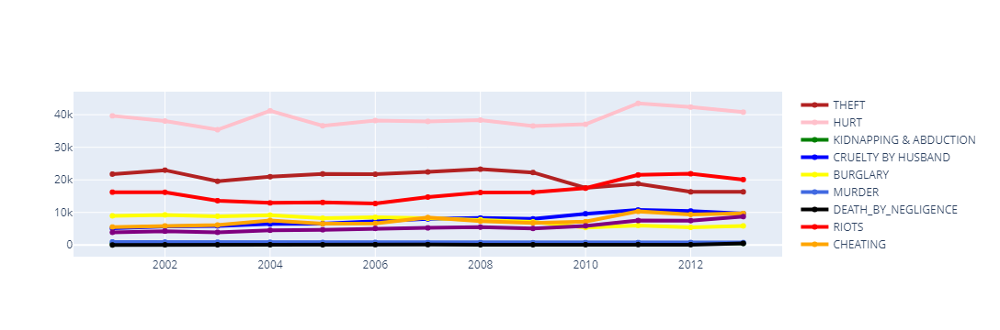

In [416]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_KER["YEAR"], y= DIST_KER['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_KER["YEAR"], y= DIST_KER['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_KER["YEAR"], y= DIST_KER['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_KER["YEAR"], y= DIST_KER["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_KER["YEAR"], y= DIST_KER['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_KER["YEAR"], y= DIST_KER['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_KER["YEAR"], y= DIST_KER['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_KER["YEAR"], y= DIST_KER['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_KER["YEAR"], y= DIST_KER['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_KER["YEAR"], y= DIST_KER['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [417]:
crimes_KER_df = crimes_KER[crimes_KER.DISTRICT!="TOTAL"]
crimes_KER_df = crimes_KER_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'HURT':sum, 'RIOTS':sum}).reset_index()
crimes_KER_df

,DISTRICT,TOTAL_THEFT,HURT,RIOTS
0,ALAPUZHA,6492,17252,5629
1,CBCID,90,19,52
2,ERNAKULAM,4846,3509,1312
3,ERNAKULAM COMMR.,7758,5299,2641
4,ERNAKULAM RURAL,7558,10419,4015
5,IDUKKI,5114,17398,3290
6,KANNUR,5146,14928,10570
7,KASARGOD,4002,10130,6342
8,KOLLAM,8070,22084,6415
9,KOLLAM COMMR.,1178,3110,1206


In [418]:
KER_crimes = crimes_KER_df[(crimes_KER_df.TOTAL_THEFT>2000) & (crimes_KER_df.HURT>10000) & (crimes_KER_df.RIOTS>2000)].reset_index()

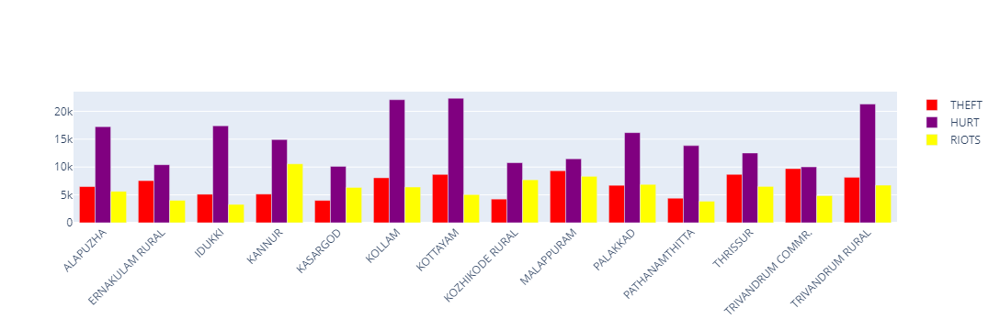

In [419]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=KER_crimes["DISTRICT"],
    y=KER_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=KER_crimes["DISTRICT"],
    y=KER_crimes["HURT"],
    name='HURT',
    marker_color='Purple'
))
fig.add_trace(go.Bar(
    x=KER_crimes["DISTRICT"],
    y=KER_crimes["RIOTS"],
    name='RIOTS',
    marker_color='YEllow'
))


fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [420]:
crimes_KER_clus = crimes_KER.copy()


In [421]:
crimes_KER_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)

In [422]:
crimes_KER_main = crimes_KER_clus[crimes_KER_clus.DISTRICT!="TOTAL"]

In [423]:
crimes_KMe_KER = crimes_KER_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()

In [424]:
scaled = StandardScaler()
scaled_KER = scaled.fit_transform(crimes_KMe_KER[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

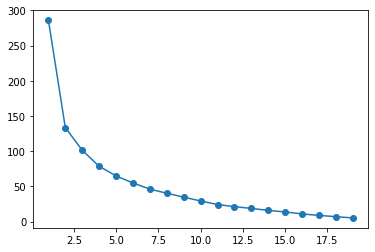

In [425]:
new_KER = range(1,20)
rate_KER = []
for i in new_MP:
    clustering = KMeans(i)
    clustering.fit(scaled_KER)
    rate_KER.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_KER, rate_KER, marker="o")

In [426]:
K=4
cluster_ker = KMeans(4, random_state = 42)
cluster_ker.fit(scaled_KER)
crimes_KMe_KER['Cluster_id'] = cluster_ker.labels_

In [427]:
crimes_KMe_KER[crimes_KMe_KER.Cluster_id==0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
9,KOLLAM COMMR.,1178,3110,60,959,354,51,205,334,1206,561,13065,0


In [428]:
crimes_KMe_KER[crimes_KMe_KER.Cluster_id==1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
1,CBCID,90,19,8,21,47,110,7,217,52,0,185,1
2,ERNAKULAM,4846,3509,32,340,1241,80,5,588,1312,332,20029,1
10,KOLLAM RURAL,1030,4157,39,878,443,78,17,423,1444,798,10443,1
12,KOZHIKODE,1994,2184,17,662,927,55,6,685,2100,253,8425,1
18,RAILWAYS,4938,293,8,0,26,12,1,22,112,154,350,1
20,THRISSUR COMMR.,930,1010,27,402,205,36,10,1397,1189,296,12173,1
21,THRISSUR RURAL,1264,2473,37,1197,437,55,15,1169,1697,739,32906,1
22,TRIVANDRUM,2978,4986,77,524,1314,111,0,791,1856,749,11284,1
25,WAYANADU,3004,9104,69,1233,1350,160,26,1321,2751,856,13809,1


In [429]:
crimes_KMe_KER[crimes_KMe_KER.Cluster_id==2]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
0,ALAPUZHA,6492,17252,199,3007,2567,269,22,2733,5629,2479,65449,2
6,KANNUR,5146,14928,166,3377,2892,283,51,1868,10570,1591,37069,2
8,KOLLAM,8070,22084,238,4043,3284,381,28,1679,6415,3035,49595,2
11,KOTTAYAM,8668,22353,216,2386,3766,282,21,3992,5057,2561,62560,2
15,MALAPPURAM,9330,11480,181,6973,3904,280,20,3888,8333,1957,71637,2
16,PALAKKAD,6720,16177,159,4026,3042,514,63,2656,6879,1473,50963,2
19,THRISSUR,8690,12523,191,2836,2752,388,73,4059,6521,1905,62982,2
24,TRIVANDRUM RURAL,8162,21311,323,3446,3762,378,22,2694,6748,4526,47404,2


In [430]:
crimes_KMe_KER[crimes_KMe_KER.Cluster_id==3]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
3,ERNAKULAM COMMR.,7758,5299,114,1185,1777,143,17,3683,2641,915,97119,3
4,ERNAKULAM RURAL,7558,10419,132,1650,2360,289,28,2256,4015,1507,108451,3
5,IDUKKI,5114,17398,89,2076,2155,320,7,1460,3290,1886,34987,3
7,KASARGOD,4002,10130,134,2007,1885,211,26,2161,6342,1107,18589,3
13,KOZHIKODE COMMR.,6534,6012,115,1656,2356,92,10,1822,3733,831,22273,3
14,KOZHIKODE RURAL,4248,10776,160,2954,1894,118,27,1736,7705,1522,28441,3
17,PATHANAMTHITTA,4406,13843,132,1725,2045,278,13,1499,3856,1836,34490,3
23,TRIVANDRUM COMMR.,9714,10020,220,1331,2515,131,18,3466,4863,1983,34833,3


In [431]:
crimes_GUJ = crimes_df[crimes_df.STATE=='GUJARAT']
crimes_GUJ.shape

(419, 34)

In [432]:
DIST_GUJ = crimes_GUJ[crimes_GUJ.DISTRICT=='TOTAL']
DIST_GUJ= crimes_GUJ.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()

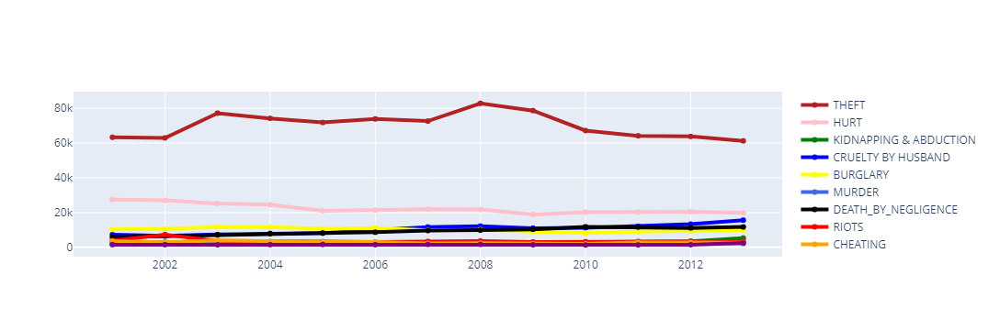

In [433]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_GUJ["YEAR"], y= DIST_GUJ['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_GUJ["YEAR"], y= DIST_GUJ['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_GUJ["YEAR"], y= DIST_GUJ['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_GUJ["YEAR"], y= DIST_GUJ["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_GUJ["YEAR"], y= DIST_GUJ['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_GUJ["YEAR"], y= DIST_GUJ['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_GUJ["YEAR"], y= DIST_GUJ['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_GUJ["YEAR"], y= DIST_GUJ['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_GUJ["YEAR"], y= DIST_GUJ['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_GUJ["YEAR"], y= DIST_GUJ['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [434]:
crimes_GUJ_df = crimes_GUJ[crimes_GUJ.DISTRICT!="TOTAL"]
crimes_GUJ_df = crimes_GUJ_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'HURT':sum}).reset_index()
crimes_GUJ_df

,DISTRICT,TOTAL_THEFT,HURT
0,AHMEDABAD COMMR.,122208,17781
1,AHMEDABAD RURAL,7622,4361
2,AHWA-DANG,228,278
3,AMRELI,4414,3774
4,ANAND,10194,4927
5,BHARUCH,9204,3932
6,BHAVNAGAR,18062,3175
7,CID CRIME,4,0
8,DAHOD,4168,4402
9,GANDHINAGAR,12556,3387


In [435]:
GUJ_crimes = crimes_GUJ_df[(crimes_GUJ_df.TOTAL_THEFT>2000) & (crimes_GUJ_df.HURT>5000)].reset_index()

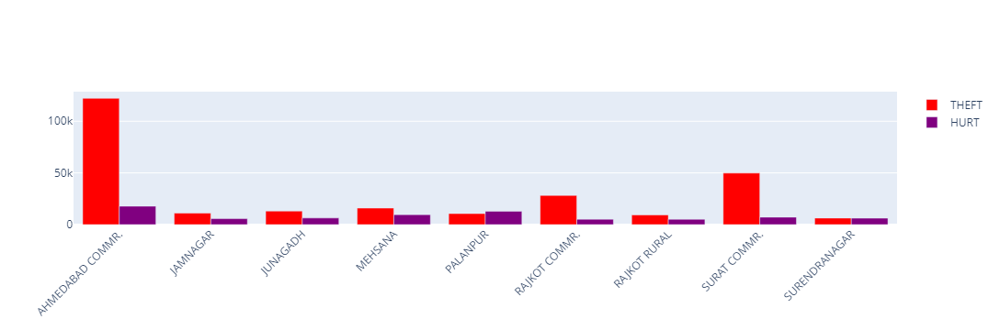

In [436]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=GUJ_crimes["DISTRICT"],
    y=GUJ_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=GUJ_crimes["DISTRICT"],
    y=GUJ_crimes["HURT"],
    name='HURT',
    marker_color='Purple'
))



fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [437]:
crimes_GUJ_clus = crimes_GUJ.copy()

In [438]:
crimes_GUJ_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)

In [439]:
crimes_GUJ_main = crimes_GUJ_clus[crimes_GUJ_clus.DISTRICT!="TOTAL"]

In [440]:
crimes_KMe_Guj = crimes_GUJ_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()

In [441]:
scaled = StandardScaler()
scaled_GUJ = scaled.fit_transform(crimes_KMe_Guj[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

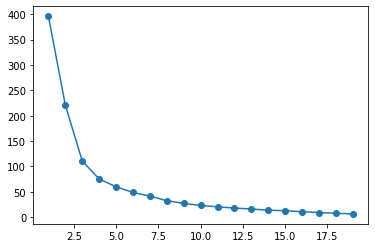

In [442]:
new_Guj = range(1,20)
rate_Guj = []
for i in new_MP:
    clustering = KMeans(i)
    clustering.fit(scaled_GUJ)
    rate_Guj.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_Guj, rate_Guj, marker="o")

In [443]:
K=4
cluster_guj = KMeans(4, random_state = 42)
cluster_guj.fit(scaled_GUJ)
crimes_KMe_Guj['Cluster_id'] = cluster_guj.labels_

In [444]:
crimes_KMe_Guj[crimes_KMe_Guj.Cluster_id==0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
6,BHAVNAGAR,18062,3175,1094,2451,3397,680,46,1092,1821,701,43063,0
12,JUNAGADH,13040,6369,747,5354,2623,572,2612,724,1199,571,33104,0
17,MEHSANA,15962,9630,800,2958,2741,401,2295,745,1166,390,33921,0
20,PALANPUR,10596,12847,838,2851,2728,547,2552,597,937,694,25278,0
26,SURAT COMMR.,49820,7174,1459,3400,5103,1207,4057,2533,1266,471,54611,0
30,VADODARA COMMR.,34658,4180,592,2656,4775,375,1839,2167,1899,276,41649,0


In [445]:
crimes_KMe_Guj[crimes_KMe_Guj.Cluster_id==1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
2,AHWA-DANG,228,278,12,91,60,84,252,23,54,36,1366,1
7,CID CRIME,4,0,1,0,0,5,0,24,0,0,7,1
15,KUTCH (EAST(G)),1670,823,100,574,406,85,14,87,99,59,5130,1
16,KUTCH (WEST-BHUJ),1264,551,68,435,293,68,10,31,156,61,3317,1
18,NARMADA,882,1317,84,117,228,187,752,72,158,78,5459,1
19,NAVSARI,3462,1056,155,469,912,279,0,157,193,58,10569,1
23,PORBANDAR,1928,1321,130,748,498,133,592,167,138,74,7438,1
29,TAPI,840,580,30,68,126,96,700,32,43,34,1963,1
33,W.RLY,17524,498,41,34,184,133,41,224,92,64,2659,1
34,W.RLY AHMEDABAD,1380,91,11,7,23,21,3,18,15,10,129,1


In [446]:
crimes_KMe_Guj[crimes_KMe_Guj.Cluster_id==2]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
0,AHMEDABAD COMMR.,122208,17781,2759,13426,10066,1300,2352,3428,2585,1000,111782,2


In [447]:
crimes_KMe_Guj[crimes_KMe_Guj.Cluster_id==3]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
1,AHMEDABAD RURAL,7622,4361,533,1384,1412,452,3870,187,757,286,22867,3
3,AMRELI,4414,3774,649,1671,1383,325,1381,155,549,288,16424,3
4,ANAND,10194,4927,577,2184,1709,368,2812,383,582,320,23460,3
5,BHARUCH,9204,3932,346,708,1740,488,3367,257,581,244,18899,3
8,DAHOD,4168,4402,499,329,1189,527,742,71,652,261,9439,3
9,GANDHINAGAR,12556,3387,386,1852,1736,313,2364,542,601,231,37159,3
10,HIMATNAGAR,5880,3319,567,2609,1850,518,3179,526,710,469,48206,3
11,JAMNAGAR,11080,5684,441,3286,2356,509,28,367,851,286,36577,3
13,KHEDA NORTH,8090,4532,558,1965,1461,500,3055,524,710,382,38958,3
14,KUTCH,8438,4110,378,2367,2337,362,2351,477,610,276,23964,3


In [448]:
crimes_AS = crimes_df[crimes_df.STATE=='ASSAM']
crimes_AS.shape

(396, 34)

In [449]:
DIST_AS = crimes_AS[crimes_AS.DISTRICT=='TOTAL']
DIST_AS = crimes_AS.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()


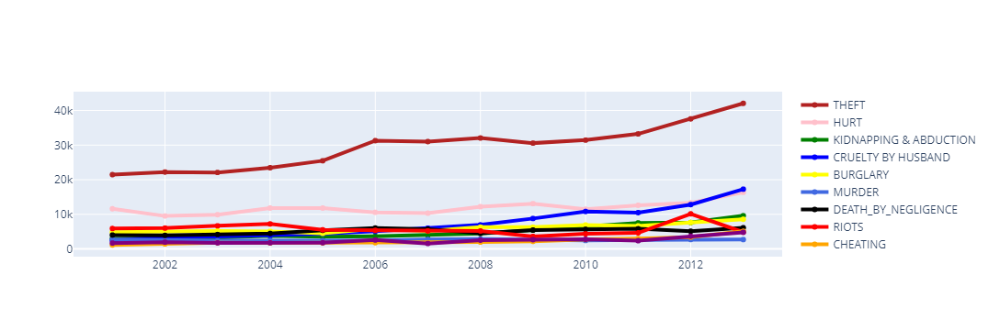

In [450]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_AS["YEAR"], y= DIST_AS['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_AS["YEAR"], y= DIST_AS['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_AS["YEAR"], y= DIST_AS['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_AS["YEAR"], y= DIST_AS["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_AS["YEAR"], y= DIST_AS['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_AS["YEAR"], y= DIST_AS['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_AS["YEAR"], y= DIST_AS['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_AS["YEAR"], y= DIST_AS['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_AS["YEAR"], y= DIST_AS['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_AS["YEAR"], y= DIST_AS['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()


In [451]:
crimes_AS_df = crimes_AS[crimes_AS.DISTRICT!="TOTAL"]
crimes_AS_df = crimes_AS_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'HURT':sum, 'CRUELTY_BY_HUSBAND':sum}).reset_index()
crimes_AS_df

,DISTRICT,TOTAL_THEFT,HURT,CRUELTY_BY_HUSBAND
0,BAKSA,458,116,47
1,BARPETA,5576,2230,3440
2,BASKA,580,513,114
3,BIEO,0,0,0
4,BONGAIGAON,2886,1219,1201
5,C.I.D.,32,0,0
6,CACHAR,13364,2936,4709
7,CHIRANG,1016,257,480
8,DARRANG,4522,3532,2023
9,DHEMAJI,3092,2617,1143


In [452]:
AS_crimes = crimes_AS_df[(crimes_AS_df.TOTAL_THEFT>10000) & (crimes_AS_df.HURT>5000) & (crimes_AS_df.CRUELTY_BY_HUSBAND>2000)].reset_index()

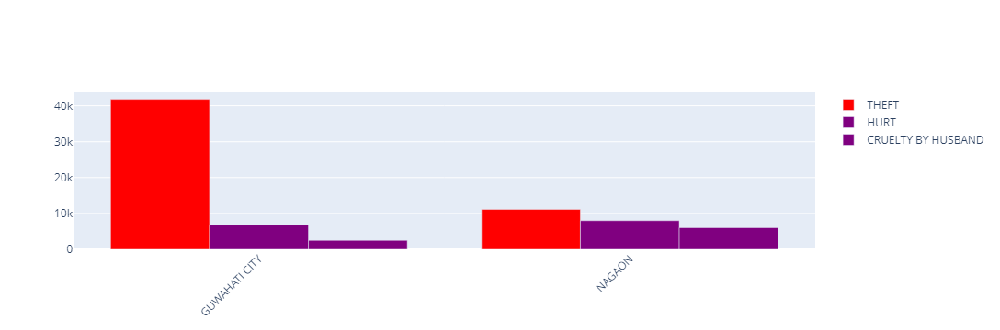

In [453]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=AS_crimes["DISTRICT"],
    y=AS_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=AS_crimes["DISTRICT"],
    y=AS_crimes["HURT"],
    name='HURT',
    marker_color='Purple'
))
fig.add_trace(go.Bar(
    x=AS_crimes["DISTRICT"],
    y=AS_crimes["CRUELTY_BY_HUSBAND"],
    name='CRUELTY BY HUSBAND',
    marker_color='Purple'
))
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [454]:
crimes_AS_clus = crimes_AS.copy()

In [455]:
crimes_AS_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)


In [456]:
crimes_AS_main = crimes_AS_clus[crimes_AS_clus.DISTRICT!="TOTAL"]
crimes_KMe_AS = crimes_AS_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()


In [457]:
scaled = StandardScaler()
scaled_AS = scaled.fit_transform(crimes_KMe_AS[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])


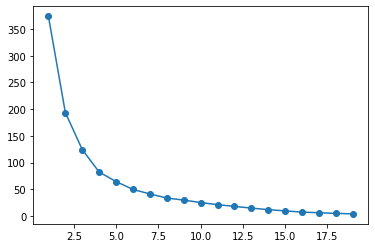

In [458]:
new_AS = range(1,20)
rate_AS = []
for i in new_MP:
    clustering = KMeans(i)
    clustering.fit(scaled_AS)
    rate_AS.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_AS, rate_AS, marker="o")

In [459]:
K=4
cluster_AS = KMeans(4, random_state = 42)
cluster_AS.fit(scaled_AS)
crimes_KMe_AS['Cluster_id'] = cluster_AS.labels_

In [460]:
crimes_KMe_AS[crimes_KMe_AS.Cluster_id==0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
1,BARPETA,5576,2230,1715,3440,2000,613,1852,668,2855,808,14913,0
8,DARRANG,4522,3532,1226,2023,1436,506,1188,600,741,1677,6013,0
11,DIBRUGARH,11522,4906,1260,1314,1361,1279,2055,441,436,715,7390,0
13,GOALPARA,4106,1904,965,2249,1019,484,1008,469,1400,489,5760,0
14,GOLAGHAT,6620,4328,1346,1511,1096,798,1672,497,165,576,4085,0
18,JORHAT,7228,3363,867,1389,1214,573,1236,624,471,633,5720,0
19,KAMRUP,8078,2504,1489,1375,1732,491,1077,642,1186,584,12704,0
22,KOKRAJHAR,3740,1985,796,896,615,758,744,288,3609,374,2750,0
23,LAKHIMPUR,5440,4550,1372,1884,968,470,1318,556,737,557,6835,0
30,SIBSAGAR,9546,3709,1357,1623,1367,906,1012,746,584,669,8621,0


In [461]:
crimes_KMe_AS[crimes_KMe_AS.Cluster_id==1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
0,BAKSA,458,116,115,47,62,80,64,37,3,13,544,1
2,BASKA,580,513,256,114,132,273,137,64,38,83,999,1
3,BIEO,0,0,0,0,0,0,0,0,0,0,0,1
4,BONGAIGAON,2886,1219,739,1201,989,318,889,276,851,179,5053,1
5,C.I.D.,32,0,8,0,0,3,0,134,0,0,252,1
7,CHIRANG,1016,257,351,480,285,247,201,99,219,112,1971,1
9,DHEMAJI,3092,2617,736,1143,412,275,555,286,260,451,3212,1
12,G.R.P.,3416,104,53,30,56,104,33,67,116,12,1381,1
16,HAILAKANDI,2614,633,744,948,818,276,312,286,1953,242,5126,1
17,HAMREN,108,21,31,3,31,20,9,2,5,2,181,1


In [462]:
crimes_KMe_AS[crimes_KMe_AS.Cluster_id==2]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
15,GUWAHATI CITY,41796,6770,3410,2493,7529,759,2648,2749,2089,1305,32713,2


In [463]:
crimes_KMe_AS[crimes_KMe_AS.Cluster_id==3]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
6,CACHAR,13364,2936,1818,4709,2778,754,2775,807,3995,945,21828,3
10,DHUBRI,5184,5945,2238,5411,1555,696,1982,1256,6396,2001,7772,3
26,NAGAON,11122,7994,3048,6030,3704,1092,3369,996,3449,1228,16102,3


In [464]:
#crimes in Rajastan
crimes_RAJ = crimes_df[crimes_df.STATE=='RAJASTHAN']
crimes_RAJ.shape

(498, 34)

In [465]:
DIST_RAJ = crimes_RAJ[crimes_RAJ.DISTRICT=='TOTAL']
DIST_RAJ= crimes_RAJ.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()

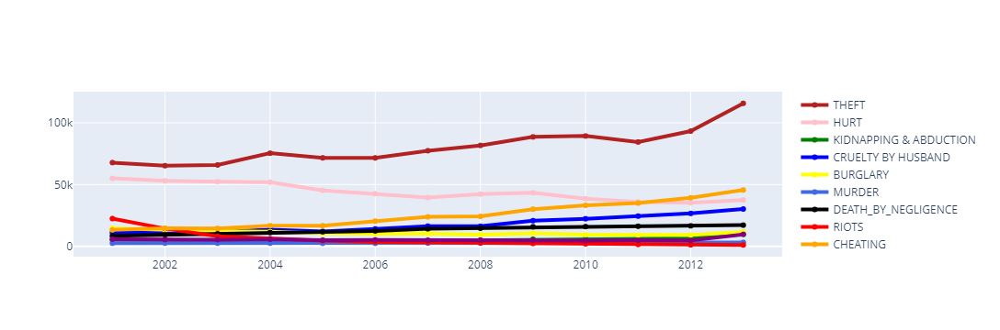

In [466]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_RAJ["YEAR"], y= DIST_RAJ['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_RAJ["YEAR"], y= DIST_RAJ['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_RAJ["YEAR"], y= DIST_RAJ['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_RAJ["YEAR"], y= DIST_RAJ["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_RAJ["YEAR"], y= DIST_RAJ['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_RAJ["YEAR"], y= DIST_RAJ['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_RAJ["YEAR"], y= DIST_RAJ['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_RAJ["YEAR"], y= DIST_RAJ['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_RAJ["YEAR"], y= DIST_RAJ['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_RAJ["YEAR"], y= DIST_RAJ['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [467]:
crimes_RAJ_df = crimes_RAJ[crimes_RAJ.DISTRICT!="TOTAL"]
crimes_RAJ_df = crimes_RAJ_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'HURT':sum, 'CHEATING':sum}).reset_index()

In [468]:
RAJ_crimes = crimes_RAJ_df[(crimes_RAJ_df.TOTAL_THEFT>10000) & (crimes_RAJ_df.HURT>5000) & (crimes_RAJ_df.CHEATING>2000)].reset_index()


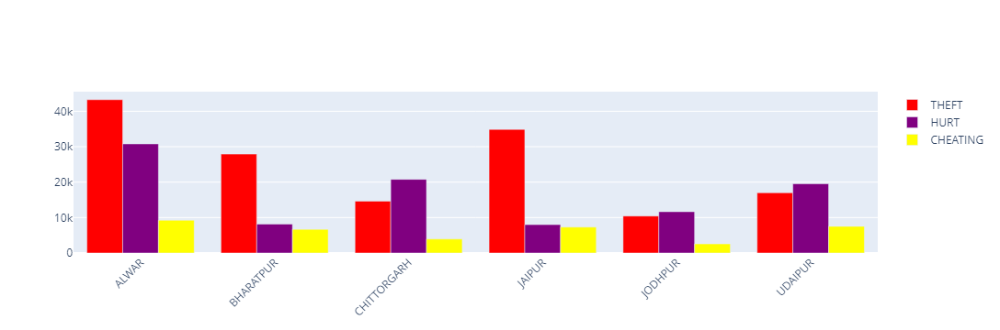

In [469]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=RAJ_crimes["DISTRICT"],
    y=RAJ_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=RAJ_crimes["DISTRICT"],
    y=RAJ_crimes["HURT"],
    name='HURT',
    marker_color='Purple'
))
fig.add_trace(go.Bar(
    x=RAJ_crimes["DISTRICT"],
    y=RAJ_crimes["CHEATING"],
    name='CHEATING',
    marker_color='yellow'
))
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [470]:
crimes_RAJ_clus = crimes_RAJ.copy()
crimes_RAJ_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)

In [471]:
crimes_RAJ_main = crimes_RAJ_clus[crimes_RAJ_clus.DISTRICT!="TOTAL"]
crimes_KMe_RAJ = crimes_RAJ_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()


In [472]:
scaled = StandardScaler()
scaled_RAJ = scaled.fit_transform(crimes_KMe_RAJ[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

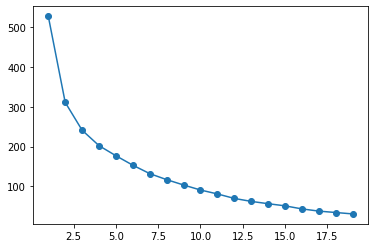

In [473]:
new_RAJ = range(1,20)
rate_RAJ = []
for i in new_MP:
    clustering = KMeans(i)
    clustering.fit(scaled_RAJ)
    rate_RAJ.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_RAJ, rate_RAJ, marker="o")

In [474]:
K=3
cluster_raj = KMeans(3, random_state = 42)
cluster_raj.fit(scaled_RAJ)
crimes_KMe_RAJ['Cluster_id'] = cluster_raj.labels_


In [475]:
crimes_KMe_RAJ[crimes_KMe_RAJ.Cluster_id==0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
2,BANSWARA,2956,12595,809,1682,953,439,1402,1064,1740,974,10109,0
3,BARAN,7926,4630,912,2899,1412,427,1232,2322,391,2072,19973,0
4,BARMER,6088,7528,356,1664,1347,287,1905,2602,212,1104,16393,0
7,BIKANER,9348,6273,476,3963,1741,527,2550,4977,129,754,22240,0
8,BUNDI,7166,10499,1161,3145,1487,297,1554,2291,712,1573,16235,0
10,CHURU,5180,8288,476,3260,1275,370,1722,3892,505,433,13425,0
11,DAUSA,18130,1133,886,1584,1118,399,2674,3184,1387,436,33666,0
12,DHOLPUR,9284,16924,782,1849,727,569,1319,1688,1188,353,11914,0
14,DUNGARPUR,1794,1999,674,1110,657,330,1390,607,1159,742,14007,0
19,HANUMANGARH,6714,5754,573,4128,1398,663,1581,5867,221,1009,21448,0


In [476]:
crimes_KMe_RAJ[crimes_KMe_RAJ.Cluster_id==1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
13,DISCOM,0,0,0,0,0,0,0,0,0,0,0,1
15,G.R.P.,9230,36,40,1,20,44,23,53,57,131,3017,1
16,G.R.P.AJMER,4334,10,24,0,4,20,7,17,11,33,580,1
17,G.R.P.JODHPUR,740,2,4,0,1,11,7,0,5,13,161,1
25,JAIPUR WEST,6974,766,338,794,968,82,821,3164,17,112,5539,1
26,JAISALMER,3308,1699,132,282,686,89,620,882,202,290,5981,1
31,JODHPUR CITY,9324,3366,314,1475,1079,117,904,3187,72,238,5450,1
32,JODHPUR EAST,1840,913,80,501,156,32,239,957,0,67,1067,1
33,JODHPUR RURAL,3648,7306,290,858,782,208,1801,1508,62,369,6501,1
34,JODHPUR WEST,2700,650,94,173,322,40,302,623,0,117,1221,1


In [477]:
crimes_KMe_RAJ[crimes_KMe_RAJ.Cluster_id==2]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
0,AJMER,19818,4452,1463,6352,3794,587,5416,8508,595,1189,41534,2
1,ALWAR,43256,30791,1961,5488,2877,1134,5168,9244,963,1767,30722,2
5,BHARATPUR,27912,8159,1939,4677,1093,1077,2798,6682,507,774,55834,2
6,BHILWARA,19034,2028,1634,5422,3316,428,3426,5470,1200,1311,33897,2
9,CHITTORGARH,14642,20790,1874,6255,3013,557,2620,3934,1862,1406,20018,2
18,GANGANAGAR,9870,12711,948,7017,2566,729,2074,8800,114,971,25257,2
20,JAIPUR,34882,7996,1167,2526,4822,439,4192,7308,8649,1006,41008,2
47,UDAIPUR,16982,19542,2085,3832,3545,897,4414,7521,3049,1865,32701,2


In [478]:
crimes_HAR = crimes_df[crimes_df.STATE=='HARYANA']
crimes_HAR.shape
DIST_HAR = crimes_HAR[crimes_HAR.DISTRICT=='TOTAL']
DIST_HAR= crimes_HAR.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()


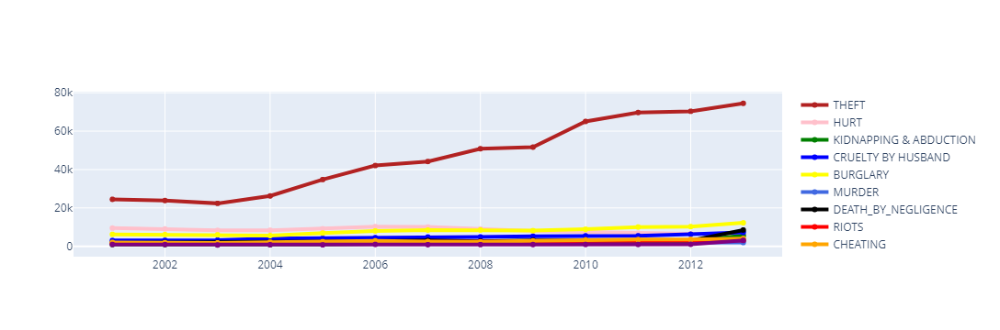

In [479]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_HAR["YEAR"], y= DIST_HAR['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_HAR["YEAR"], y= DIST_HAR['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_HAR["YEAR"], y= DIST_HAR['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_HAR["YEAR"], y= DIST_HAR["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_HAR["YEAR"], y= DIST_HAR['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_HAR["YEAR"], y= DIST_HAR['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_HAR["YEAR"], y= DIST_HAR['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_HAR["YEAR"], y= DIST_HAR['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_HAR["YEAR"], y= DIST_HAR['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_HAR["YEAR"], y= DIST_HAR['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [480]:
crimes_HAR_df = crimes_HAR[crimes_HAR.DISTRICT!="TOTAL"]
crimes_HAR_df = crimes_HAR_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum}).reset_index()
crimes_HAR_df

,DISTRICT,TOTAL_THEFT
0,AMBALA,8746
1,AMBALA RURAL,808
2,AMBALA URBAN,2076
3,BHIWANI,11498
4,FARIDABAD,31504
5,FATEHABAD,5508
6,GRP,8782
7,GURGAON,57700
8,HISSAR,17220
9,I&P HARYANA,0


In [481]:
HAR_crimes = crimes_HAR_df[(crimes_HAR_df.TOTAL_THEFT>10000)].reset_index()


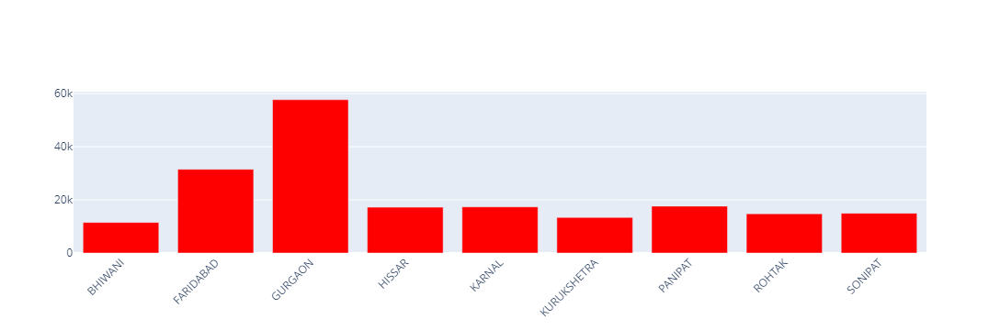

In [482]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=HAR_crimes["DISTRICT"],
    y=HAR_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [483]:
crimes_HAR_clus = crimes_HAR.copy()
crimes_HAR_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)


In [484]:
crimes_HAR_main = crimes_HAR_clus[crimes_HAR_clus.DISTRICT!="TOTAL"]
crimes_KMe_Har = crimes_HAR_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()

In [485]:
scaled = StandardScaler()
scaled_HAR = scaled.fit_transform(crimes_KMe_Har[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

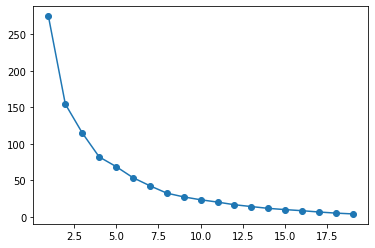

In [486]:
new_Har = range(1,20)
rate_har = []
for i in new_Har:
    clustering = KMeans(i)
    clustering.fit(scaled_HAR)
    rate_har.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_Har, rate_har, marker="o")

In [487]:
K=2
cluster_guj = KMeans(2, random_state = 42)
cluster_guj.fit(scaled_HAR)
crimes_KMe_Har['Cluster_id'] = cluster_guj.labels_


In [488]:
crimes_KMe_Har[crimes_KMe_Har.Cluster_id==0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
0,AMBALA,8746,2518,310,1806,2959,350,30,1030,24,235,11279,0
1,AMBALA RURAL,808,133,95,152,210,30,124,92,0,44,801,0
2,AMBALA URBAN,2076,200,234,329,756,32,123,178,4,71,1342,0
5,FATEHABAD,5508,2209,365,1209,1483,297,143,803,248,215,7478,0
6,GRP,8782,175,49,2,17,287,208,89,146,65,5922,0
9,I&P HARYANA,0,0,0,0,0,0,0,0,0,0,649,0
10,JHAJJAR,7692,1725,315,1335,1647,681,2118,561,722,313,6219,0
11,JIND,8892,1893,398,956,2195,541,203,569,1228,266,8391,0
12,KAITHAL,6390,2589,303,1747,1750,352,204,285,0,227,7082,0
14,KURUKSHETRA,13384,2372,359,1249,2772,341,219,1055,3,296,11724,0


In [489]:
crimes_KMe_Har[crimes_KMe_Har.Cluster_id==1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
3,BHIWANI,11498,3391,645,1232,2906,709,253,1163,1814,437,13288,1
4,FARIDABAD,31504,3127,1266,2240,3856,829,1527,684,2028,510,29563,1
7,GURGAON,57700,2214,992,1646,6377,1020,651,2024,1238,402,24435,1
8,HISSAR,17220,4257,700,2436,3530,763,257,1889,684,456,17516,1
13,KARNAL,17362,6656,787,2409,3372,569,3110,1455,595,544,9273,1
19,PANIPAT,17628,2183,687,1667,2457,593,2941,605,673,287,8983,1
21,ROHTAK,14764,2238,407,1101,3212,805,2338,1009,719,312,9451,1
23,SONIPAT,14948,3494,625,1617,2644,994,3259,1019,76,377,11728,1


In [490]:
crimes_ODI = crimes_df[crimes_df.STATE=='ODISHA']
crimes_ODI.shape
DIST_ODI = crimes_ODI[crimes_ODI.DISTRICT=='TOTAL']
DIST_ODI = crimes_ODI.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()

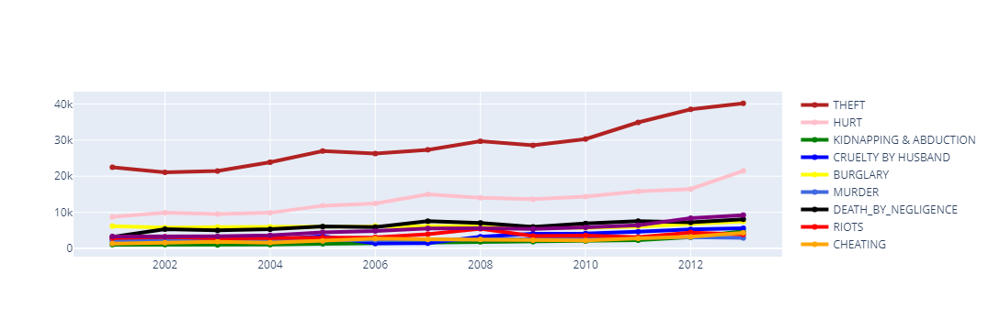

In [491]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_ODI["YEAR"], y= DIST_ODI['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_ODI["YEAR"], y= DIST_ODI['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_ODI["YEAR"], y= DIST_ODI['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_ODI["YEAR"], y= DIST_ODI["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_ODI["YEAR"], y= DIST_ODI['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_ODI["YEAR"], y= DIST_ODI['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_ODI["YEAR"], y= DIST_ODI['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_ODI["YEAR"], y= DIST_ODI['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_ODI["YEAR"], y= DIST_ODI['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_ODI["YEAR"], y= DIST_ODI['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [492]:
crimes_ODI_df = crimes_ODI[crimes_ODI.DISTRICT!="TOTAL"]
crimes_ODI_df = crimes_ODI_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'HURT':sum}).reset_index()
crimes_ODI_df

,DISTRICT,TOTAL_THEFT,HURT
0,ANGUL,8932,594
1,BALASORE,7444,10460
2,BARAGARH,4210,696
3,BERHAMPUR,4650,2193
4,BHADRAK,2878,343
5,BOLANGIR,3924,1164
6,BOUDH,904,1737
7,CUTTACK,12304,2016
8,DCP BBSR,15014,4517
9,DCP CTC,7160,131


In [493]:
ODI_crimes = crimes_ODI_df[(crimes_ODI_df.TOTAL_THEFT>10000) & (crimes_ODI_df.HURT>2000)].reset_index()


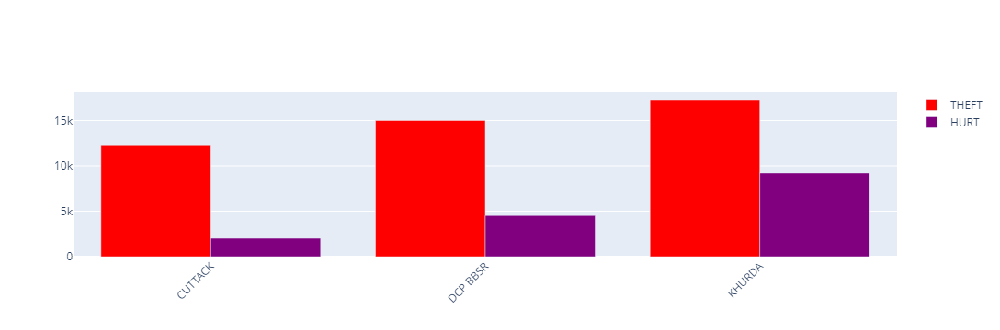

In [494]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=ODI_crimes["DISTRICT"],
    y=ODI_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=ODI_crimes["DISTRICT"],
    y=ODI_crimes["HURT"],
    name='HURT',
    marker_color='Purple'
))
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [495]:
crimes_ODI_clus = crimes_ODI.copy()
crimes_ODI_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)


In [496]:
crimes_ODI_main = crimes_ODI_clus[crimes_ODI_clus.DISTRICT!="TOTAL"]
crimes_KMe_ODI = crimes_ODI_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()


In [497]:
scaled = StandardScaler()
scaled_ODI = scaled.fit_transform(crimes_KMe_ODI[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])
 


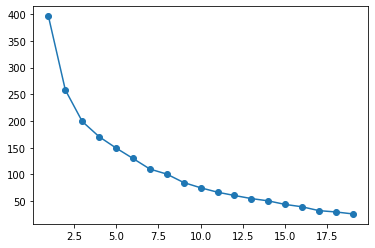

In [498]:
new_odi = range(1,20)
rate_odi = []
for i in new_odi:
    clustering = KMeans(i)
    clustering.fit(scaled_ODI)
    rate_odi.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_odi, rate_odi, marker="o")

In [499]:
K=2
cluster_odi = KMeans(2, random_state = 42)
cluster_odi.fit(scaled_ODI)
crimes_KMe_ODI['Cluster_id'] = cluster_odi.labels_


In [500]:
crimes_KMe_ODI[crimes_KMe_ODI.Cluster_id==0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
0,ANGUL,8932,594,464,754,1562,656,2244,503,1588,2337,14536,0
1,BALASORE,7444,10460,900,2062,2398,515,17,853,693,1851,12914,0
7,CUTTACK,12304,2016,638,1410,2732,519,3194,885,767,463,20793,0
8,DCP BBSR,15014,4517,363,306,1717,254,1024,987,361,366,7736,0
13,GANJAM,4170,3340,435,385,1618,917,1374,401,1351,3078,7352,0
15,JAJPUR,6344,7795,566,1087,1418,567,2337,431,682,880,6416,0
20,KEONJHAR,6172,2420,526,850,1149,1085,3718,377,939,2021,8718,0
21,KHURDA,17280,9204,671,1397,3994,559,1692,1814,852,811,14764,0
24,MAYURBHANJ,5938,1936,694,1479,1439,1106,1737,519,373,2427,12331,0
28,PURI,8400,1212,497,905,2143,556,1918,628,1009,284,19735,0


In [501]:
crimes_KMe_ODI[crimes_KMe_ODI.Cluster_id==1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
2,BARAGARH,4210,696,211,1017,978,416,1483,346,1221,1081,7375,1
3,BERHAMPUR,4650,2193,242,483,1151,265,902,591,502,1319,5071,1
4,BHADRAK,2878,343,513,1258,878,399,871,567,487,1002,15038,1
5,BOLANGIR,3924,1164,337,575,1127,450,908,620,1109,1736,10983,1
6,BOUDH,904,1737,106,169,284,164,127,62,301,623,1396,1
9,DCP CTC,7160,131,233,622,788,151,985,392,173,141,6059,1
10,DEOGARH,842,2233,92,180,294,202,406,96,195,731,1257,1
11,DHENKANAL,4412,852,328,387,935,548,1208,382,1210,2207,8542,1
12,GAJAPATI,744,525,102,117,265,173,361,139,482,505,1830,1
14,JAGATSINGHPUR,4788,1794,414,683,1062,374,2176,394,395,348,7604,1


In [502]:
#Crimes in KARNATAKA
crimes_KAR = crimes_df[crimes_df.STATE=='KARNATAKA']
crimes_KAR.shape
DIST_KAR = crimes_KAR[crimes_KAR.DISTRICT=='TOTAL']
DIST_KAR = crimes_KAR.groupby(['YEAR']).agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum}).reset_index()

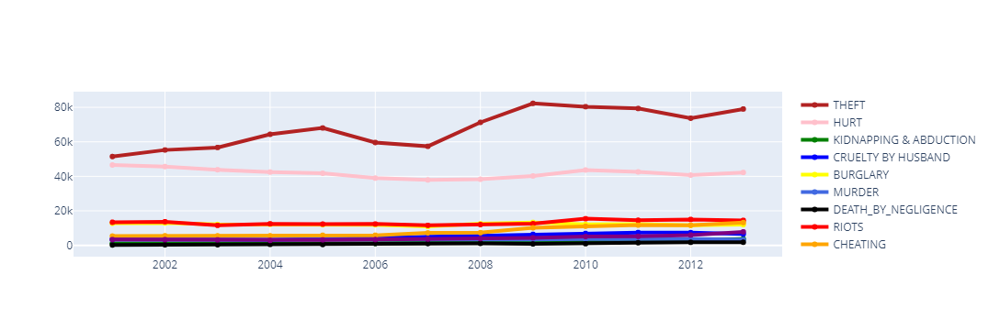

In [503]:
fig = go.Figure()
fig.add_trace(go.Scatter(x= DIST_KAR["YEAR"], y= DIST_KAR['TOTAL_THEFT'],
                    name = "THEFT",line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= DIST_KAR["YEAR"], y= DIST_KAR['HURT'],
                    name='HURT',line=dict(color='pink', width=4)))
fig.add_trace(go.Scatter(x= DIST_KAR["YEAR"], y= DIST_KAR['KIDNAPPING'],
                    name='KIDNAPPING & ABDUCTION',line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x= DIST_KAR["YEAR"], y= DIST_KAR["CRUELTY_BY_HUSBAND"],
                    name='CRUELTY BY HUSBAND',line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x= DIST_KAR["YEAR"], y= DIST_KAR['BURGLARY'],
                    name='BURGLARY',line=dict(color='yellow', width=4)))
fig.add_trace(go.Scatter(x= DIST_KAR["YEAR"], y= DIST_KAR['MURDER'],
                    name='MURDER',line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x= DIST_KAR["YEAR"], y= DIST_KAR['DEATH_BY_NEGLIGENCE'],
                    name='DEATH_BY_NEGLIGENCE',line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x= DIST_KAR["YEAR"], y= DIST_KAR['RIOTS'],
                    name='RIOTS',line=dict(color='red', width=4)))
fig.add_trace(go.Scatter(x= DIST_KAR["YEAR"], y= DIST_KAR['CHEATING'],
                    name='CHEATING',line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x= DIST_KAR["YEAR"], y= DIST_KAR['ASSAULT_WOMEN_MODESTY'],
                    name='ASSAULT_WOMEN_MODESTY',line=dict(color='purple', width=4)))
fig.update_layout(uniformtext_minsize= 20)
fig.show()

In [504]:
crimes_KAR_df = crimes_KAR[crimes_KAR.DISTRICT!="TOTAL"]
crimes_KAR_df = crimes_KAR_df.groupby('DISTRICT').agg({"TOTAL_THEFT":sum, 'HURT':sum}).reset_index()
crimes_KAR_df

,DISTRICT,TOTAL_THEFT,HURT
0,BAGALKOT,3516,3629
1,BANGALORE COMMR.,232154,41105
2,BANGALORE RURAL,19302,11366
3,BELGAUM,11204,11894
4,BELLARY,7740,6634
5,BIDAR,4968,12659
6,BIJAPUR,3768,7792
7,CBPURA,3080,2328
8,CHAMARAJNAGAR,3264,5863
9,CHICKMAGALUR,5338,10156


In [505]:
KAR_crimes = crimes_KAR_df[(crimes_KAR_df.TOTAL_THEFT>10000) & (crimes_KAR_df.HURT>5000)].reset_index()


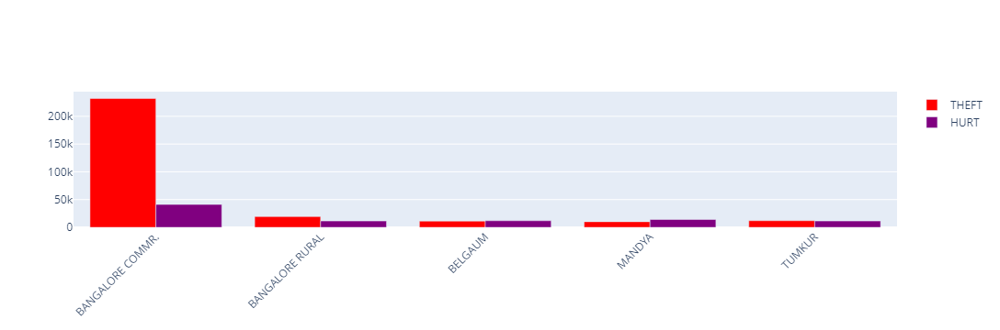

In [506]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=KAR_crimes["DISTRICT"],
    y=KAR_crimes["TOTAL_THEFT"],
    name='THEFT',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=KAR_crimes["DISTRICT"],
    y=KAR_crimes["HURT"],
    name='HURT',
    marker_color='Purple'
))
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [507]:
crimes_KAR_clus = crimes_KAR.copy()
crimes_KAR_clus.drop(["STATE", 'TOTAL', 'YEAR', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE',  'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'COUNTERFIETING', 'ARSON', 'DOWRY DEATHS', 'INSULT TO MODESTY OF WOMEN', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'], axis=1 ,inplace = True)


In [508]:
crimes_KAR_main = crimes_KAR_clus[crimes_KAR_clus.DISTRICT!="TOTAL"]
crimes_KMe_kar = crimes_KAR_main.groupby("DISTRICT").agg({'TOTAL_THEFT':sum,'HURT':sum,'KIDNAPPING':sum,'CRUELTY_BY_HUSBAND':sum, 
                                                       'BURGLARY':sum, 'MURDER':sum,'DEATH_BY_NEGLIGENCE':sum,
                                                      'CHEATING':sum, 'RIOTS':sum, 'ASSAULT_WOMEN_MODESTY':sum, 'OTHER IPC CRIMES':sum}).reset_index()

In [509]:
scaled = StandardScaler()
scaled_Kar = scaled.fit_transform(crimes_KMe_kar[['TOTAL_THEFT','HURT','KIDNAPPING','CRUELTY_BY_HUSBAND', 
                                                       'BURGLARY', 'MURDER','DEATH_BY_NEGLIGENCE',
                                                      'CHEATING', 'RIOTS', 'ASSAULT_WOMEN_MODESTY', 'OTHER IPC CRIMES']])

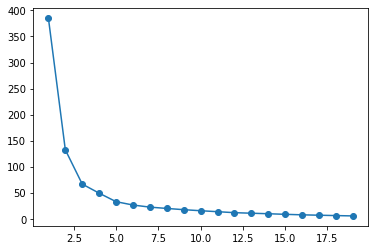

In [510]:
new_kar = range(1,20)
rate_kar = []
for i in new_kar:
    clustering = KMeans(i)
    clustering.fit(scaled_Kar)
    rate_kar.append(clustering.inertia_)
    
plt.figure(figsize=(6,4))
plt.plot(new_kar, rate_kar, marker="o")

In [511]:
K=3
cluster_kar = KMeans(3, random_state = 42)
cluster_kar.fit(scaled_Kar)
crimes_KMe_kar['Cluster_id'] = cluster_kar.labels_


In [512]:
crimes_KMe_kar[crimes_KMe_kar.Cluster_id==0]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
0,BAGALKOT,3516,3629,237,758,1130,589,0,571,2454,690,14130,0
7,CBPURA,3080,2328,145,280,696,271,8,373,1315,282,5798,0
8,CHAMARAJNAGAR,3264,5863,99,412,864,334,0,238,1471,622,8131,0
9,CHICKMAGALUR,5338,10156,214,1104,1938,436,50,427,1901,833,16450,0
11,DAKSHIN KANNADA,5736,5685,149,534,2452,403,121,962,2632,551,26498,0
13,DHARWAD COMMR.,8080,2400,308,511,1780,245,80,1514,1302,172,12454,0
14,DHARWAD RURAL,1444,1908,100,225,409,348,4,203,1279,284,8244,0
15,GADAG,1794,2053,96,349,666,270,898,285,1402,397,5632,0
18,HAVERI,3006,3614,180,500,981,299,1166,437,3041,620,14218,0
19,K.G.F.,2642,3081,116,261,847,179,184,250,780,194,3891,0


In [513]:
crimes_KMe_kar[crimes_KMe_kar.Cluster_id==1]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
1,BANGALORE COMMR.,232154,41105,3656,4314,21372,3048,1342,29388,5027,3008,132148,1


In [514]:
crimes_KMe_kar[crimes_KMe_kar.Cluster_id==2]

,DISTRICT,TOTAL_THEFT,HURT,KIDNAPPING,CRUELTY_BY_HUSBAND,BURGLARY,MURDER,DEATH_BY_NEGLIGENCE,CHEATING,RIOTS,ASSAULT_WOMEN_MODESTY,OTHER IPC CRIMES,Cluster_id
2,BANGALORE RURAL,19302,11366,523,1261,4579,1648,24,1537,4835,1171,43135,2
3,BELGAUM,11204,11894,553,2542,3258,1515,418,2726,5303,1822,41496,2
4,BELLARY,7740,6634,291,861,1988,703,161,934,2886,828,24334,2
5,BIDAR,4968,12659,287,944,1909,512,68,529,2141,794,25325,2
6,BIJAPUR,3768,7792,375,1484,1636,802,0,753,3772,977,19417,2
10,CHITRADURGA,5924,10521,254,712,1584,470,5,506,3594,1132,25938,2
12,DAVANAGERE,7386,6744,252,1219,2129,455,50,740,3296,1040,18963,2
16,GULBARGA,7436,14059,648,1656,2753,1270,202,1008,5798,1389,25618,2
17,HASSAN,8848,16410,323,1370,2971,812,0,861,2498,1147,29834,2
23,MANDYA,10110,14148,326,1514,2931,806,0,671,3660,1136,30264,2
